In [27]:
#Encerrar a conexão com os dispositivos
DAC.close()
scope.close()
rm.close()


In [1]:
import pyvisa as pv
import time
import numpy as np
import matplotlib.pyplot as plt
import scipy.io as sio   
import pickle
import scipy.signal
from tqdm.notebook import tqdm, trange
from scipy.special import erfc
import scipy as sp
from optic.comm.modulation import modulateGray, demodulateGray
from optic.dsp.core import firFilter, pulseShape, lowPassFIR, pnorm, upsample, decimate,clockSamplingInterp,symbolSync
from optic.comm.metrics import signal_power,fastBERcalc
from optic.dsp.equalization import *
from optic.plot import eyediagram
from optic.dsp.clockRecovery import gardnerClockRecovery
from optic.utils import parameters

import scienceplots
plt.style.use(['science','ieee'])
plt.rcParams["figure.figsize"] = (3,3)

from funcoesLab import *

c:\Users\lucas\anaconda3\envs\Opticompy\lib\site-packages\matplotlib\projections\__init__.py:63: UserWarning: Unable to import Axes3D. This may be due to multiple versions of Matplotlib being installed (e.g. as a system package and as a pip package). As a result, the 3D projection is not available.
  warnings.warn("Unable to import Axes3D. This may be due to multiple versions of "


In [33]:
# #Conectar dispositivos

rm = pv.ResourceManager()
print(rm.list_resources())

DAC = rm.open_resource('USB0::0x0957::0x5707::MY53802202::0::INSTR')

print('info DAC:', DAC.query('*IDN?'))

DAC.write('*rst')
DAC.write('*opc?') 

scope = rm.open_resource('USB0::0x2A8D::0x1768::MY55440748::0::INSTR')
print('Info Osciloscopio:', scope.query('*IDN?'))
scope.write('*rst')
scope.write('*opc?') 

np.set_printoptions(threshold=np.inf)
del DAC.timeout
print('')

('USB0::0x0957::0x5707::MY53802202::0::INSTR', 'USB0::0x2A8D::0x1768::MY55440748::0::INSTR')
info DAC: Agilent Technologies,33622A,MY53802202,A.01.11-2.25-03-64-02

Info Osciloscopio: KEYSIGHT TECHNOLOGIES,DSO-X 3014T,MY55440748,04.06.2015051201




In [3]:
Modulador = {
    'M': 4,
    'nsimbolos': 1e6,
    'SPS': 2,
    'formatoPulso': 'rrc', #'rect','nrz','rrc'
    'nTaps': 2048,
    'alpha': 0.01,
    'W': np.load('Taps-pre-equalizacao-500Mbs-Optico.npy')
}

Dac = {
    'dispositivo': DAC,
    'Porta': 2,
    'fs': 500e6,
    'off_amp': True,
    'Amplitude': 5,
    'Off-set':0,
    'V_High': 4,
    'V_Low': 0,
    'filtro': 'NORMal'
}


Osciloscopio = {
    'dispositivo': scope,
    'canais': np.array([3]),
    'tempo': 1*Modulador['nsimbolos']/(Dac['fs']),
    'vDivisao': np.array([500e-3]),
    'impedancia': np.array(['FIFTy']),
    'triggerChannel': np.array([0]),
    'triggerAmp': np.array([0]),
    'offset': np.array([0]),
}

#Gerando os sinais transmitidos
bits, pulso,transmitido, transmitidoequalizados = Gerar_Simbolos(Modulador)
#Gerando uma onda arbitraria no DAC
Onda_Dac_Keysight(Dac,Modulador,transmitido,'teste')
DAC.query('*OPC?')   
#Configurando o osciloscopio
ConfigurarScope(Osciloscopio)
# Fixar o sinal no osciloscopio
Osciloscopio['dispositivo'].write('digitize')
Osciloscopio['dispositivo'].query('*OPC?')   

t,recebido = AdquirirOnda(Osciloscopio['dispositivo'],3)
fsScope = float(Osciloscopio['dispositivo'].query(':ACQuire:SRATe?'))

print(f'Numero de pontos do osciloscopio: {len(recebido)}')
print(f'Frequencia de amostragem do osciloscopio: {round(fsScope*1e-6,3)} MHz')



-410,"Query INTERRUPTED"

Numero de pontos do osciloscopio: 2000000
Frequencia de amostragem do osciloscopio: 1000.0 MHz


BER: 0.195564
SER: 0.375454
Numero de error totais: 215968
SNR: 4.950183022953421 dB
Numero de erros teoricos para essa SNR: 0.19759497840241305


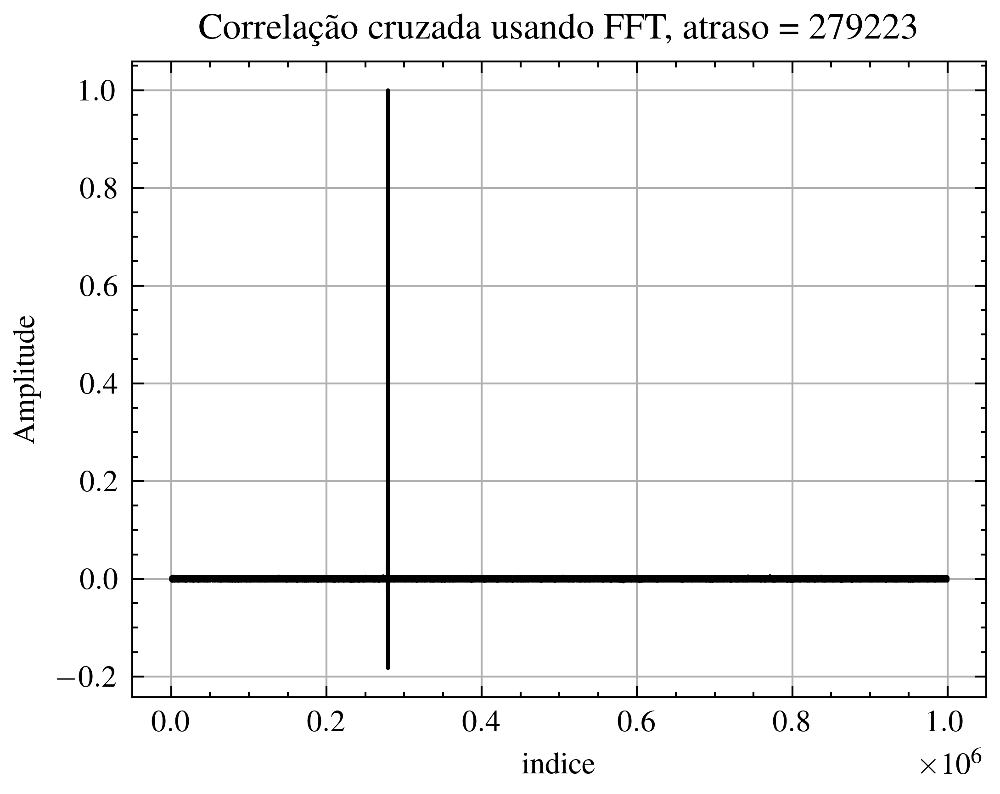

<Figure size 2400x1800 with 0 Axes>

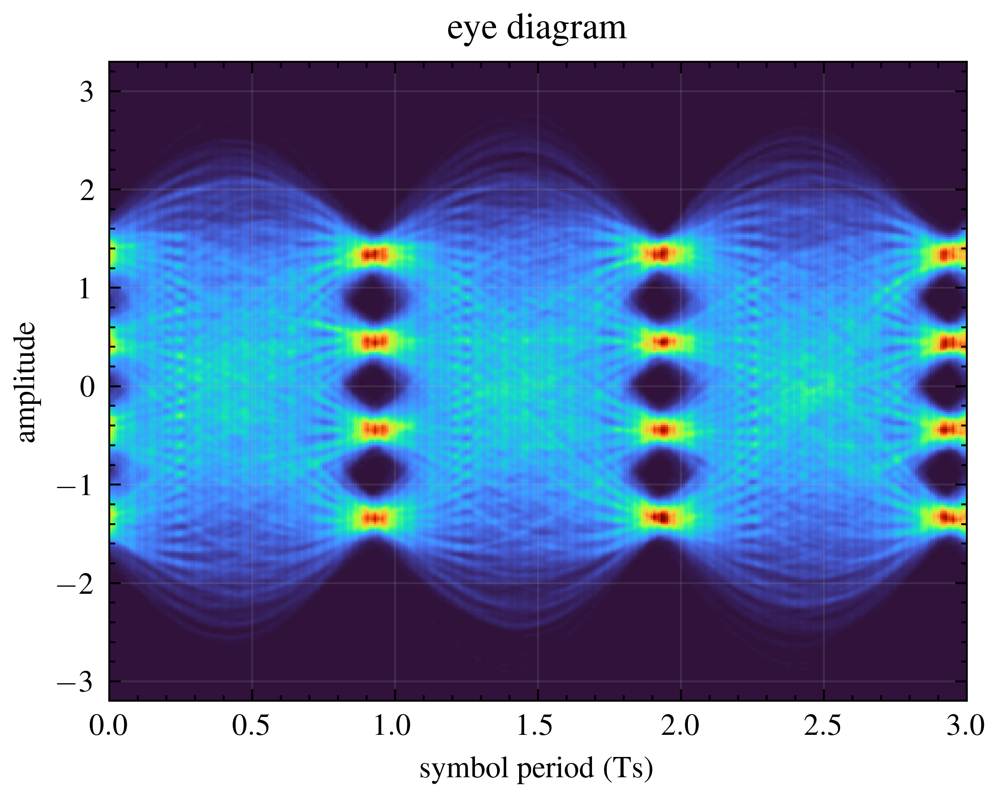

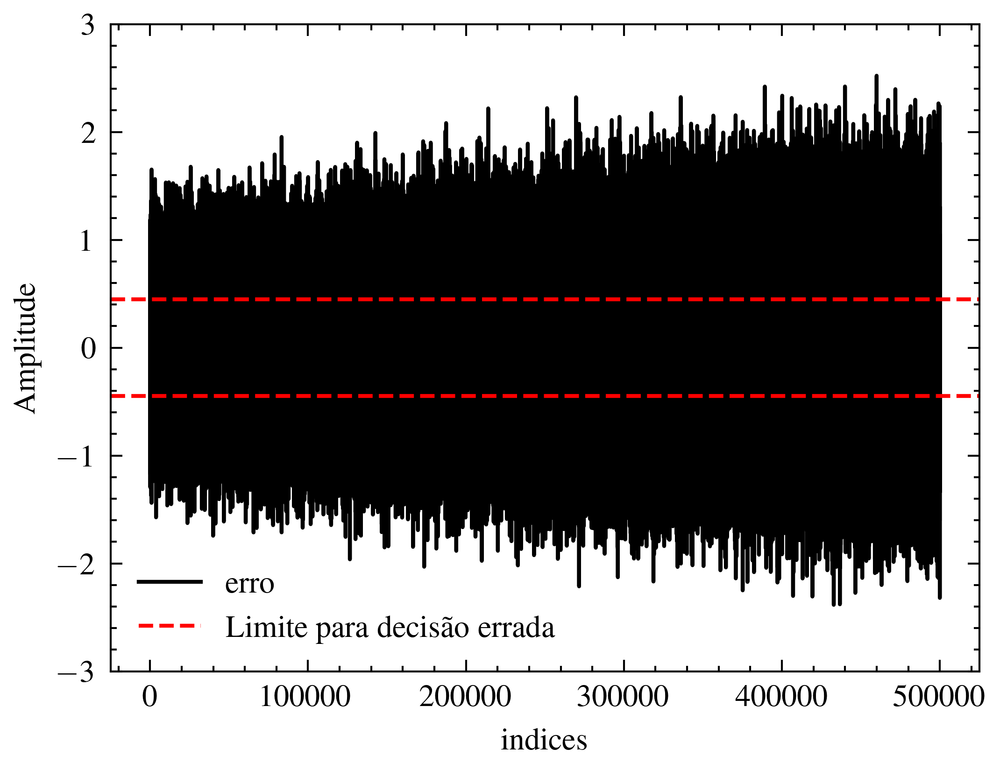

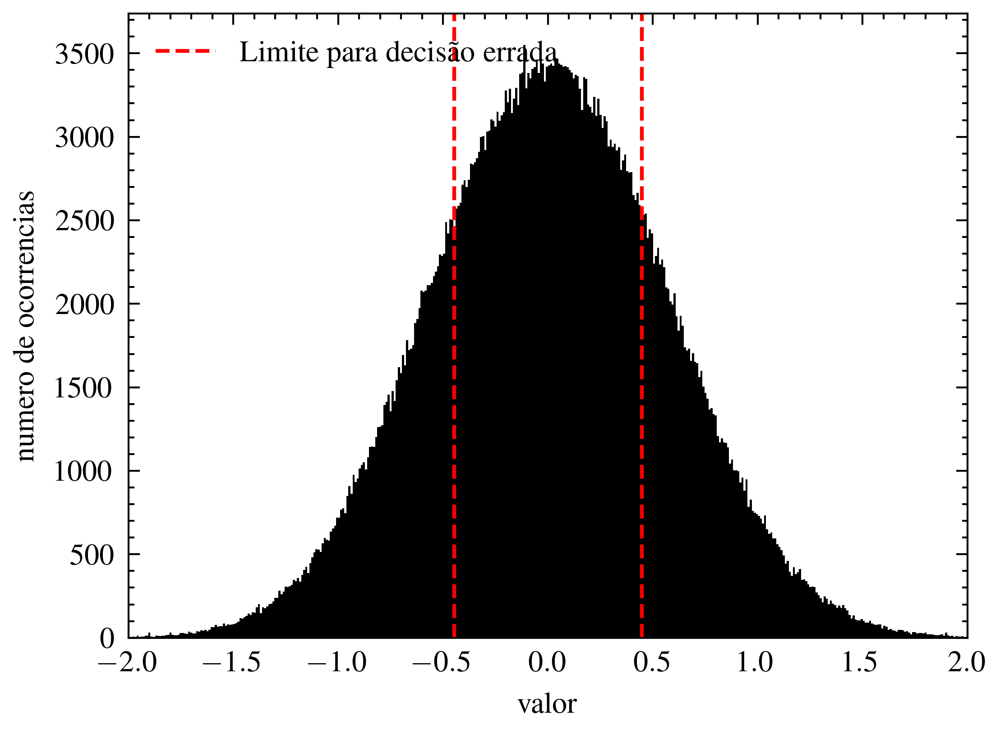

In [52]:
def recepcao(bits,transmitido,recebido,fsScope,Modulador,Dac,ClockRecovery,plot=False):

    paramCLKREC = parameters()
    paramCLKREC.isNyquist = True
    paramCLKREC.returnTiming = True
    paramCLKREC.ki = ClockRecovery['Ki']
    paramCLKREC.kp = ClockRecovery['Kp']
    #paramCLKREC.maxPPM = 1

    transmitido = pnorm(transmitido-np.mean(transmitido))
    recebido = pnorm(recebido-np.mean(recebido))

    pulso = pulseShape(Modulador['formatoPulso'], (fsScope/Dac['fs']), Modulador['nTaps'], Modulador['alpha'])
    pulso = pulso/max(abs(pulso))
    filtrocasado = firFilter(pulso,recebido)
    filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
    olho = filtrocasado
    if ((fsScope/Dac['fs']))!=2.0:
        print('oi') 
        filtrocasado = clockSamplingInterp(filtrocasado.reshape(-1,1),Fs_in=(fsScope/Dac['fs']),Fs_out=2,jitter_rms=0)[:,0]
    # filtrocasado, ted_values = gardnerClockRecovery(filtrocasado, paramCLKREC)
    # filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
    # filtrocasado = filtrocasado[:,0]
    recebidodecimado = clockSamplingInterp(filtrocasado.reshape(-1,1),Fs_in=2,Fs_out=1,jitter_rms=0)[:,0]
    recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))
    recebidosicronizado = recebidodecimado

    simbolos = modulateGray(bits,Modulador['M'],'pam')
    simbolos = pnorm(simbolos-np.mean(simbolos))

    simbolos,delay = sicronizarSinais(simbolos,(recebidosicronizado),plot=plot,returnTiming=True)
    #simbolos = simbolos[0:len(simbolos)]
    simbolos = pnorm(simbolos-np.mean(simbolos))
    simbolos = simbolos[ClockRecovery['Descarte']:]
    recebidosicronizado = recebidosicronizado[ClockRecovery['Descarte']:]
    diferenca = simbolos - recebidosicronizado
    ber,ser,SNRdB = (fastBERcalc(pnorm(recebidosicronizado), pnorm(simbolos), Modulador['M'], 'pam'))
    erros = np.argwhere(np.abs(diferenca)>0.4470)

    print(f'BER: {ber[0]}')
    print(f'SER: {ser[0]}')
    print(f'Numero de error totais: {len(erros)}')
    print(f'SNR: {SNRdB[0]} dB')

    from scipy.special import erfc

    def Q(x):
        return 0.5*erfc(x/np.sqrt(2))
    SNR = 10**(SNRdB[0]/10)
    print(f'Numero de erros teoricos para essa SNR: {2*(4-1)/4*Q(np.sqrt((6*SNR)/(4**2-1)))}')

    # print(len(recebidosicronizado))
    # print(len(simbolos))
    # # recebidosicronizado = recebidosicronizado[1:-1]
    # # simbolos = simbolos[1:-1]

    if plot==True:
        plt.figure()
        eyediagram(olho,len(olho),(fsScope/Dac['fs']),ptype='fancy')
        
        # plt.figure()
        # plt.plot(ted_values)
        # plt.xlabel('Indice')
        # plt.ylabel('Correção do clock')
        # plt.title('Clock corrigido pelo Gardner Timing Recovery')
        # plt.grid()
        
        # plt.figure()
        # plt.plot((simbolos)[0:0+20],'o-',label='Simbolos transmitidos')
        # plt.plot((recebidosicronizado)[0:0+20],'o-',label='Simbolos recebidos')
        # plt.title('Comparação dos simbolos')
        # plt.xlabel('indices')
        # plt.ylabel('Amplitude')
        # plt.grid()
        # plt.legend()

        plt.figure()
        plt.plot(diferenca,label='erro')
        plt.axhline(-0.4470,linestyle='--',color='r',label='Limite para decisão errada')
        plt.axhline(0.4470,linestyle='--',color='r')
        plt.ylim(-3,3)
        #plt.title('Erro entre os simbolos transmitidos e recebidos')
        plt.xlabel('indices')
        plt.ylabel('Amplitude')
        # plt.grid()
        plt.legend()

        plt.figure()
        plt.hist(diferenca,bins=500)
        plt.axvline(-0.4470,linestyle='--',color='r',label='Limite para decisão errada')
        plt.axvline(0.4470,linestyle='--',color='r')
        plt.xlim(-2,2)
        #plt.title('Distribuição do erro entre os simbolos transmitidos e recebidos')
        plt.xlabel('valor')
        plt.ylabel('numero de ocorrencias')
        # plt.grid()
        plt.legend()

        # plt.figure()
        # plt.title('Densidade Espectral de Potencia dos Sinais')
        # plt.psd(recebido,Fs=fsScope, NFFT = 1024, sides='twosided', label = 'Recebido')
        # plt.psd(transmitido,Fs=Dac['fs']*Modulador['SPS'], NFFT = 1024, sides='twosided', label = 'Transmitido')
        # plt.legend()

        # plt.figure()
        # plt.plot(erros,'o-')
        # plt.title(f'Indice dos erros: atraso da sicronização = {delay}')
        # plt.grid()
        # plt.xlabel('Indice do erro')
        # plt.ylabel('Posição do erro')
        # plt.xlim(0,len(erros)-1)
    #return 1,1,len(erros),1
    return diferenca,ser[0],len(erros),SNRdB[0]

ClockRecovery = {
    'Ki': 1e-10,
    'Kp': 1e-5,
    'Descarte': 500000
}
plt.rcParams["figure.figsize"] = (4,3)

diferecasem,ser,Nerros,SNRdB = recepcao(bits,transmitido,recebido,fsScope,Modulador,Dac,ClockRecovery,plot=True)

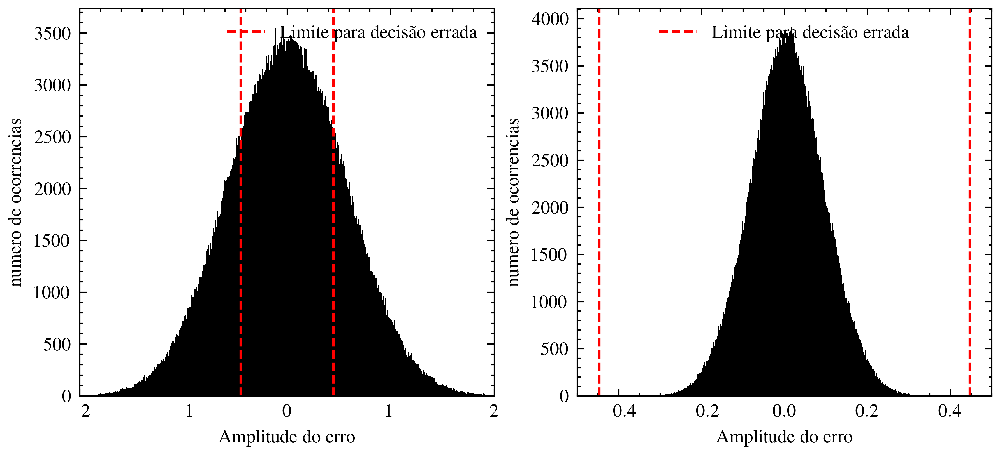

In [57]:
plt.rcParams["figure.figsize"] = (7,3)

fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.hist(diferecasem,bins=500)
ax1.axvline(-0.4470,linestyle='--',color='r',label='Limite para decisão errada')
ax1.axvline(0.4470,linestyle='--',color='r')
ax1.set_xlim(-2,2)
#plt.title('Distribuição do erro entre os simbolos transmitidos e recebidos')
ax1.set_xlabel('Amplitude do erro')
ax1.set_ylabel('numero de ocorrencias')
ax1.legend()
# plt.grid()


ax2.hist(diferecacom,bins=500)
ax2.axvline(-0.4470,linestyle='--',color='r',label='Limite para decisão errada')
ax2.axvline(0.4470,linestyle='--',color='r')
ax2.set_xlim(-0.5,0.5)
#plt.title('Distribuição do erro entre os simbolos transmitidos e recebidos')
ax2.set_xlabel('Amplitude do erro')
ax2.set_ylabel('numero de ocorrencias')
# plt.grid()
ax2.legend()

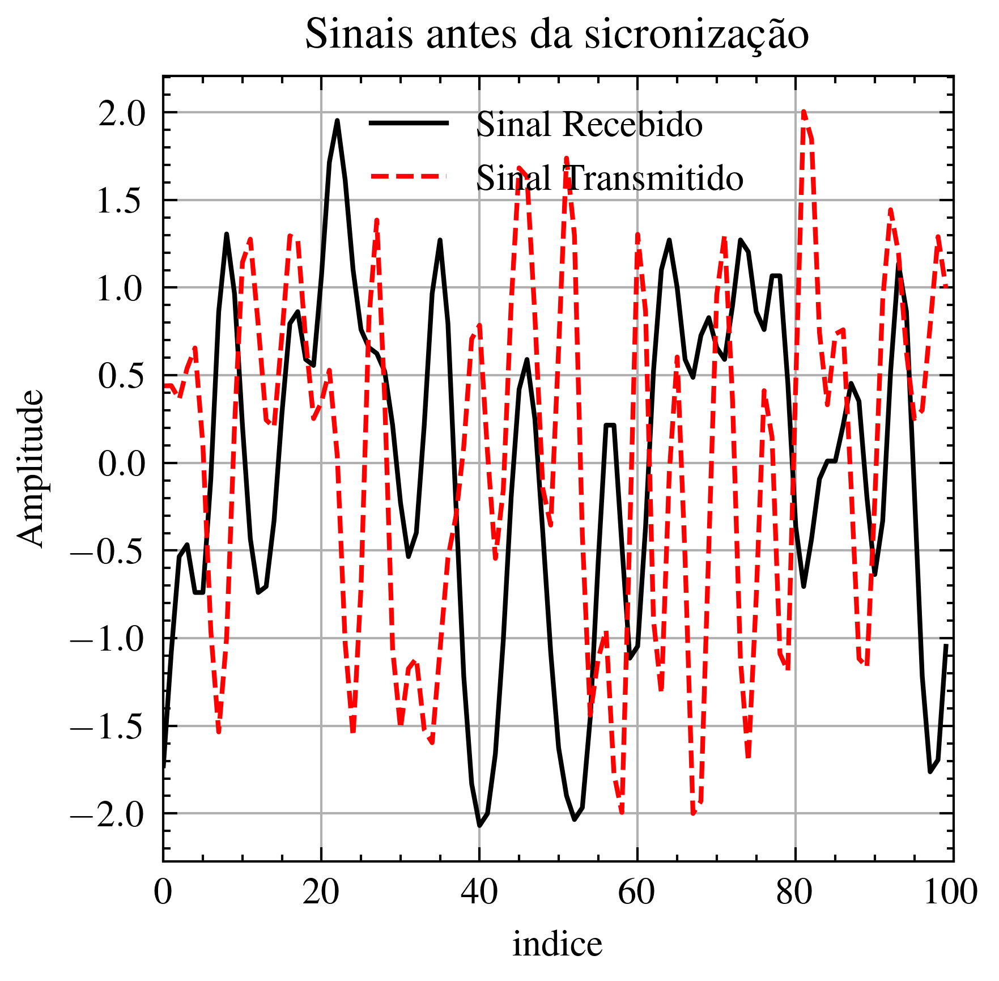

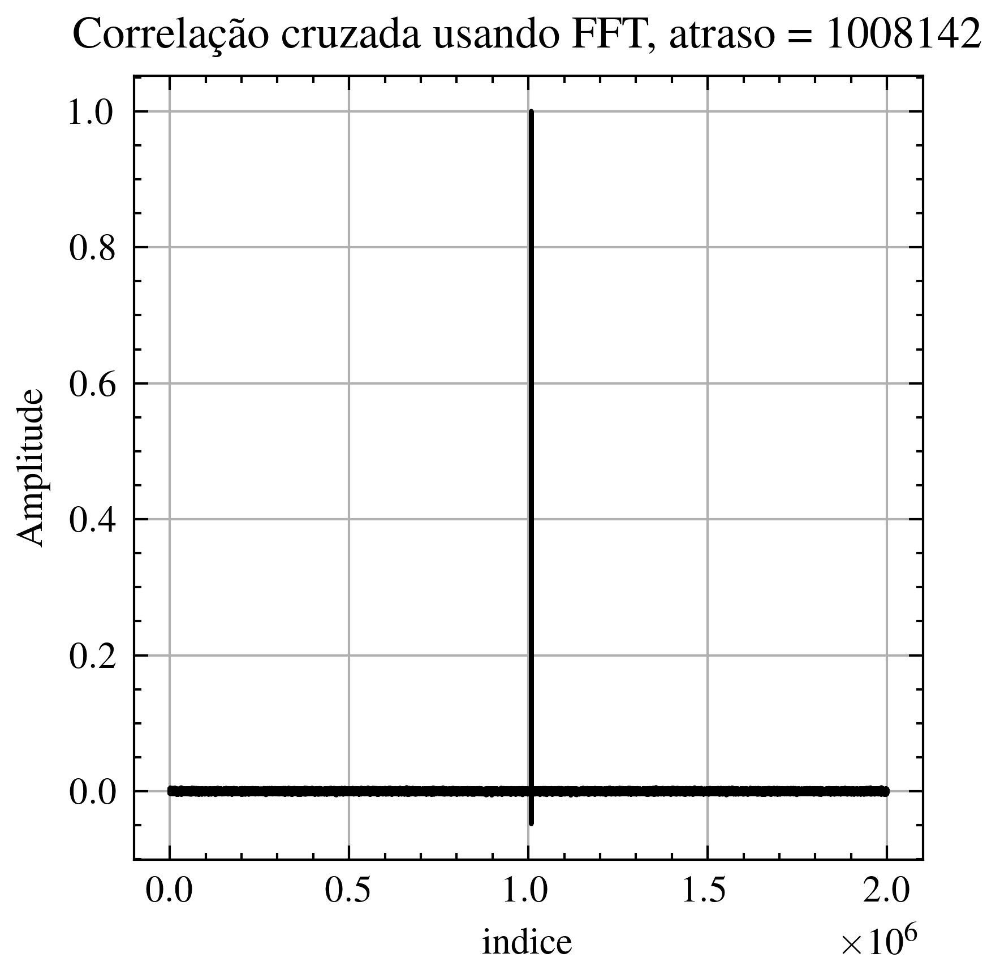

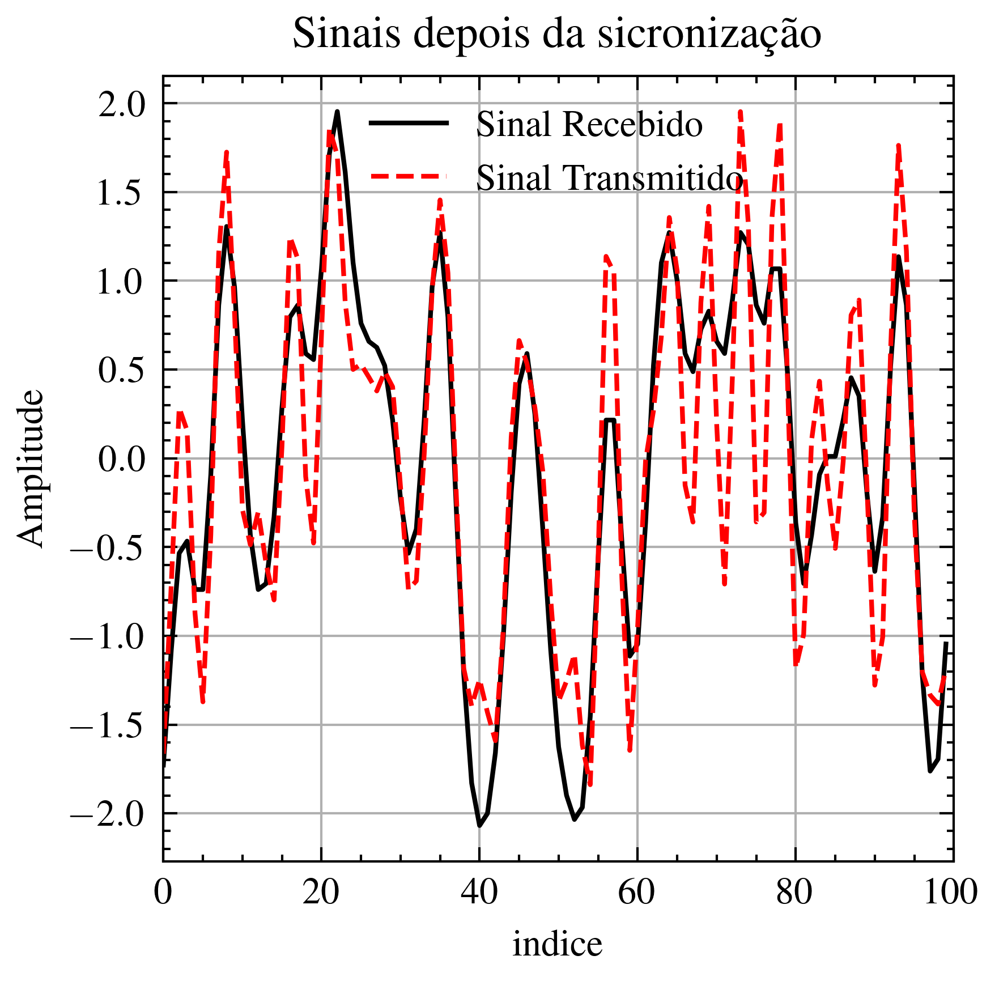

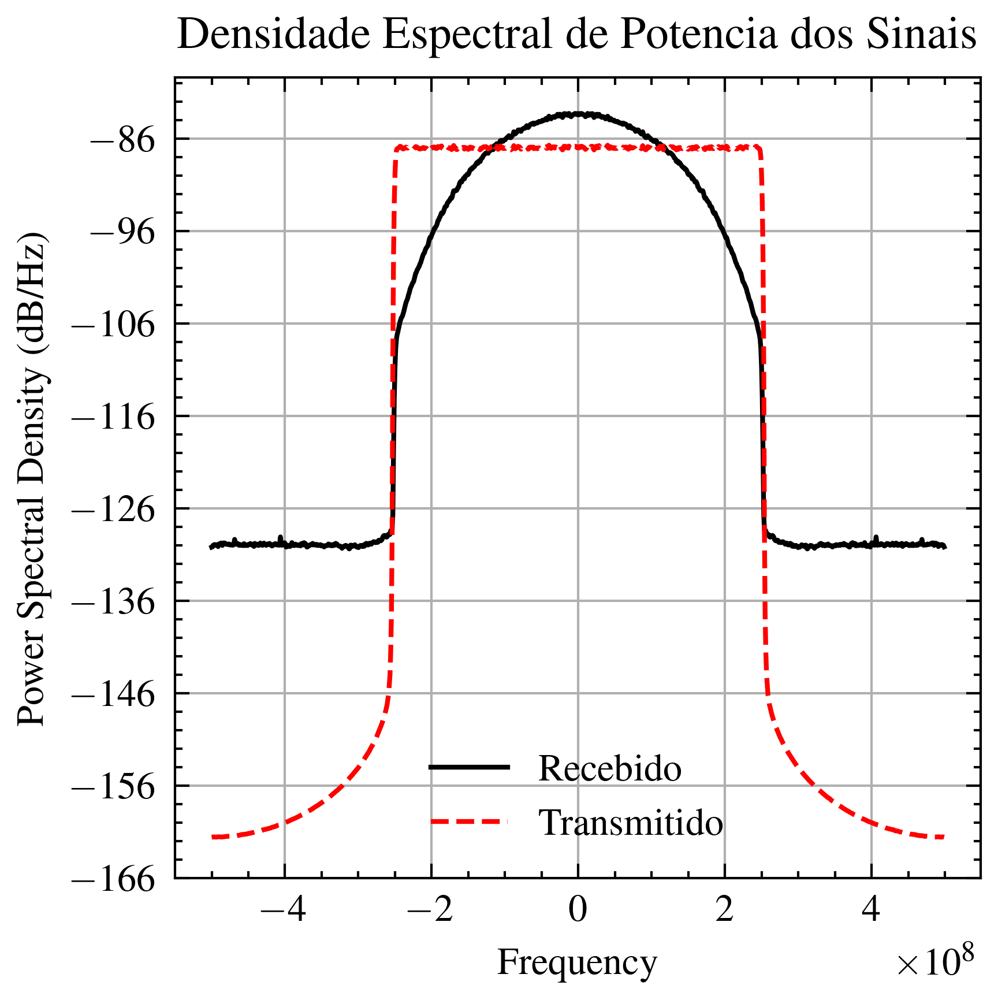

In [4]:
transmitido = pnorm(transmitido-np.mean(transmitido))

# paramCLKREC = parameters()
# paramCLKREC.isNyquist = True
# paramCLKREC.returnTiming = True
# paramCLKREC.ki = 1e-10
# paramCLKREC.kp = 1e-7
# #paramCLKREC.maxPPM = 1e-20

# recebidoclock, ted_values = gardnerClockRecovery(recebido, paramCLKREC)
# recebidoclock = recebidoclock[:,0]
#recebidoclock = np.append(recebidoclock,np.zeros(len(transmitido)-len(recebidoclock)))
recebidodecimado = clockSamplingInterp(recebido.reshape(-1,1),Fs_in=fsScope,Fs_out=Dac['fs']*Modulador['SPS'],jitter_rms=0)[:,0]
recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))

# recebidodecimado = clockSamplingInterp(recebido.reshape(-1,1),Fs_in=fsScope,Fs_out=Dac['fs']*Modulador['SPS'],jitter_rms=0)[:,0]
# recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))

# recebidodecimado, ted_values = gardnerClockRecovery(recebidodecimado, paramCLKREC)
# recebidodecimado = recebidodecimado[:,0]
# recebidodecimado = np.append(recebidodecimado,np.zeros(len(transmitido)-len(recebidodecimado)))


plt.figure()
plt.plot(recebidodecimado[0:100],label='Sinal Recebido')
plt.plot(transmitido[0:100],label='Sinal Transmitido')
plt.xlim(0,100)
plt.xlabel('indice')
plt.ylabel('Amplitude')
plt.grid()
plt.legend()
plt.title('Sinais antes da sicronização')


transmitido = sicronizarSinais(transmitido,(recebidodecimado),plot=True)
transmitido = pnorm(transmitido-np.mean(transmitido))

recebidosicronizado = recebidodecimado

plt.figure()
plt.plot(recebidosicronizado[0:100],label='Sinal Recebido')
plt.plot(transmitido[0:100],label='Sinal Transmitido')
plt.xlim(0,100)
plt.xlabel('indice')
plt.ylabel('Amplitude')
plt.grid()
plt.legend()
plt.title('Sinais depois da sicronização')

plt.figure()
plt.title('Densidade Espectral de Potencia dos Sinais')
plt.psd(recebidosicronizado,Fs=Dac['fs']*Modulador['SPS'], NFFT = 1024, sides='twosided', label = 'Recebido')
plt.psd(transmitido,Fs=Dac['fs']*Modulador['SPS'], NFFT = 1024, sides='twosided', label = 'Transmitido')
plt.legend()

transmitido = transmitido[1000:-1000]
recebidosicronizado = recebidosicronizado[1000:-1000]

Text(0, 0.5, 'Média movel do erro absoluto (dB)')

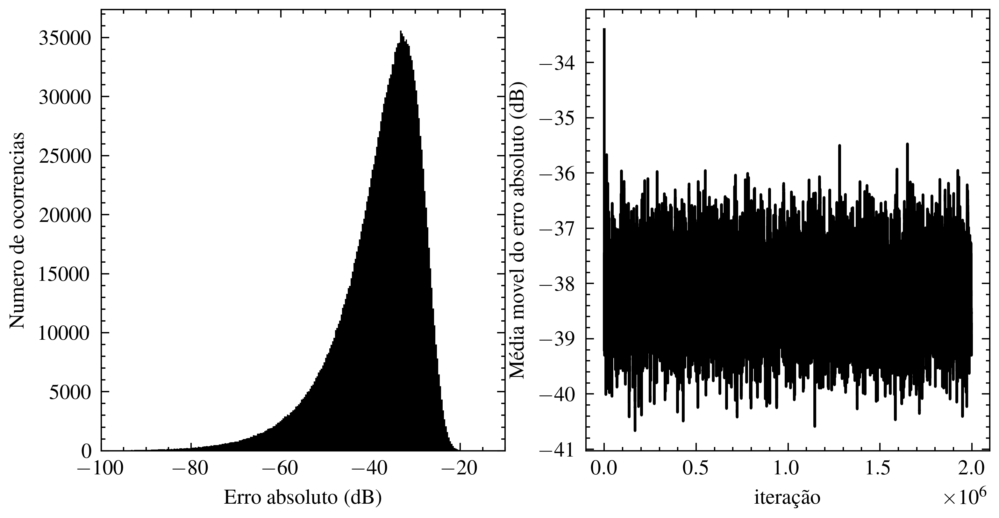

In [30]:
plt.rcParams["figure.figsize"] = (6,3)
fig, (ax1, ax2) = plt.subplots(1, 2)
x = 10*np.log10(erro)
N = 500
ax1.hist(x,bins=500)
ax1.set_xlabel('Erro absoluto (dB)')
ax1.set_ylabel('Numero de ocorrencias')
ax1.set_xlim(-100,-10)



x = np.convolve(x[100:], np.ones(N)/N, mode='valid')
ax2.plot(x)
ax2.set_xlabel('iteração')
ax2.set_ylabel('Média movel do erro absoluto (dB)')


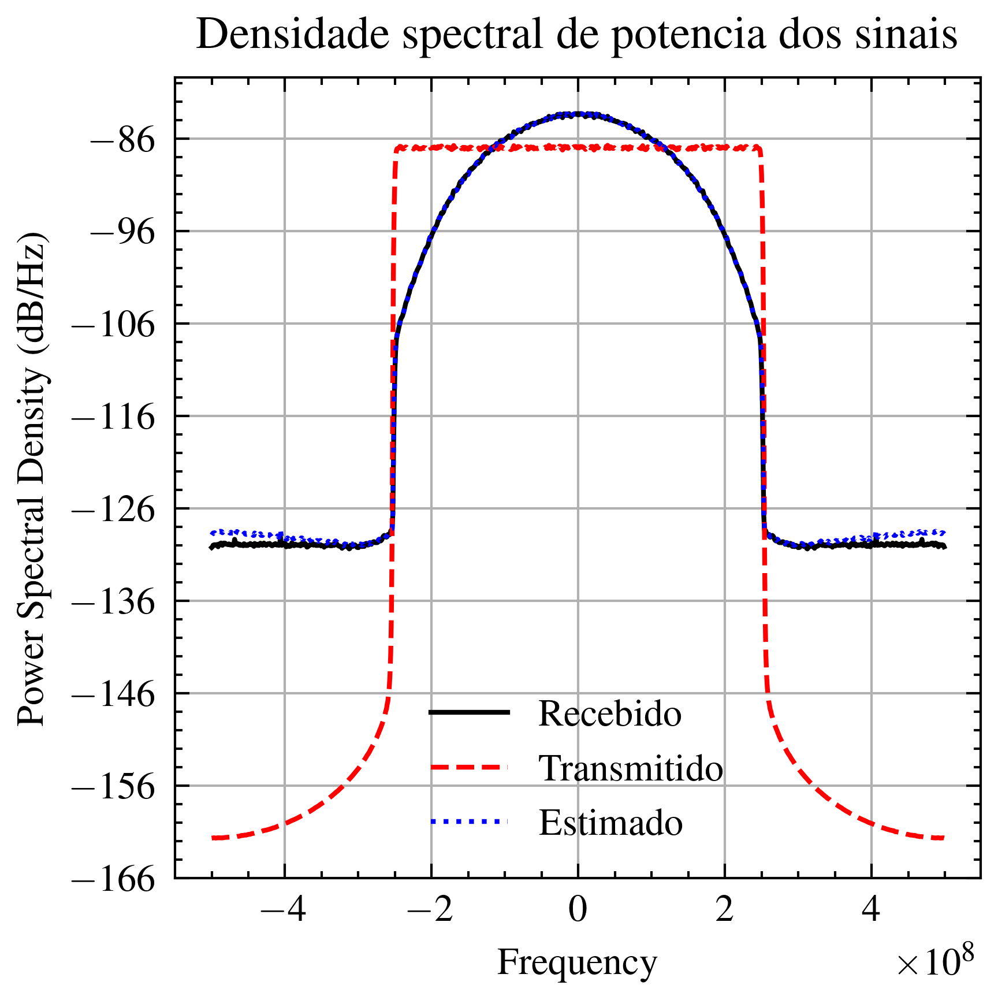

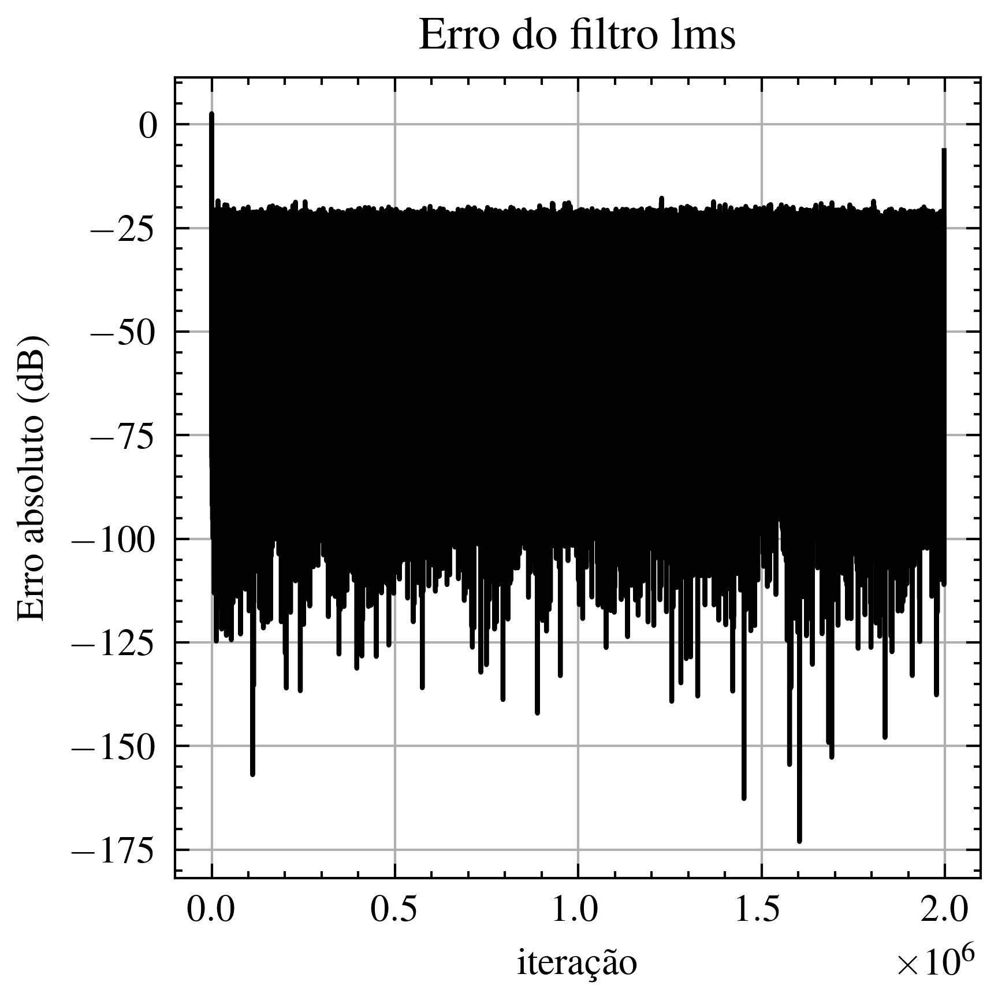

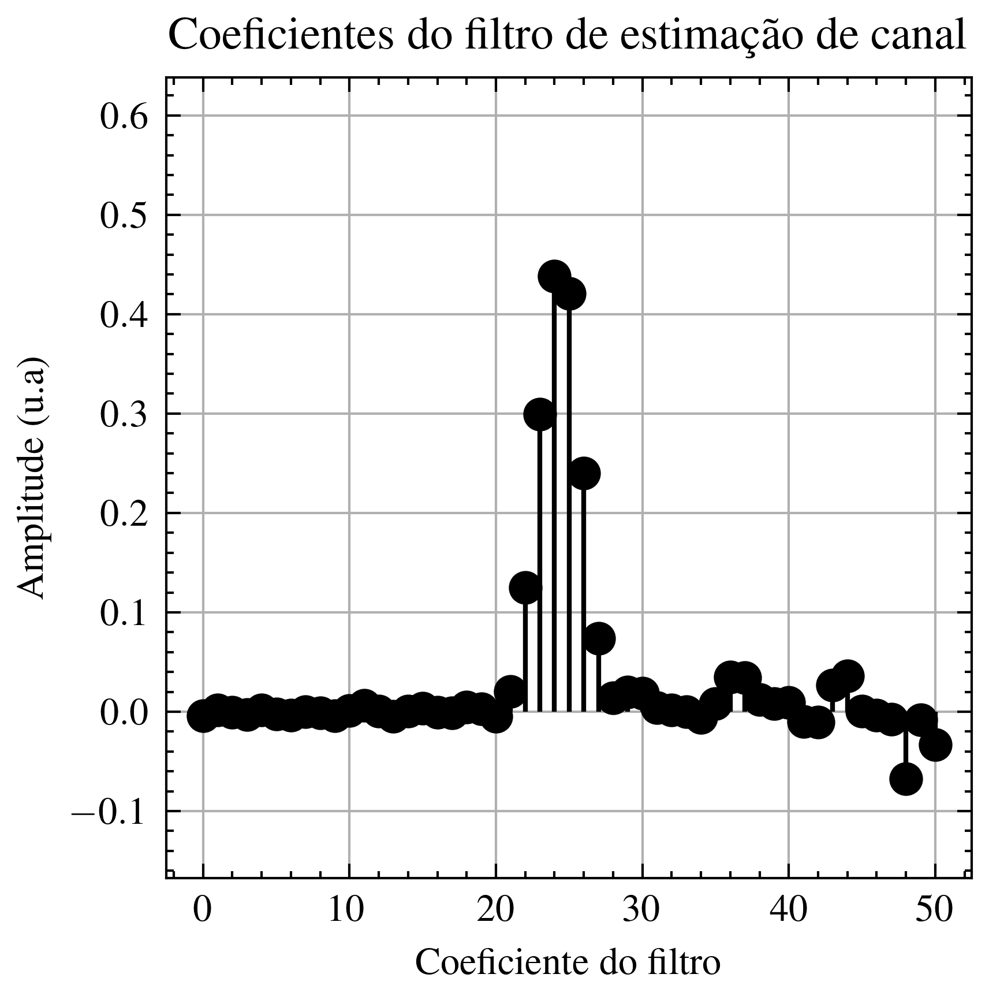

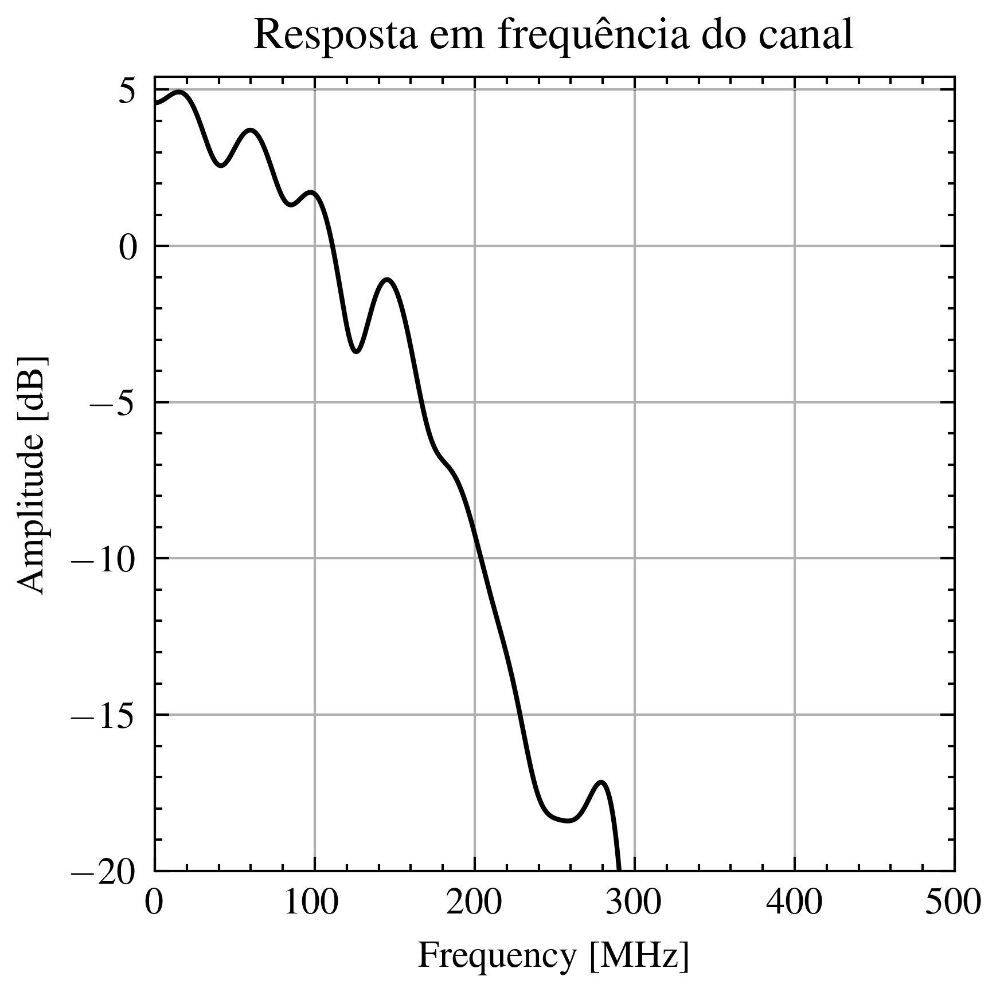

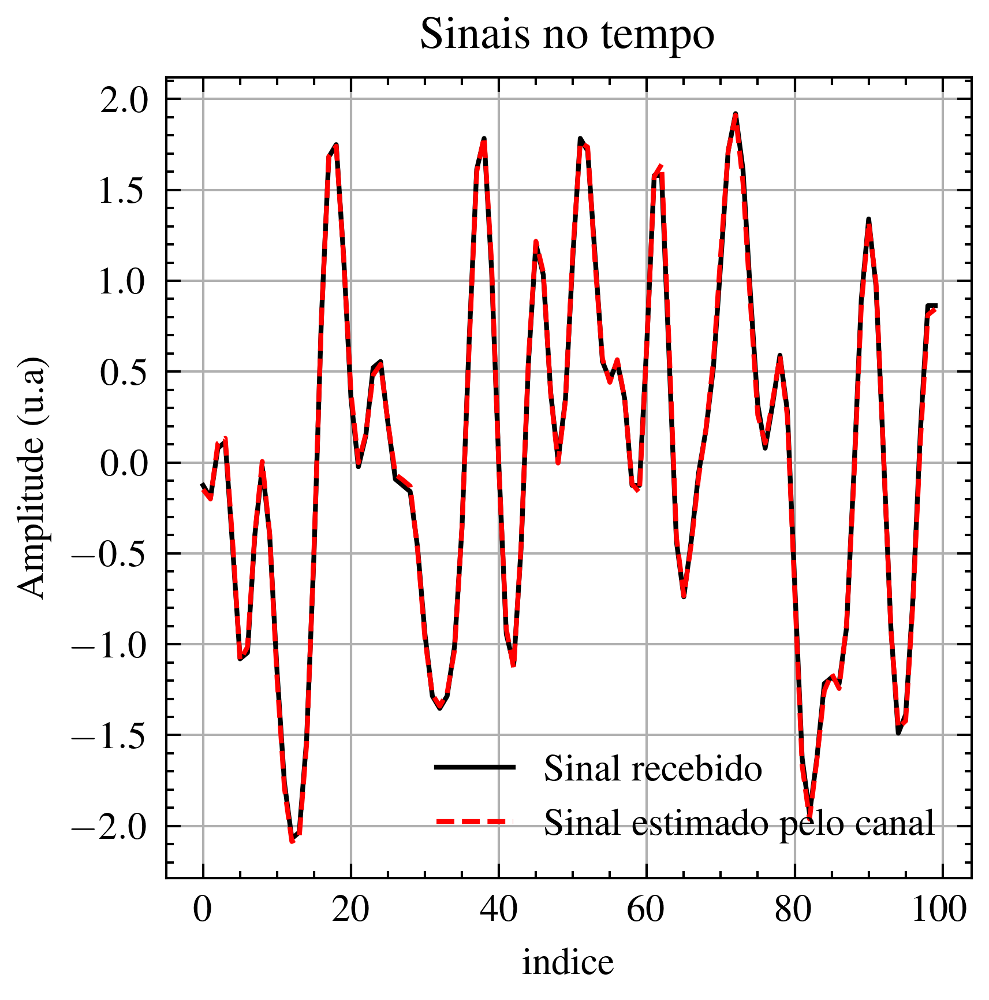

In [5]:
#Estimação do canal

#filtro lms
L = 51
μ = 0.02
out, h ,erro = lms(transmitido, recebidosicronizado, L,μ)
out = pnorm(out-np.mean(out))

plt.figure()
pcanal1,fcanal1 = plt.psd(recebidosicronizado,Fs=Dac['fs']*Modulador['SPS'], NFFT = 1024, sides='twosided', label = 'Recebido')
pcanal2,fcanal2 = plt.psd(transmitido,Fs=Dac['fs']*Modulador['SPS'],NFFT = 1024, sides='twosided', label = 'Transmitido')
pcanal3,fcanal3 = plt.psd(out,Fs=Dac['fs']*Modulador['SPS'], sides='twosided',NFFT = 1024, label = 'Estimado')
plt.legend()
plt.title('Densidade spectral de potencia dos sinais')

plt.figure()
plt.plot(10*np.log10(erro))
plt.xlabel('iteração')
plt.ylabel('Erro absoluto (dB)')
plt.title('Erro do filtro lms')
plt.grid()

plt.figure()
plt.stem(np.arange(len(h)), h, basefmt=" ")
plt.grid()
plt.ylim(min(h)-0.1,max(h)+0.2)
plt.xlabel('Coeficiente do filtro')
plt.ylabel('Amplitude (u.a)')
plt.title('Coeficientes do filtro de estimação de canal')

plt.figure()
fs = Dac['fs']*Modulador['SPS']
ω, h = sp.signal.freqz(b=h, a=1)
x = ω * fs * 1.0 / (2 * np.pi)
y = 20*np.log10(np.abs(h))
xestimador = x
yestimador = y
plt.plot(x/1e6, y)
plt.title('Resposta em frequência do canal')
plt.grid()
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequency [MHz]')
plt.xlim(0,1*Dac['fs']/1e6)
plt.ylim(-20,1.1*np.max(y))

plt.figure()
plt.plot(recebidosicronizado[500:600],label='Sinal recebido')
plt.plot(out[500:600],label='Sinal estimado pelo canal')
plt.xlabel('indice')
plt.ylabel('Amplitude (u.a)')
plt.title('Sinais no tempo')
plt.grid()
plt.legend()

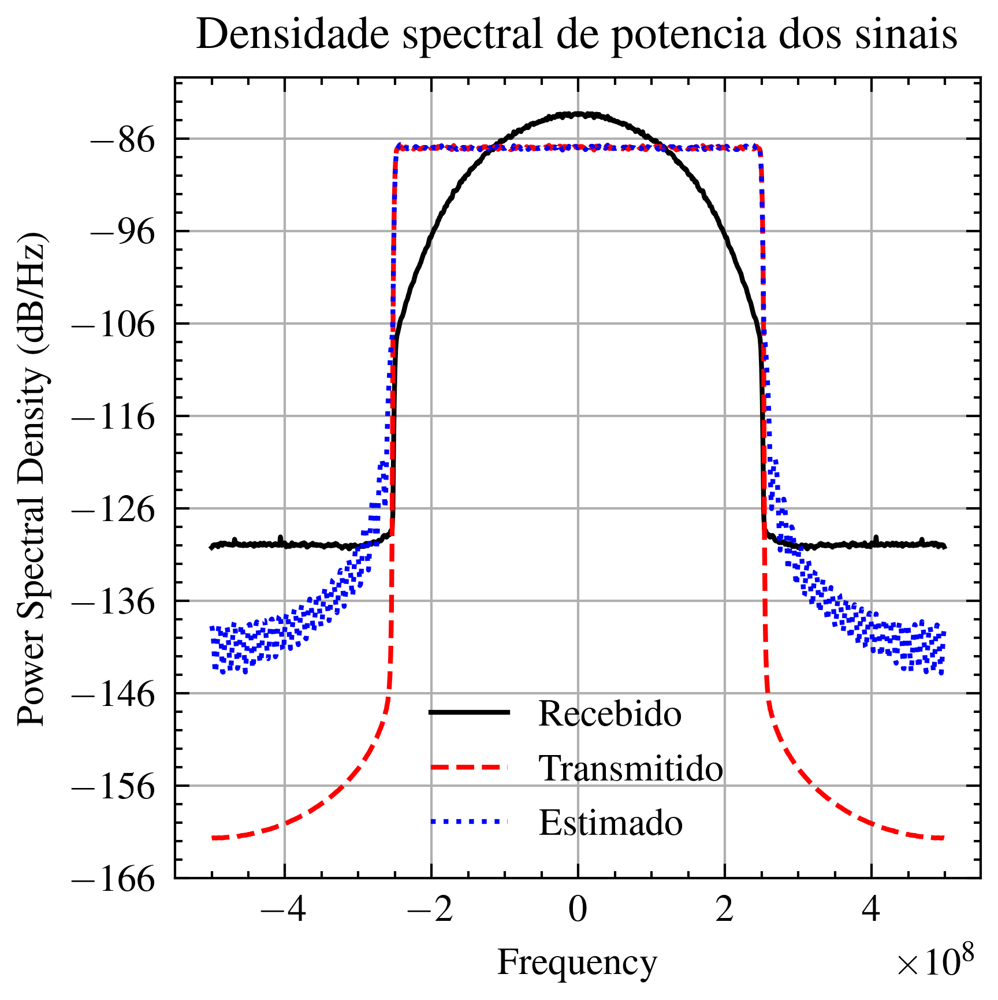

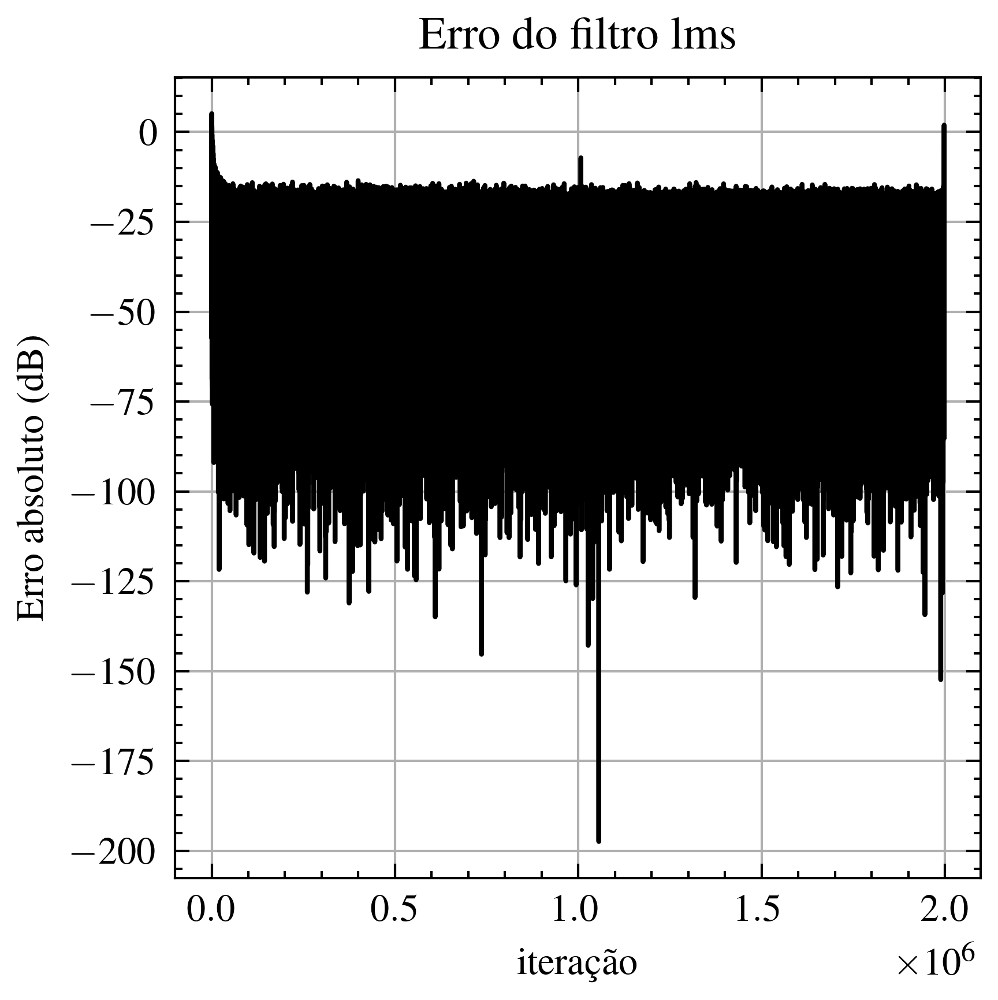

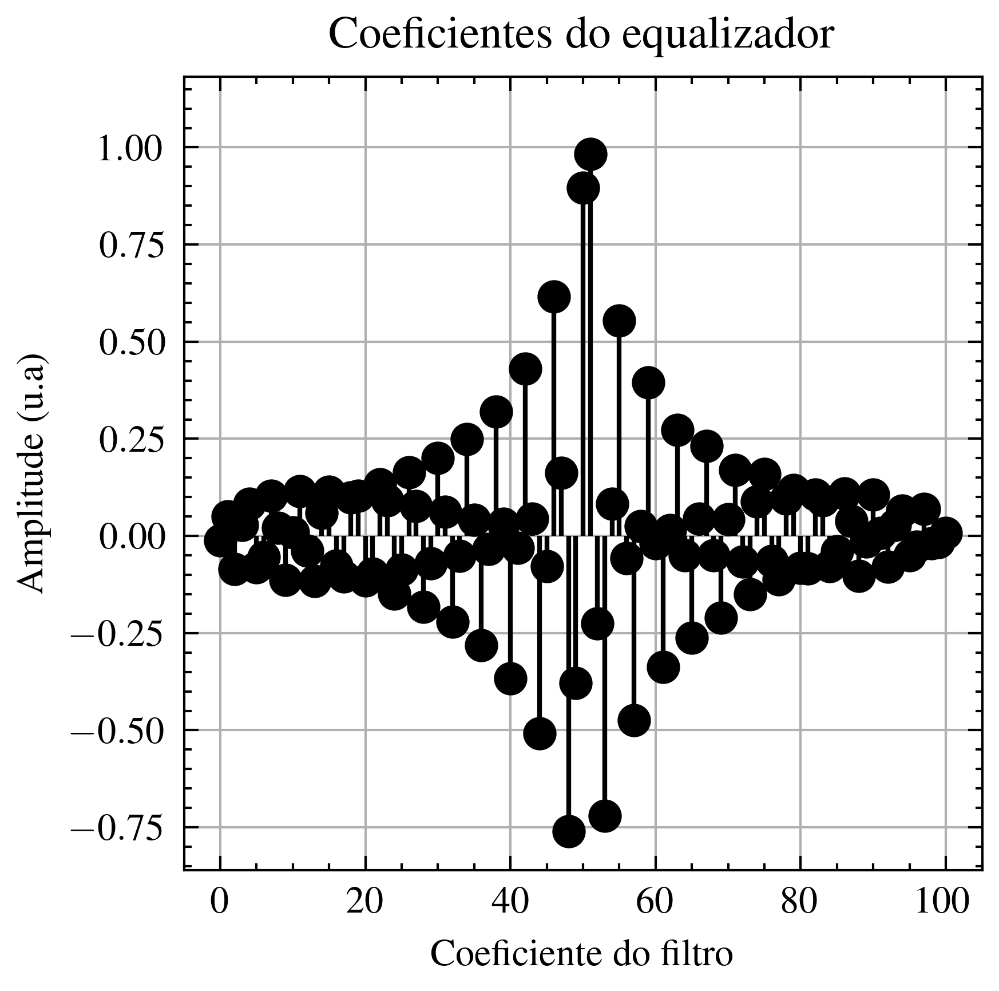

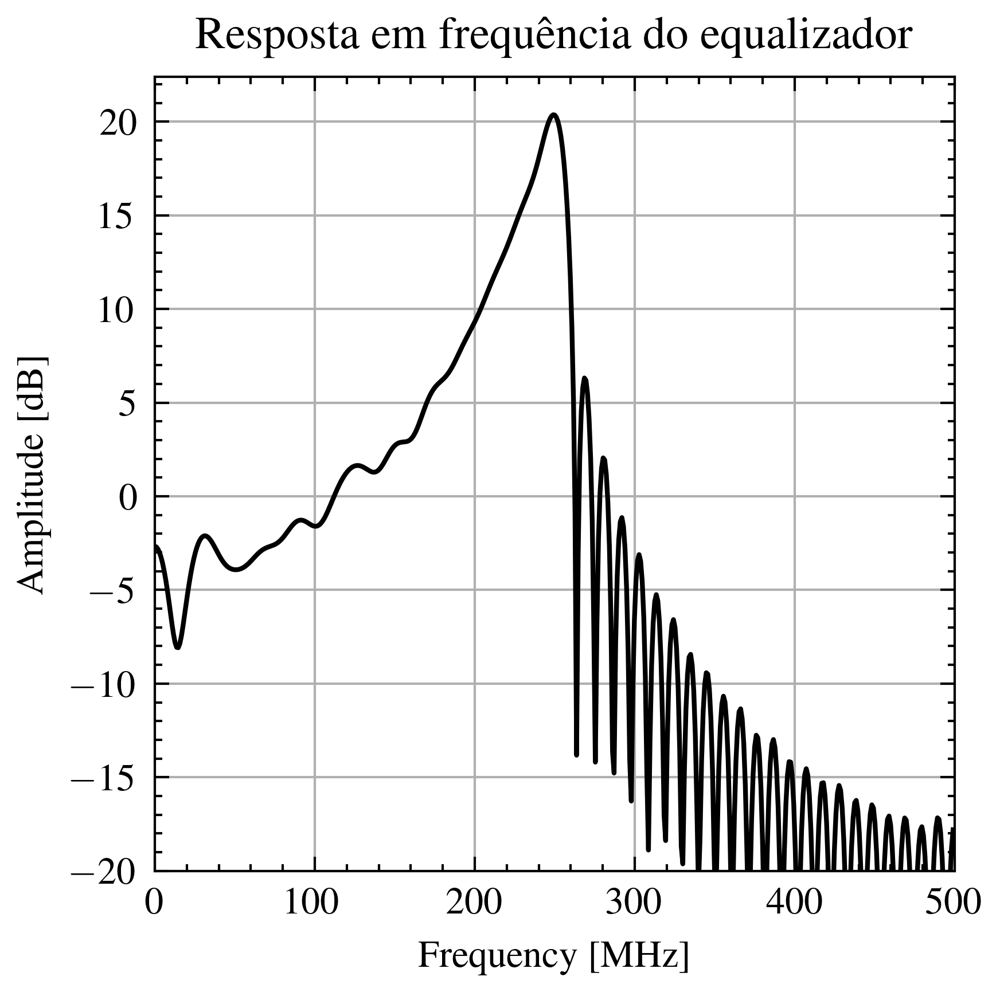

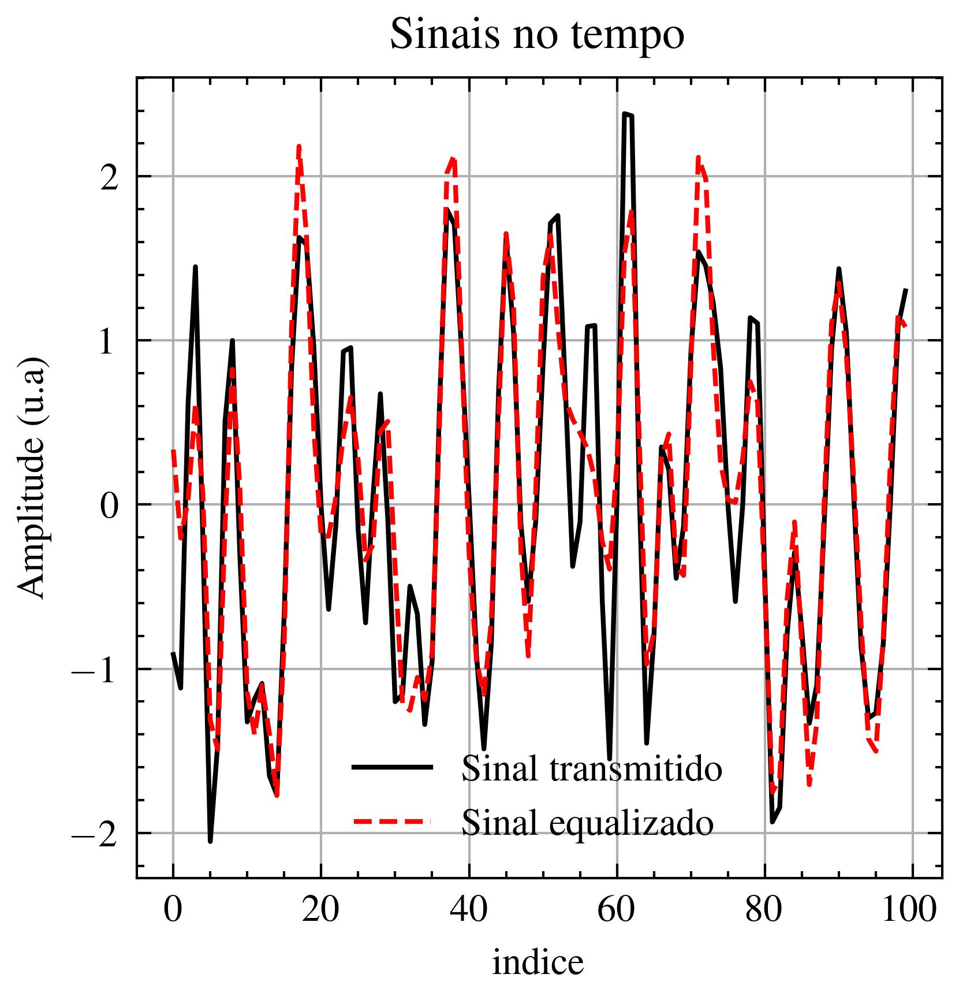

In [6]:
#Estimação do equalizador

#filtro lms
L = 101
μ = 0.01
out, heq ,erro = lms(recebidosicronizado, transmitido, L,μ)
out = pnorm(out-np.mean(out))



plt.figure()
peq1,feq1 = plt.psd(recebidosicronizado,Fs=Dac['fs']*Modulador['SPS'], NFFT = 1024, sides='twosided', label = 'Recebido')
peq2,feq2 = plt.psd(transmitido,Fs=Dac['fs']*Modulador['SPS'],NFFT = 1024, sides='twosided', label = 'Transmitido')
peq3,feq3 = plt.psd(out,Fs=Dac['fs']*Modulador['SPS'], sides='twosided',NFFT = 1024, label = 'Estimado')
plt.legend()
plt.title('Densidade spectral de potencia dos sinais')

plt.figure()
plt.plot(10*np.log10(erro))
plt.xlabel('iteração')
plt.ylabel('Erro absoluto (dB)')
plt.title('Erro do filtro lms')
plt.grid()

plt.figure()
plt.stem(np.arange(len(heq)), heq, basefmt=" ")
plt.grid()
plt.ylim(min(heq)-0.1,max(heq)+0.2)
plt.xlabel('Coeficiente do filtro')
plt.ylabel('Amplitude (u.a)')
plt.title('Coeficientes do equalizador')

plt.figure()
fs = Dac['fs']*Modulador['SPS']
ω, h = sp.signal.freqz(b=heq, a=1)
x = ω * fs * 1.0 / (2 * np.pi)
y = 20*np.log10(np.abs(h))
xequalizador = x
yequalizador = y
plt.plot(x/1e6, y)
plt.title('Resposta em frequência do equalizador')
plt.grid()
plt.ylabel('Amplitude [dB]')
plt.xlabel('Frequency [MHz]')
plt.xlim(0,500)
plt.ylim(-20,1.1*np.max(y))

plt.figure()
plt.plot(transmitido[500:600],label='Sinal transmitido')
plt.plot(out[500:600],label='Sinal equalizado')
plt.xlabel('indice')
plt.ylabel('Amplitude (u.a)')
plt.title('Sinais no tempo')
plt.grid()
plt.legend()



(-20.0, 22.402923185088046)

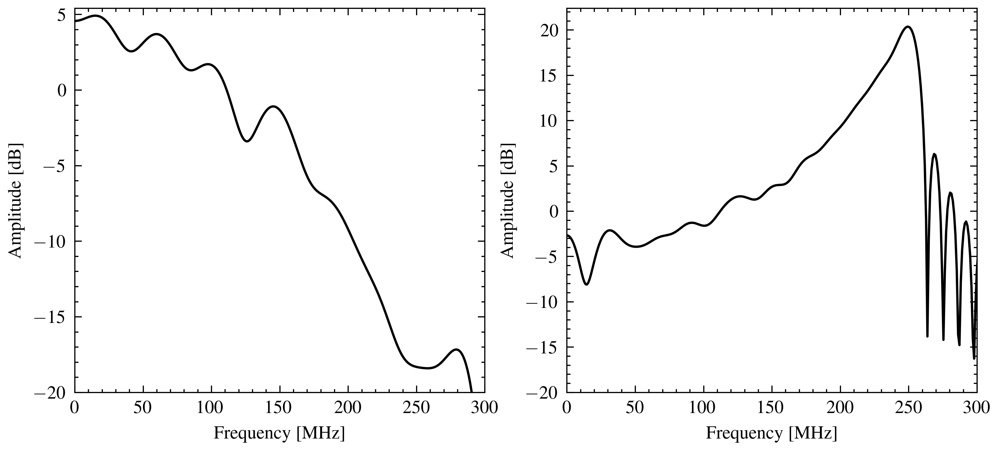

In [10]:
plt.rcParams["figure.figsize"] = (7,3)
plt.rcParams["figure.figsize"] = (7,3)
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.plot(xestimador/1e6, yestimador)
ax1.set_ylabel('Amplitude [dB]')
ax1.set_xlabel('Frequency [MHz]')
ax1.set_xlim(0,300)
ax1.set_ylim(-20,1.1*np.max(yestimador))

ax2.plot(xequalizador/1e6, yequalizador)
ax2.set_ylabel('Amplitude [dB]')
ax2.set_xlabel('Frequency [MHz]')
ax2.set_xlim(0,300)
ax2.set_ylim(-20,1.1*np.max(yequalizador))

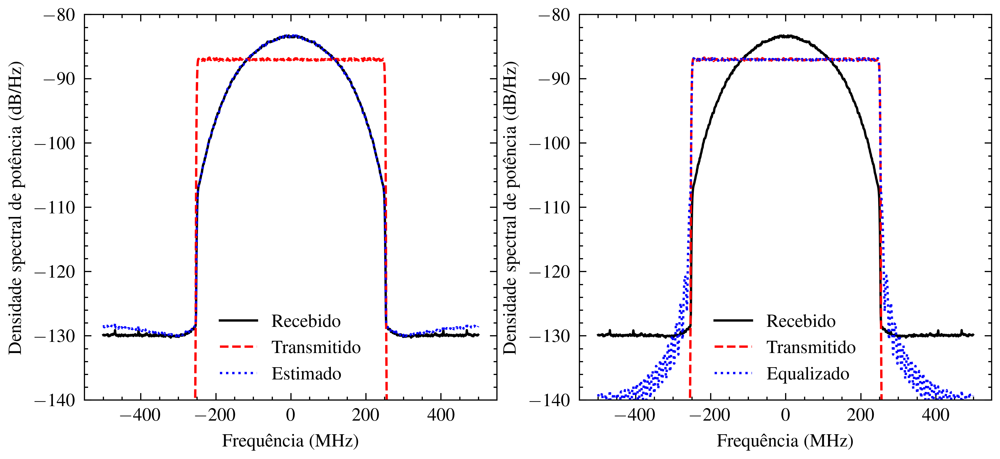

In [38]:
plt.rcParams["figure.figsize"] = (7,3)
fig, (ax1, ax2) = plt.subplots(1, 2)

ax1.plot(fcanal1*1e-6,10*np.log10(pcanal1),label='Recebido')
ax1.plot(fcanal2*1e-6,10*np.log10(pcanal2),label='Transmitido')
ax1.plot(fcanal3*1e-6,10*np.log10(pcanal3),label='Estimado')
ax1.set_ylim(-140,-80)
ax1.set_xlabel('Frequência (MHz)')
ax1.set_ylabel('Densidade spectral de potência (dB/Hz)')
ax1.legend()

ax2.plot(feq1*1e-6,10*np.log10(peq1),label='Recebido')
ax2.plot(feq2*1e-6,10*np.log10(peq2),label='Transmitido')
ax2.plot(feq3*1e-6,10*np.log10(peq3),label='Equalizado')
ax2.set_ylim(-140,-80)
ax2.set_xlabel('Frequência (MHz)')
ax2.set_ylabel('Densidade spectral de potência (dB/Hz)')
ax2.legend()

In [235]:
np.save('Taps-pre-equalizacao-8PAM-200Mbs-Optico',heq)

# Realizando a pre-equalização

+0,"No error"

Numero de pontos do osciloscopio: 2000000
Frequencia de amostragem do osciloscopio: 1000.0 MHz


c:\Users\lucas\anaconda3\envs\Opticompy\lib\site-packages\optic\dsp\clockRecovery.py:170: RuntimeWarning: overflow encountered in cast
  return Eo, np.asarray(timing_values).astype("float32").T


BER: 0.4585984899147791
SER: 0.9066123832654791
Numero de error totais: 0
SNR: nan dB
Numero de erros teoricos para essa SNR: nan


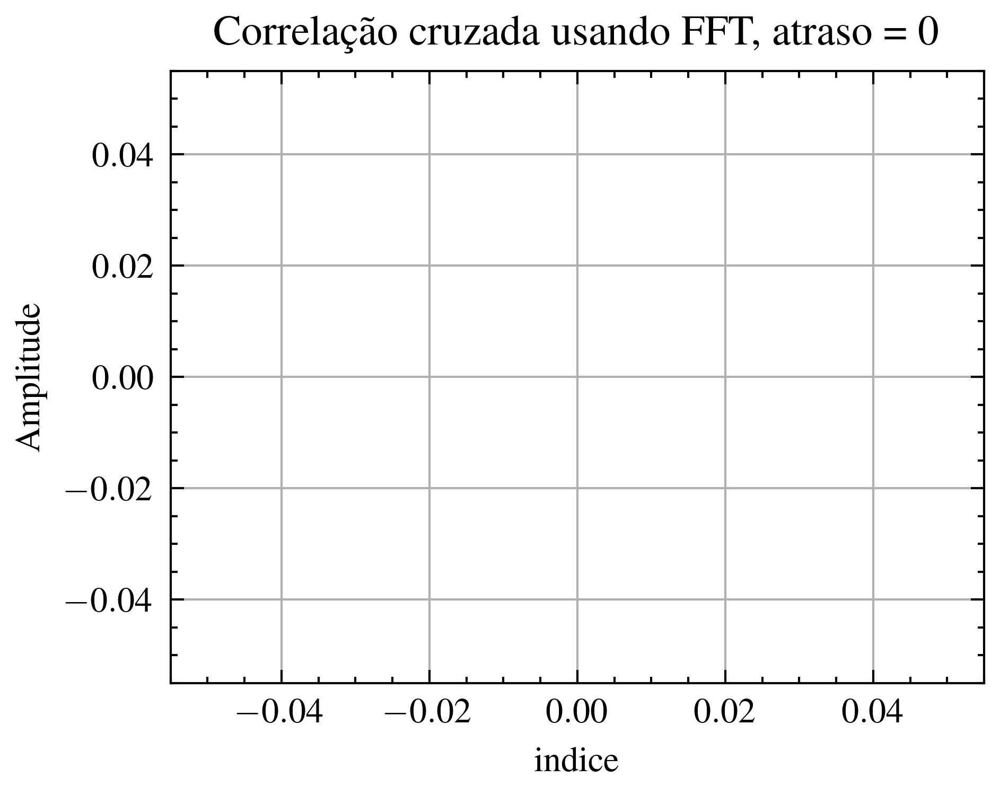

<Figure size 1980x1500 with 0 Axes>

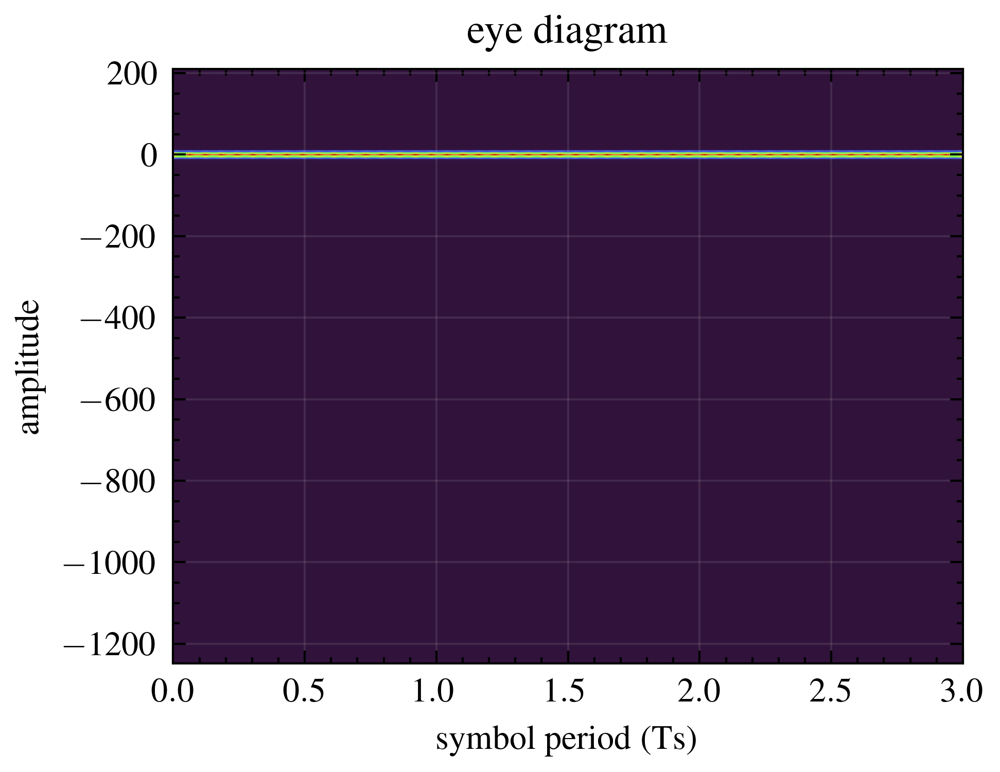

ValueError: autodetected range of [nan, nan] is not finite

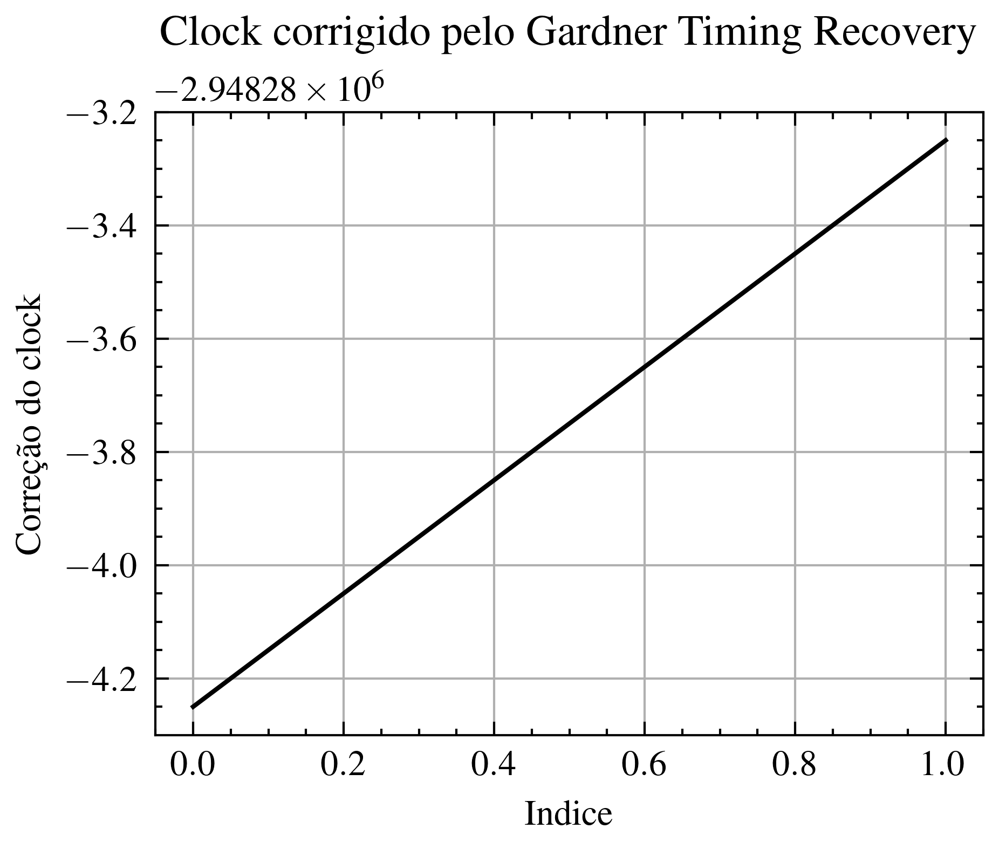

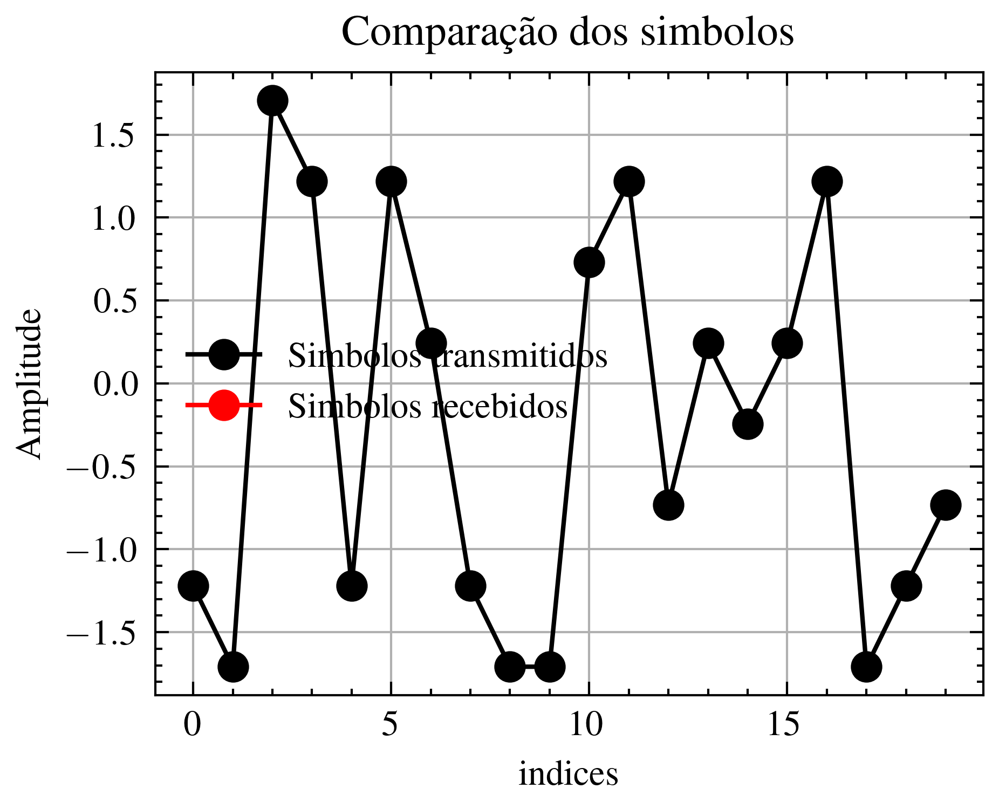

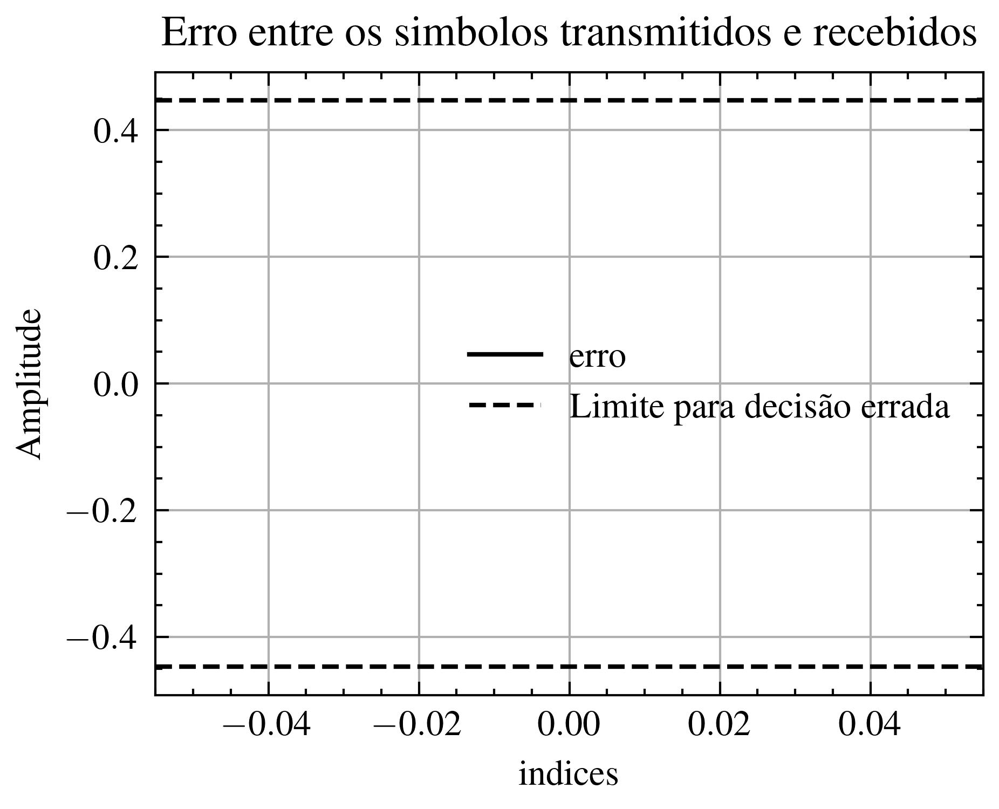

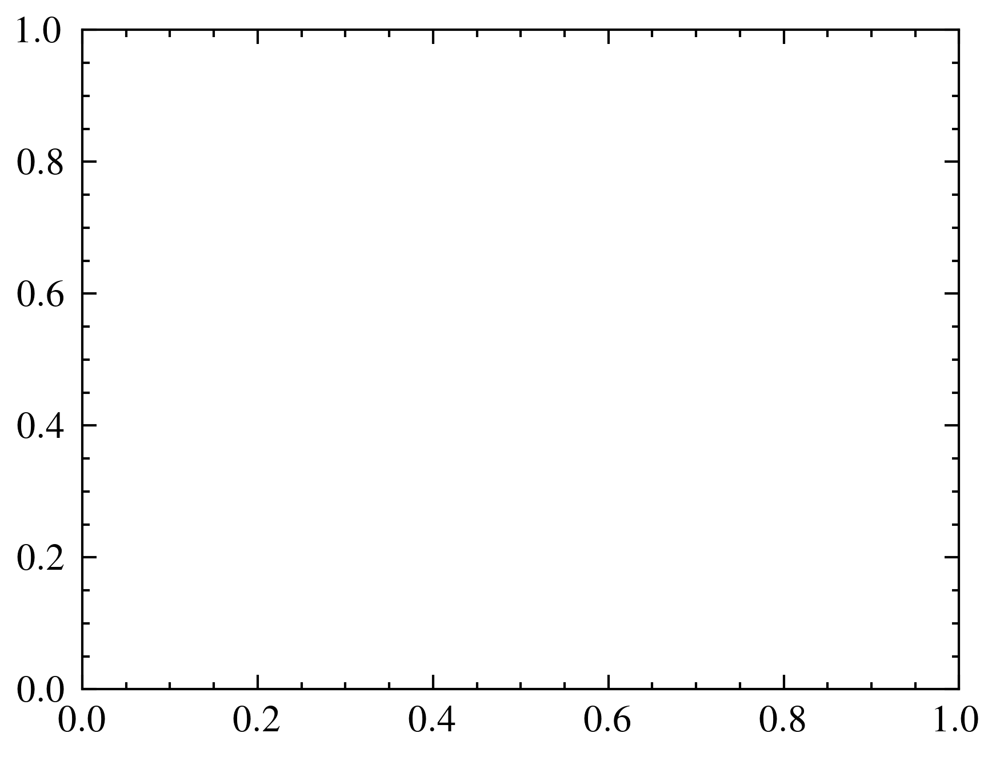

In [171]:
Modulador['W'] = np.load('Taps-pre-equalizacao-8PAM-400Mbs-Optico.npy')
# Modulador['nsimbolos'] =1e6
# Modulador = {
#     'M': 4,
#     'nsimbolos': 3e5,
#     'SPS': 4,
#     'formatoPulso': 'rrc', #'rect','nrz','rrc'
#     'nTaps': 1024,
#     'alpha': 0.01,
#     'W': np.array([])
# }

# Dac = {
#     'dispositivo': DAC,
#     'Porta': 2,
#     'fs': 500e6,
#     'V_High': 4,
#     'V_Low': 0,
#     'filtro': 'NORMal'
# }

Osciloscopio = {
    'dispositivo': scope,
    'canais': np.array([3]),
    'tempo': 1*Modulador['nsimbolos']/(Dac['fs']),
    'vDivisao': np.array([0.15]),
    'impedancia': np.array(['FIFTy']),
    'triggerChannel': np.array([0]),
    'triggerAmp': np.array([0]),
    'offset': np.array([2]),
}

ClockRecovery = {
    'Ki': 5e-10,
    'Kp': 2e-5,
    'Descarte': 200000
}

#Gerando os sinais transmitidos
bits,pulso,transmitido, transmitidoequalizados = Gerar_Simbolos(Modulador)
#Gerando uma onda arbitraria no DAC
#Onda_Dac_Keysight(Dac,Modulador,transmitido,'teste')
Onda_Dac_Keysight(Dac,Modulador,transmitidoequalizados,'teste')
DAC.query('*OPC?')   
#Configurando o osciloscopio
ConfigurarScope(Osciloscopio)
# Fixar o sinal no osciloscopio
Osciloscopio['dispositivo'].write('digitize')
Osciloscopio['dispositivo'].query('*OPC?')   

t,recebido = AdquirirOnda(Osciloscopio['dispositivo'],3)
fsScope = float(Osciloscopio['dispositivo'].query(':ACQuire:SRATe?'))

print(f'Numero de pontos do osciloscopio: {len(recebido)}')
print(f'Frequencia de amostragem do osciloscopio: {round(fsScope*1e-6,3)} MHz')


ber,ser,Nerros,SNRdB = recepcao(bits,transmitido,recebido,fsScope,Modulador,Dac,ClockRecovery,plot=True)

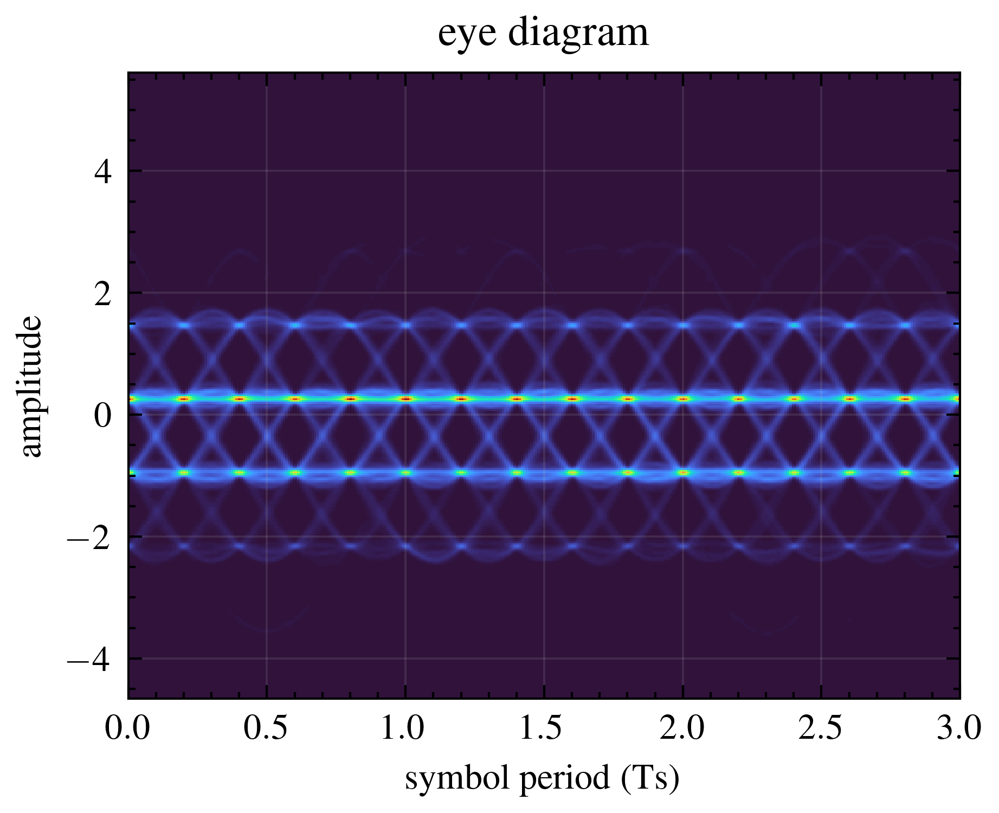

In [16]:
t,recebido = AdquirirOnda(Osciloscopio['dispositivo'],3)
recebido = pnorm(recebido - np.mean(recebido))
eyediagram(recebido,len(recebido),5,ptype='fancy')

In [ ]:
def recepcao(transmitido,recebido,fsScope,Modulador,Dac,ClockRecovery,plot=False):
    paramCLKREC = parameters()
    paramCLKREC.isNyquist = True
    paramCLKREC.returnTiming = True
    paramCLKREC.ki = ClockRecovery['Ki']
    paramCLKREC.kp = ClockRecovery['Kp']
    #paramCLKREC.maxPPM = 1

    transmitido = pnorm(transmitido-np.mean(transmitido))
    recebido = pnorm(recebido-np.mean(recebido))

    pulso = pulseShape(Modulador['formatoPulso'], (fsScope/Dac['fs']), Modulador['nTaps'], Modulador['alpha'])
    pulso = pulso/max(abs(pulso))
    filtrocasado = firFilter(pulso,recebido)
    filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
    filtrocasado, ted_values = gardnerClockRecovery(filtrocasado, paramCLKREC)
    filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
    filtrocasado = filtrocasado[:,0]

    recebidodecimado = clockSamplingInterp(filtrocasado.reshape(-1,1),Fs_in=(fsScope/Dac['fs']),Fs_out=1,jitter_rms=0)[:,0]
    recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))
    recebidosicronizado = recebidodecimado

    simbolos = modulateGray(bits,4,'pam')
    simbolos = pnorm(simbolos-np.mean(simbolos))

    simbolos,delay = sicronizarSinais(simbolos,(recebidosicronizado),plot=plot,returnTiming=True)
    #simbolos = simbolos[0:len(simbolos)]
    simbolos = pnorm(simbolos-np.mean(simbolos))

    simbolos = simbolos[500000:]
    recebidosicronizado = recebidosicronizado[500000:]


    diferenca = simbolos - recebidosicronizado
    ber,ser,SNRdB = (fastBERcalc(pnorm(recebidosicronizado), pnorm(simbolos), 4, 'pam'))
    erros = np.argwhere(np.abs(diferenca)>0.4470)

    print(f'BER: {ber[0]}')
    print(f'SER: {ser[0]}')
    print(f'Numero de error totais: {len(erros)}')
    print(f'SNR: {SNRdB[0]} dB')

    from scipy.special import erfc

    def Q(x):
        return 0.5*erfc(x/np.sqrt(2))
    SNR = 10**(SNRdB[0]/10)
    print(f'Numero de erros teoricos para essa SNR: {2*(4-1)/4*Q(np.sqrt((6*SNR)/(4**2-1)))}')

    # print(len(recebidosicronizado))
    # print(len(simbolos))
    # # recebidosicronizado = recebidosicronizado[1:-1]
    # # simbolos = simbolos[1:-1]

    if plot==True:
        plt.figure()
        eyediagram(filtrocasado[1000000:],len(filtrocasado[1000000:]),(fsScope/Dac['fs']),ptype='fancy')
        plt.figure()
        plt.plot(ted_values)
        plt.xlabel('Indice')
        plt.ylabel('Correção do clock')
        plt.title('Clock corrigido pelo Gardner Timing Recovery')
        plt.grid()
        plt.figure()
        plt.plot((simbolos)[0:0+20],'o-',label='Simbolos transmitidos')
        plt.plot((recebidosicronizado)[0:0+20],'o-',label='Simbolos recebidos')
        plt.title('Comparação dos simbolos')
        plt.xlabel('indices')
        plt.ylabel('Amplitude')
        plt.grid()
        plt.legend()

        plt.figure()
        plt.plot(diferenca,label='erro')
        plt.axhline(-0.4470,linestyle='--',color='k',label='Limite para decisão errada')
        plt.axhline(0.4470,linestyle='--',color='k')
        plt.title('Erro entre os simbolos transmitidos e recebidos')
        plt.xlabel('indices')
        plt.ylabel('Amplitude')
        plt.ylim(-0.5,0.5)
        plt.grid()
        plt.legend()

        plt.figure()
        plt.hist(diferenca,bins=500)
        plt.axvline(-0.4470,linestyle='--',color='k',label='Limite para decisão errada')
        plt.axvline(0.4470,linestyle='--',color='k')
        plt.title('Distribuição do erro entre os simbolos transmitidos e recebidos')
        plt.xlim(-0.5,0.5)
        plt.xlabel('valor')
        plt.ylabel('numero de ocorrencias')
        plt.grid()
        plt.legend()

        plt.figure()
        plt.title('Densidade Espectral de Potencia dos Sinais')
        plt.psd(recebido,Fs=fsScope, NFFT = 1024, sides='twosided', label = 'Recebido')
        plt.psd(transmitido,Fs=Dac['fs']*Modulador['SPS'], NFFT = 1024, sides='twosided', label = 'Transmitido')
        plt.xlim(-0.5e9,0.5e9)
        plt.legend()

        # plt.figure()
        # plt.plot(erros,'o-')
        # plt.title(f'Indice dos erros: atraso da sicronização = {delay}')
        # plt.grid()
        # plt.xlabel('Indice do erro')
        # plt.ylabel('Posição do erro')
        # plt.xlim(0,len(erros)-1)
    return ber[0],ser[0],len(erros),SNRdB[0]

Numero de pontos do osciloscopio: 2000000
Frequencia de amostragem do osciloscopio: 1000.0 MHz
500000
500000
BER: 1e-06
SER: 2e-06
Numero de error totais: 3
SNR: 20.678216308734818 dB
Numero de erros teoricos para essa SNR: [6.01523191e-12]


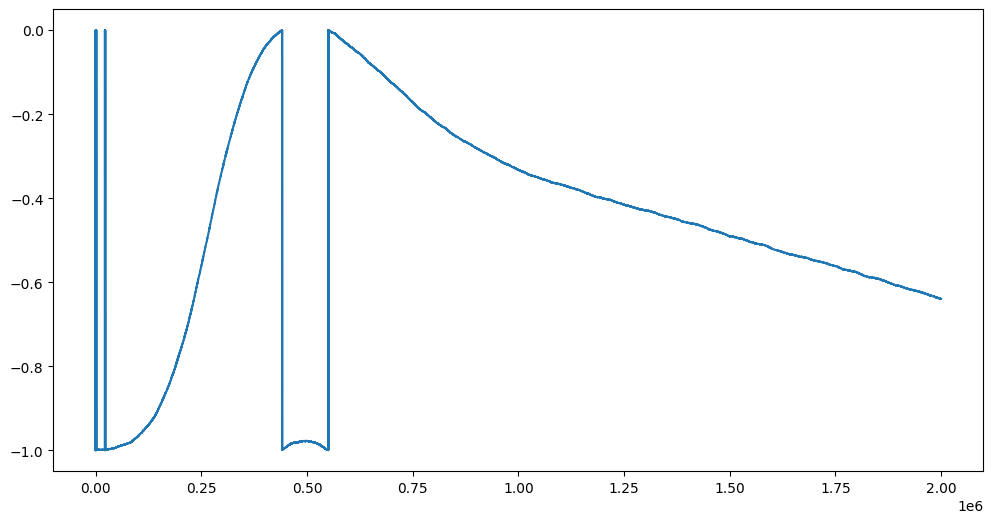

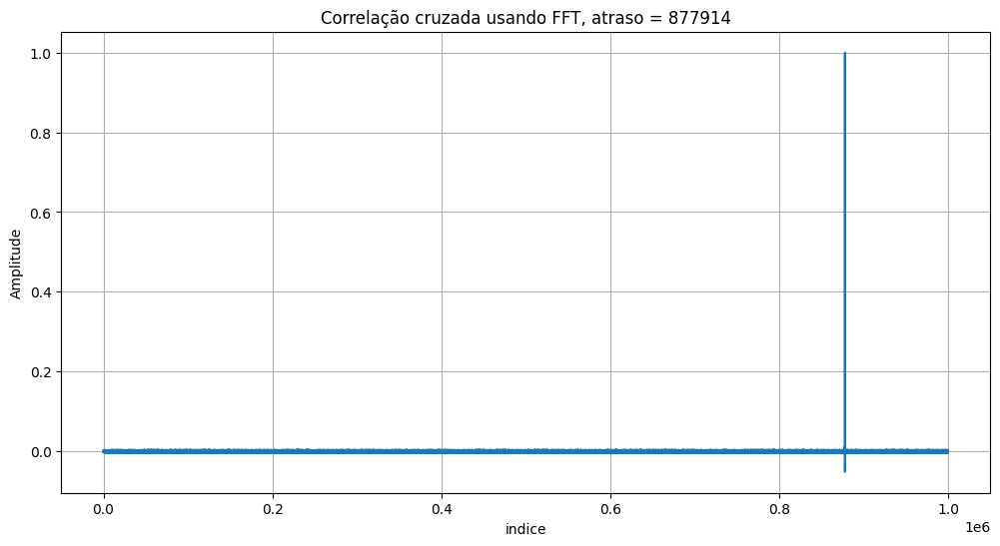

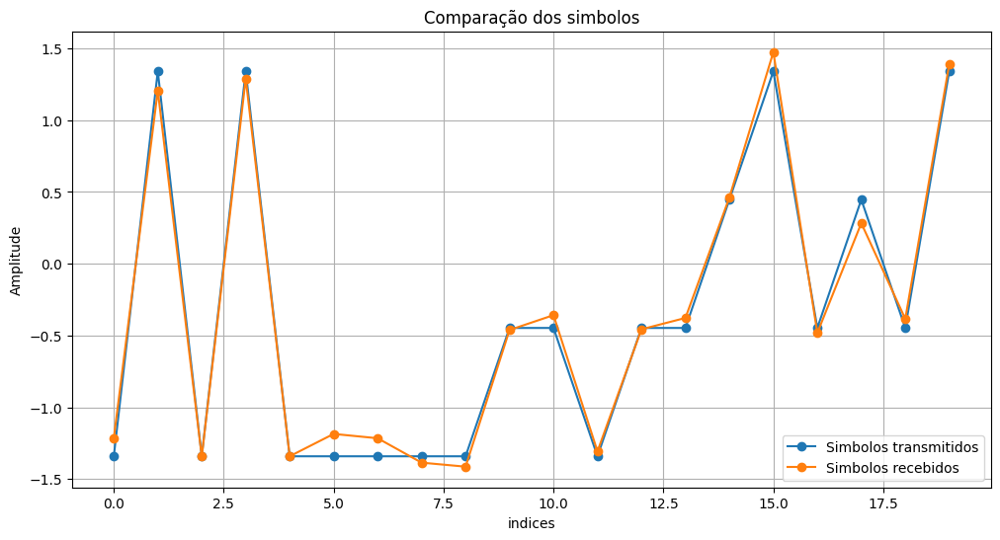

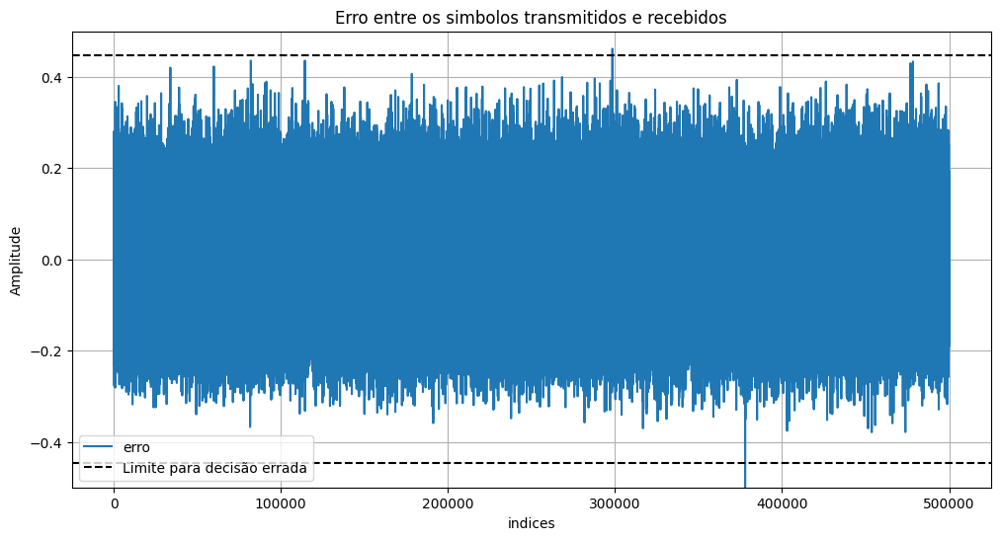

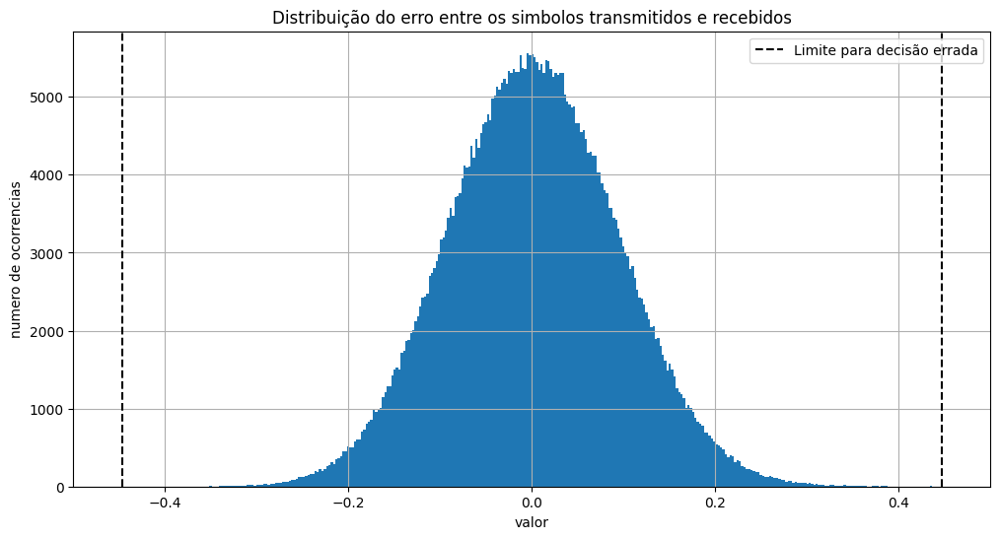

<Figure size 1200x600 with 0 Axes>

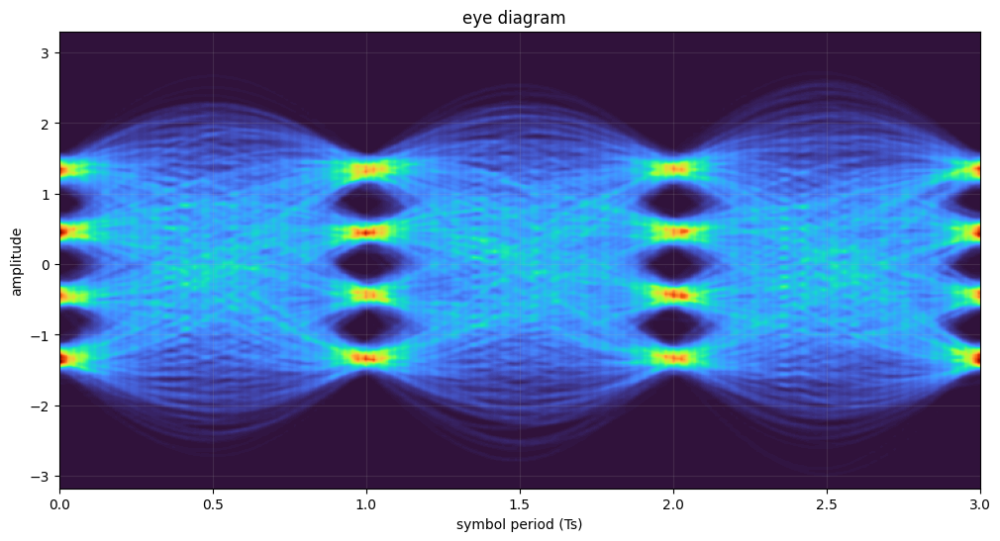

(0.0, 2.0)

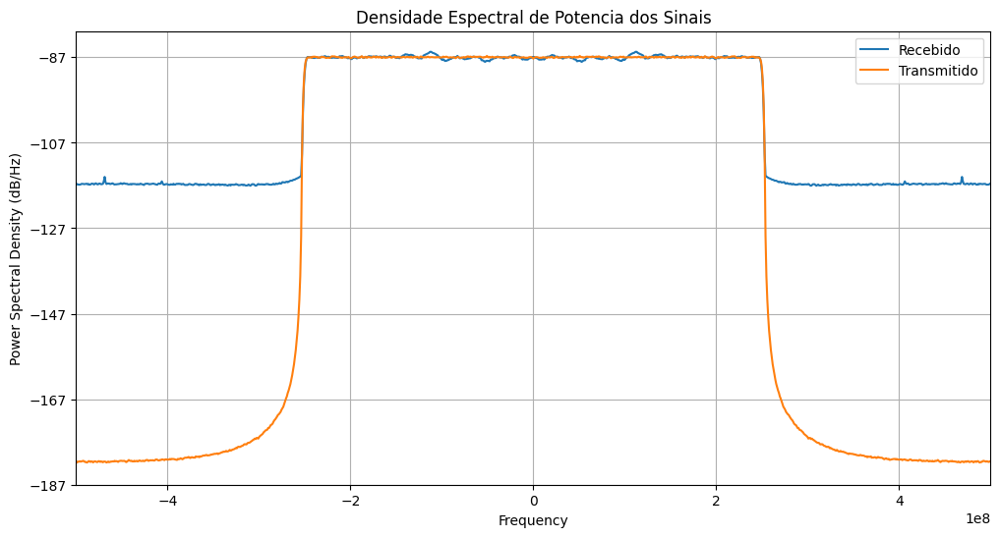

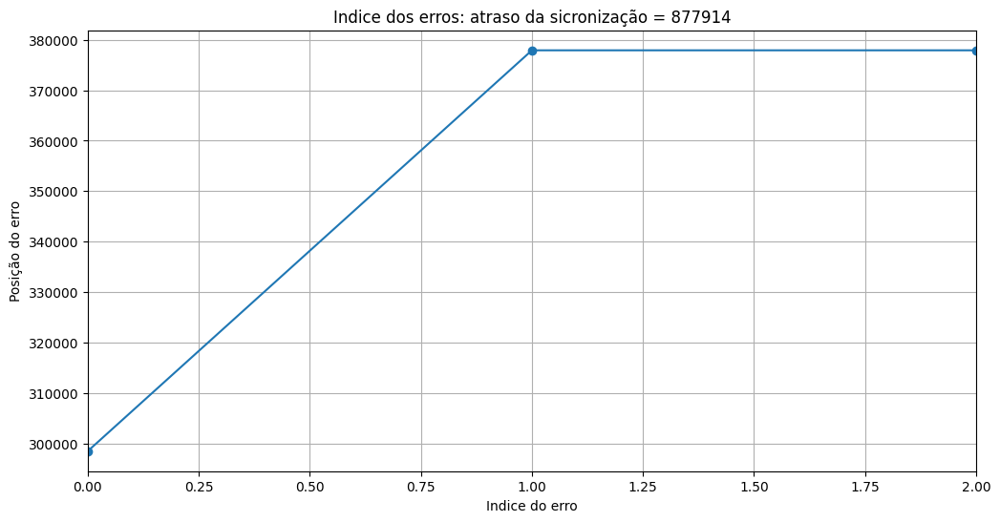

In [ ]:
paramCLKREC = parameters()
paramCLKREC.isNyquist = True
paramCLKREC.returnTiming = True
paramCLKREC.ki = 1e-10
paramCLKREC.kp = 1e-5
#paramCLKREC.maxPPM = 1


print(f'Numero de pontos do osciloscopio: {len(recebido)}')
print(f'Frequencia de amostragem do osciloscopio: {round(fsScope*1e-6,3)} MHz')

transmitido = pnorm(transmitido-np.mean(transmitido))
recebido = pnorm(recebido-np.mean(recebido))

pulso = pulseShape(Modulador['formatoPulso'], (fsScope/Dac['fs']), Modulador['nTaps'], Modulador['alpha'])
pulso = pulso/max(abs(pulso))
filtrocasado = firFilter(pulso,recebido)
filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
filtrocasado, ted_values = gardnerClockRecovery(filtrocasado, paramCLKREC)
filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
plt.plot(ted_values)
filtrocasado = filtrocasado[:,0]

# paramDec = parameters()
# paramDec.SpS_in  = int(fsScope/Dac['fs'])
# paramDec.SpS_out = 1
# recebidodecimado = decimate(filtrocasado, paramDec)[:,0]
# recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))
recebidodecimado = clockSamplingInterp(filtrocasado.reshape(-1,1),Fs_in=(fsScope/Dac['fs']),Fs_out=1,jitter_rms=0)[:,0]
recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))
recebidosicronizado = recebidodecimado

simbolos = modulateGray(bits,4,'pam')
simbolos = pnorm(simbolos-np.mean(simbolos))

simbolos,delay = sicronizarSinais(simbolos,(recebidosicronizado),plot=True,returnTiming=True)
#simbolos = simbolos[0:len(simbolos)]
simbolos = pnorm(simbolos-np.mean(simbolos))

simbolos = simbolos[500000:]
recebidosicronizado = recebidosicronizado[500000:]

print(len(recebidosicronizado))
print(len(simbolos))
# recebidosicronizado = recebidosicronizado[1:-1]
# simbolos = simbolos[1:-1]

plt.figure()
plt.plot((simbolos)[0:0+20],'o-',label='Simbolos transmitidos')
plt.plot((recebidosicronizado)[0:0+20],'o-',label='Simbolos recebidos')
plt.title('Comparação dos simbolos')
plt.xlabel('indices')
plt.ylabel('Amplitude')
plt.grid()
plt.legend()

plt.figure()
diferenca = simbolos - recebidosicronizado
plt.plot(diferenca,label='erro')
plt.axhline(-0.4470,linestyle='--',color='k',label='Limite para decisão errada')
plt.axhline(0.4470,linestyle='--',color='k')
plt.title('Erro entre os simbolos transmitidos e recebidos')
plt.xlabel('indices')
plt.ylabel('Amplitude')
plt.ylim(-0.5,0.5)
plt.grid()
plt.legend()

plt.figure()
plt.hist(diferenca,bins=500)
plt.axvline(-0.4470,linestyle='--',color='k',label='Limite para decisão errada')
plt.axvline(0.4470,linestyle='--',color='k')
plt.title('Distribuição do erro entre os simbolos transmitidos e recebidos')
plt.xlim(-0.5,0.5)
plt.xlabel('valor')
plt.ylabel('numero de ocorrencias')
plt.grid()
plt.legend()

ber,ser,SNRdB = (fastBERcalc(pnorm(recebidosicronizado), pnorm(simbolos), 4, 'pam'))
erros = np.argwhere(np.abs(diferenca)>0.4470)
print(f'BER: {ber[0]}')
print(f'SER: {ser[0]}')
print(f'Numero de error totais: {len(erros)}')
print(f'SNR: {SNRdB[0]} dB')

from scipy.special import erfc

def Q(x):
    return 0.5*erfc(x/np.sqrt(2))
SNR = 10**(SNRdB/10)
print(f'Numero de erros teoricos para essa SNR: {2*(4-1)/4*Q(np.sqrt((6*SNR)/(4**2-1)))}')

plt.figure()
eyediagram(filtrocasado[1000000:],len(filtrocasado[1000000:]),(fsScope/Dac['fs']),ptype='fancy')

plt.figure()
plt.title('Densidade Espectral de Potencia dos Sinais')
plt.psd(recebido,Fs=fsScope, NFFT = 1024, sides='twosided', label = 'Recebido')
plt.psd(transmitido,Fs=Dac['fs']*Modulador['SPS'], NFFT = 1024, sides='twosided', label = 'Transmitido')
plt.xlim(-0.5e9,0.5e9)
plt.legend()

plt.figure()
plt.plot(erros,'o-')
plt.title(f'Indice dos erros: atraso da sicronização = {delay}')
plt.grid()
plt.xlabel('Indice do erro')
plt.ylabel('Posição do erro')
plt.xlim(0,len(erros)-1)

Numero de pontos do osciloscopio: 2000000
Frequencia de amostragem do osciloscopio: 1000.0 MHz
500000
500000
BER: 0.156116
SER: 0.309552
Numero de error totais: 179919
SNR: 6.474083176241285 dB
Numero de erros teoricos para essa SNR: [0.13697138]


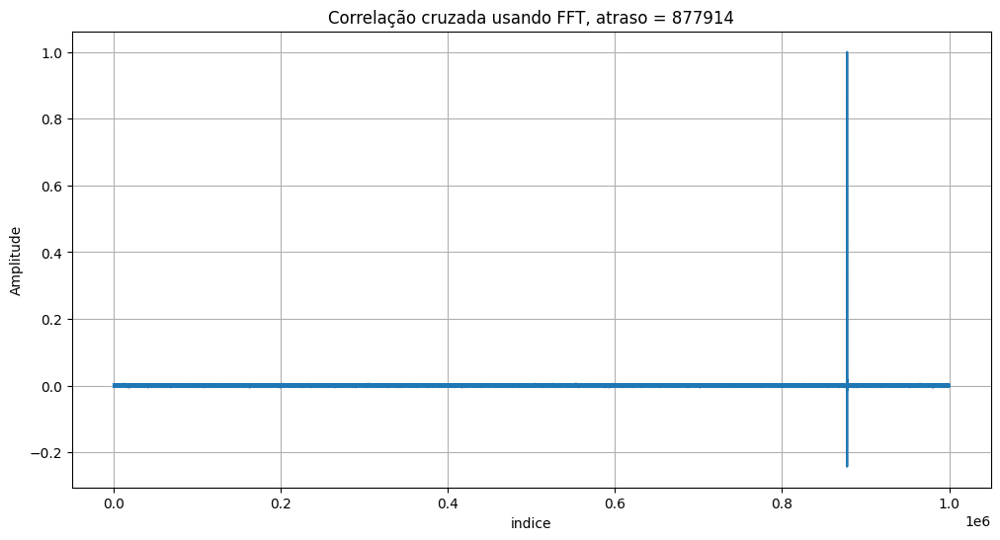

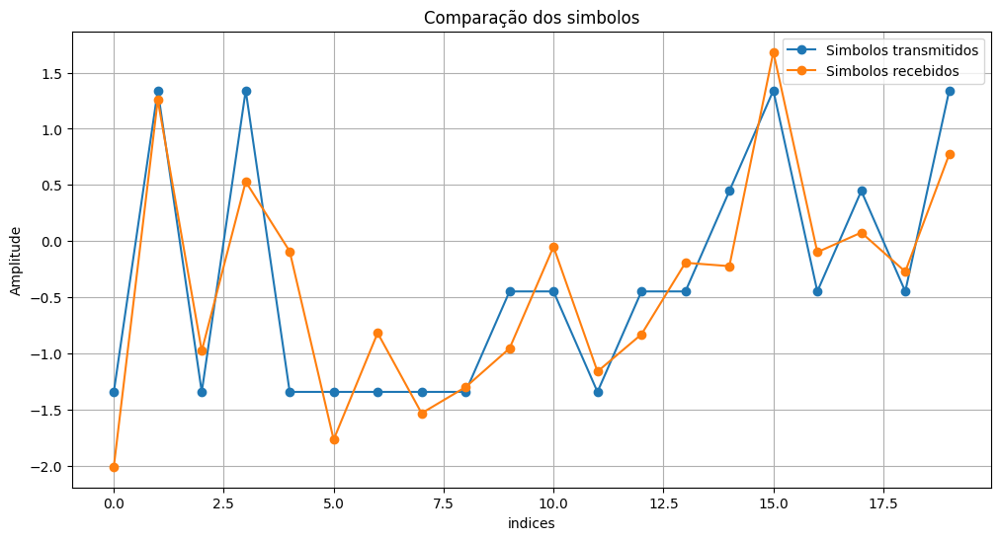

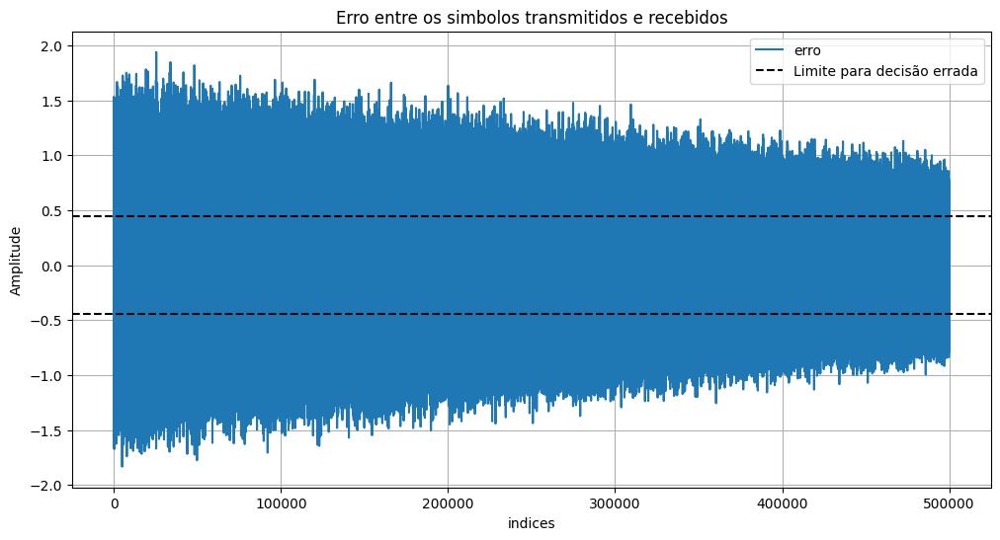

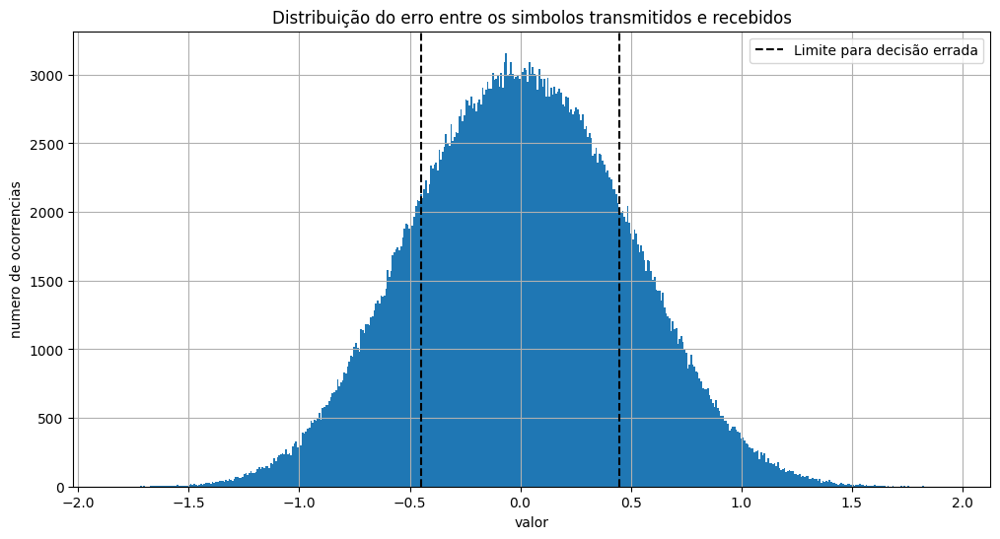

<Figure size 1200x600 with 0 Axes>

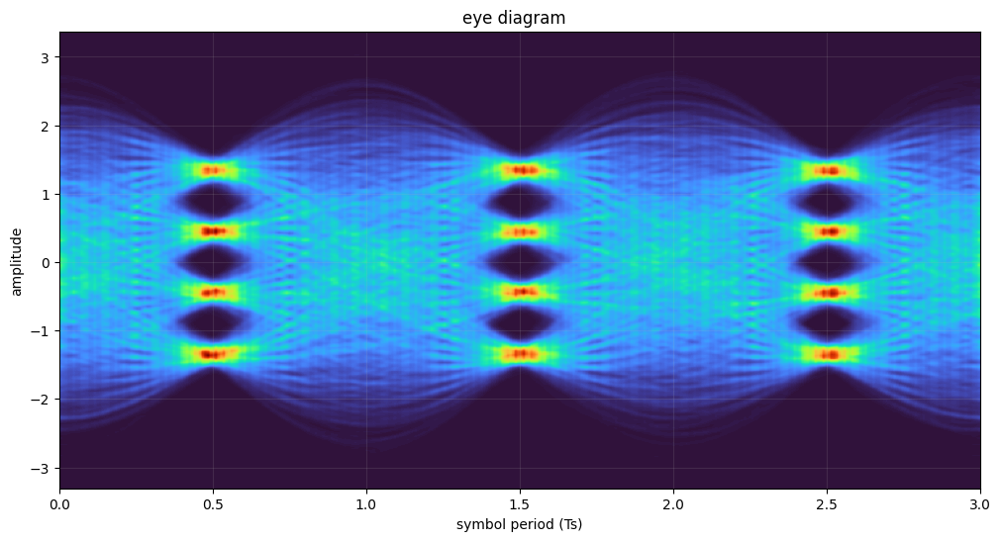

(0.0, 179918.0)

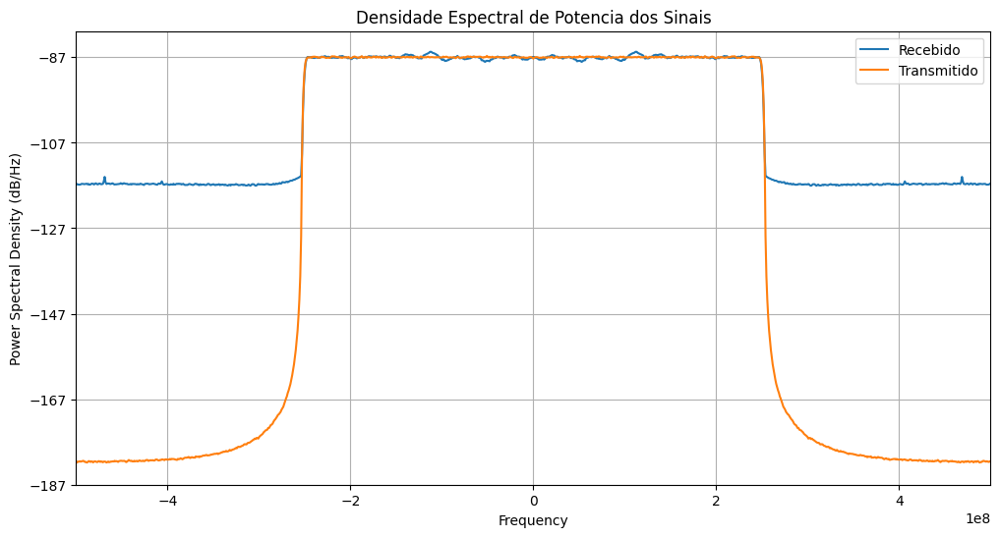

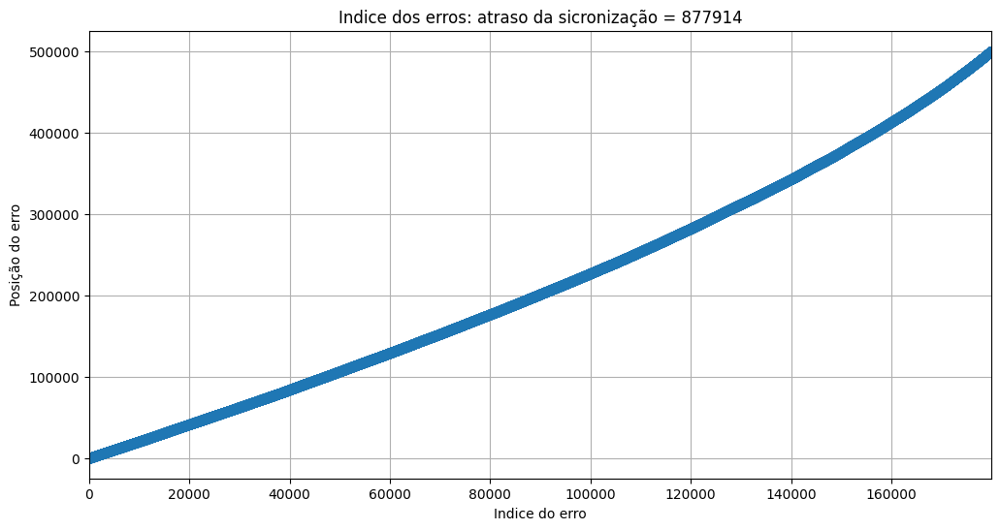

In [ ]:
paramCLKREC = parameters()
paramCLKREC.isNyquist = True
paramCLKREC.returnTiming = True
paramCLKREC.ki = 1e-10
paramCLKREC.kp = 1e-5
#paramCLKREC.maxPPM = 1


print(f'Numero de pontos do osciloscopio: {len(recebido)}')
print(f'Frequencia de amostragem do osciloscopio: {round(fsScope*1e-6,3)} MHz')

transmitido = pnorm(transmitido-np.mean(transmitido))
recebido = pnorm(recebido-np.mean(recebido))

pulso = pulseShape(Modulador['formatoPulso'], (fsScope/Dac['fs']), Modulador['nTaps'], Modulador['alpha'])
pulso = pulso/max(abs(pulso))
filtrocasado = firFilter(pulso,recebido)
filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
# filtrocasado, ted_values = gardnerClockRecovery(filtrocasado, paramCLKREC)
# filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
# plt.plot(ted_values)
# filtrocasado = filtrocasado[:,0]

# paramDec = parameters()
# paramDec.SpS_in  = int(fsScope/Dac['fs'])
# paramDec.SpS_out = 1
# recebidodecimado = decimate(filtrocasado, paramDec)[:,0]
# recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))
recebidodecimado = clockSamplingInterp(filtrocasado.reshape(-1,1),Fs_in=(fsScope/Dac['fs']),Fs_out=1,jitter_rms=0)[:,0]
recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))
recebidosicronizado = recebidodecimado

simbolos = modulateGray(bits,4,'pam')
simbolos = pnorm(simbolos-np.mean(simbolos))

simbolos,delay = sicronizarSinais(simbolos,(recebidosicronizado),plot=True,returnTiming=True)
#simbolos = simbolos[0:len(simbolos)]
simbolos = pnorm(simbolos-np.mean(simbolos))

simbolos = simbolos[500000:]
recebidosicronizado = recebidosicronizado[500000:]

print(len(recebidosicronizado))
print(len(simbolos))
# recebidosicronizado = recebidosicronizado[1:-1]
# simbolos = simbolos[1:-1]

plt.figure()
plt.plot((simbolos)[0:0+20],'o-',label='Simbolos transmitidos')
plt.plot((recebidosicronizado)[0:0+20],'o-',label='Simbolos recebidos')
plt.title('Comparação dos simbolos')
plt.xlabel('indices')
plt.ylabel('Amplitude')
plt.grid()
plt.legend()

plt.figure()
diferenca = simbolos - recebidosicronizado
plt.plot(diferenca,label='erro')
plt.axhline(-0.4470,linestyle='--',color='k',label='Limite para decisão errada')
plt.axhline(0.4470,linestyle='--',color='k')
plt.title('Erro entre os simbolos transmitidos e recebidos')
plt.xlabel('indices')
plt.ylabel('Amplitude')
#plt.ylim(-0.5,0.5)
plt.grid()
plt.legend()

plt.figure()
plt.hist(diferenca,bins=500)
plt.axvline(-0.4470,linestyle='--',color='k',label='Limite para decisão errada')
plt.axvline(0.4470,linestyle='--',color='k')
plt.title('Distribuição do erro entre os simbolos transmitidos e recebidos')
#plt.xlim(-0.5,0.5)
plt.xlabel('valor')
plt.ylabel('numero de ocorrencias')
plt.grid()
plt.legend()

ber,ser,SNRdB = (fastBERcalc(pnorm(recebidosicronizado), pnorm(simbolos), 4, 'pam'))
erros = np.argwhere(np.abs(diferenca)>0.4470)
print(f'BER: {ber[0]}')
print(f'SER: {ser[0]}')
print(f'Numero de error totais: {len(erros)}')
print(f'SNR: {SNRdB[0]} dB')

from scipy.special import erfc

def Q(x):
    return 0.5*erfc(x/np.sqrt(2))
SNR = 10**(SNRdB/10)
print(f'Numero de erros teoricos para essa SNR: {2*(4-1)/4*Q(np.sqrt((6*SNR)/(4**2-1)))}')

plt.figure()
eyediagram(filtrocasado,len(filtrocasado),(fsScope/Dac['fs']),ptype='fancy')

plt.figure()
plt.title('Densidade Espectral de Potencia dos Sinais')
plt.psd(recebido,Fs=fsScope, NFFT = 1024, sides='twosided', label = 'Recebido')
plt.psd(transmitido,Fs=Dac['fs']*Modulador['SPS'], NFFT = 1024, sides='twosided', label = 'Transmitido')
plt.xlim(-0.5e9,0.5e9)
plt.legend()

# plt.figure()
# diferenca = transmitido - recebidosicronizado
# plt.plot(diferenca[0::len(diferenca)//1000])
#recebidodecimado = clockSamplingInterp(recebido.reshape(-1,1),Fs_in=fsScope,Fs_out=Dac['fs']*Modulador['SPS'],jitter_rms=0)[:,0]
#recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))

plt.figure()
#plt.plot((recebidosicronizado)[167372-10:167372+20],'o-')
plt.plot(erros,'o-')
plt.title(f'Indice dos erros: atraso da sicronização = {delay}')
plt.grid()
plt.xlabel('Indice do erro')
plt.ylabel('Posição do erro')
plt.xlim(0,len(erros)-1)

# Optica

In [196]:
((fsScope/Dac['fs']))

2.5

In [4]:
def recepcao(bits,transmitido,recebido,fsScope,Modulador,Dac,ClockRecovery,plot=False):

    paramCLKREC = parameters()
    paramCLKREC.isNyquist = True
    paramCLKREC.returnTiming = True
    paramCLKREC.ki = ClockRecovery['Ki']
    paramCLKREC.kp = ClockRecovery['Kp']
    #paramCLKREC.maxPPM = 1

    transmitido = pnorm(transmitido-np.mean(transmitido))
    recebido = pnorm(recebido-np.mean(recebido))

    pulso = pulseShape(Modulador['formatoPulso'], (fsScope/Dac['fs']), Modulador['nTaps'], Modulador['alpha'])
    pulso = pulso/max(abs(pulso))
    filtrocasado = firFilter(pulso,recebido)
    filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
    olho = filtrocasado
    if ((fsScope/Dac['fs']))!=2.0:
        print('oi') 
        filtrocasado = clockSamplingInterp(filtrocasado.reshape(-1,1),Fs_in=(fsScope/Dac['fs']),Fs_out=2,jitter_rms=0)[:,0]
    # filtrocasado, ted_values = gardnerClockRecovery(filtrocasado, paramCLKREC)
    # filtrocasado = pnorm(filtrocasado-np.mean(filtrocasado))
    # filtrocasado = filtrocasado[:,0]
    recebidodecimado = clockSamplingInterp(filtrocasado.reshape(-1,1),Fs_in=2,Fs_out=1,jitter_rms=0)[:,0]
    recebidodecimado = pnorm(recebidodecimado-np.mean(recebidodecimado))
    recebidosicronizado = recebidodecimado

    simbolos = modulateGray(bits,Modulador['M'],'pam')
    simbolos = pnorm(simbolos-np.mean(simbolos))

    simbolos,delay = sicronizarSinais(simbolos,(recebidosicronizado),plot=plot,returnTiming=True)
    #simbolos = simbolos[0:len(simbolos)]
    simbolos = pnorm(simbolos-np.mean(simbolos))
    simbolos = simbolos[ClockRecovery['Descarte']:]
    recebidosicronizado = recebidosicronizado[ClockRecovery['Descarte']:]
    diferenca = simbolos - recebidosicronizado
    ber,ser,SNRdB = (fastBERcalc(pnorm(recebidosicronizado), pnorm(simbolos), Modulador['M'], 'pam'))
    erros = np.argwhere(np.abs(diferenca)>0.4470)

    print(f'BER: {ber[0]}')
    print(f'SER: {ser[0]}')
    print(f'Numero de error totais: {len(erros)}')
    print(f'SNR: {SNRdB[0]} dB')

    from scipy.special import erfc

    def Q(x):
        return 0.5*erfc(x/np.sqrt(2))
    SNR = 10**(SNRdB[0]/10)
    print(f'Numero de erros teoricos para essa SNR: {2*(4-1)/4*Q(np.sqrt((6*SNR)/(4**2-1)))}')

    # print(len(recebidosicronizado))
    # print(len(simbolos))
    # # recebidosicronizado = recebidosicronizado[1:-1]
    # # simbolos = simbolos[1:-1]

    if plot==True:
        plt.figure()
        eyediagram(olho,len(olho),(fsScope/Dac['fs']),ptype='fancy')
        
        # plt.figure()
        # plt.plot(ted_values)
        # plt.xlabel('Indice')
        # plt.ylabel('Correção do clock')
        # plt.title('Clock corrigido pelo Gardner Timing Recovery')
        # plt.grid()
        
        plt.figure()
        plt.plot((simbolos)[0:0+20],'o-',label='Simbolos transmitidos')
        plt.plot((recebidosicronizado)[0:0+20],'o-',label='Simbolos recebidos')
        plt.title('Comparação dos simbolos')
        plt.xlabel('indices')
        plt.ylabel('Amplitude')
        plt.grid()
        plt.legend()

        plt.figure()
        plt.plot(diferenca,label='erro')
        plt.axhline(-0.4470,linestyle='--',color='k',label='Limite para decisão errada')
        plt.axhline(0.4470,linestyle='--',color='k')
        plt.title('Erro entre os simbolos transmitidos e recebidos')
        plt.xlabel('indices')
        plt.ylabel('Amplitude')
        plt.grid()
        plt.legend()

        plt.figure()
        plt.hist(diferenca,bins=500)
        plt.axvline(-0.4470,linestyle='--',color='k',label='Limite para decisão errada')
        plt.axvline(0.4470,linestyle='--',color='k')
        plt.title('Distribuição do erro entre os simbolos transmitidos e recebidos')
        plt.xlabel('valor')
        plt.ylabel('numero de ocorrencias')
        plt.grid()
        plt.legend()

        plt.figure()
        plt.title('Densidade Espectral de Potencia dos Sinais')
        plt.psd(recebido,Fs=fsScope, NFFT = 1024, sides='twosided', label = 'Recebido')
        plt.psd(transmitido,Fs=Dac['fs']*Modulador['SPS'], NFFT = 1024, sides='twosided', label = 'Transmitido')
        plt.legend()

        # plt.figure()
        # plt.plot(erros,'o-')
        # plt.title(f'Indice dos erros: atraso da sicronização = {delay}')
        # plt.grid()
        # plt.xlabel('Indice do erro')
        # plt.ylabel('Posição do erro')
        # plt.xlim(0,len(erros)-1)
    #return 1,1,len(erros),1
    return ber[0],ser[0],len(erros),SNRdB[0]

In [5]:
(fsScope/Dac['fs'])

NameError: name 'fsScope' is not defined

In [47]:
signal_power(recebido)

0.0034862075133025444

In [46]:
np.max(recebido)

0.0911959815

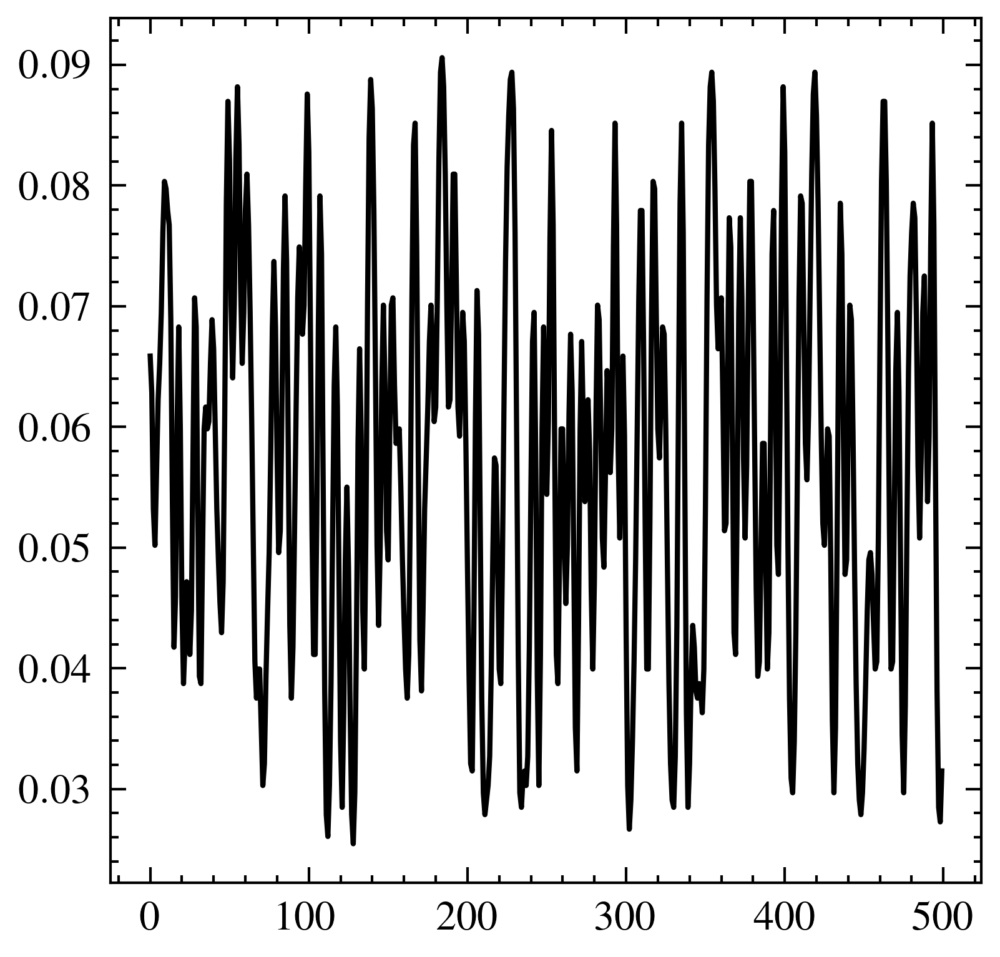

In [42]:
plt.plot(recebido[0:500])

In [70]:
print(signal_power(transmitido)/signal_power(transmitido))
print(10*np.log10(signal_power(transmitidoequalizados)/signal_power(transmitido)))

1.0
-0.48054533446524983


1.0272036095464276
1.1014331454555173
+0,"No error"

Numero de pontos do osciloscopio: 1500001
Frequencia de amostragem do osciloscopio: 1000.0 MHz
oi
BER: 0.206602735852635
SER: 0.3090506584460054
Numero de error totais: 90251
SNR: 1.210714043777053 dB
Numero de erros teoricos para essa SNR: 0.3503954035736347


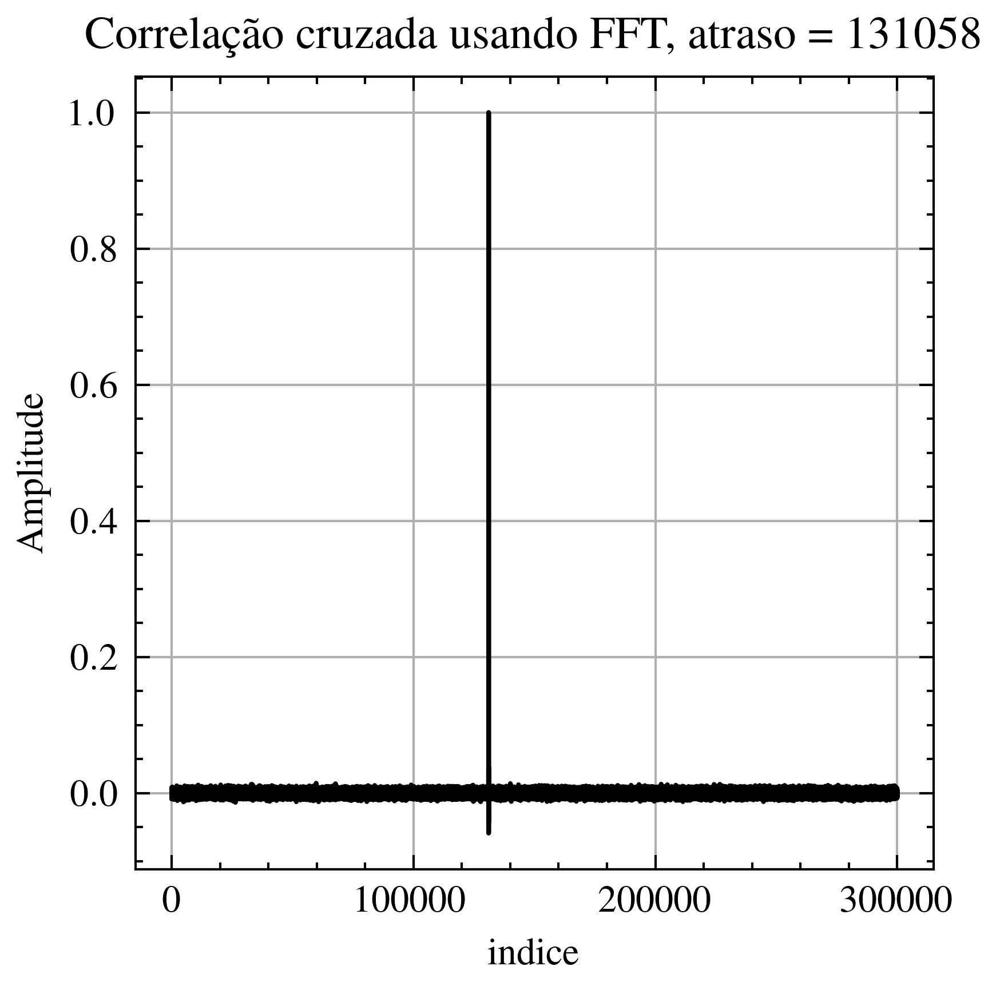

<Figure size 1800x1800 with 0 Axes>

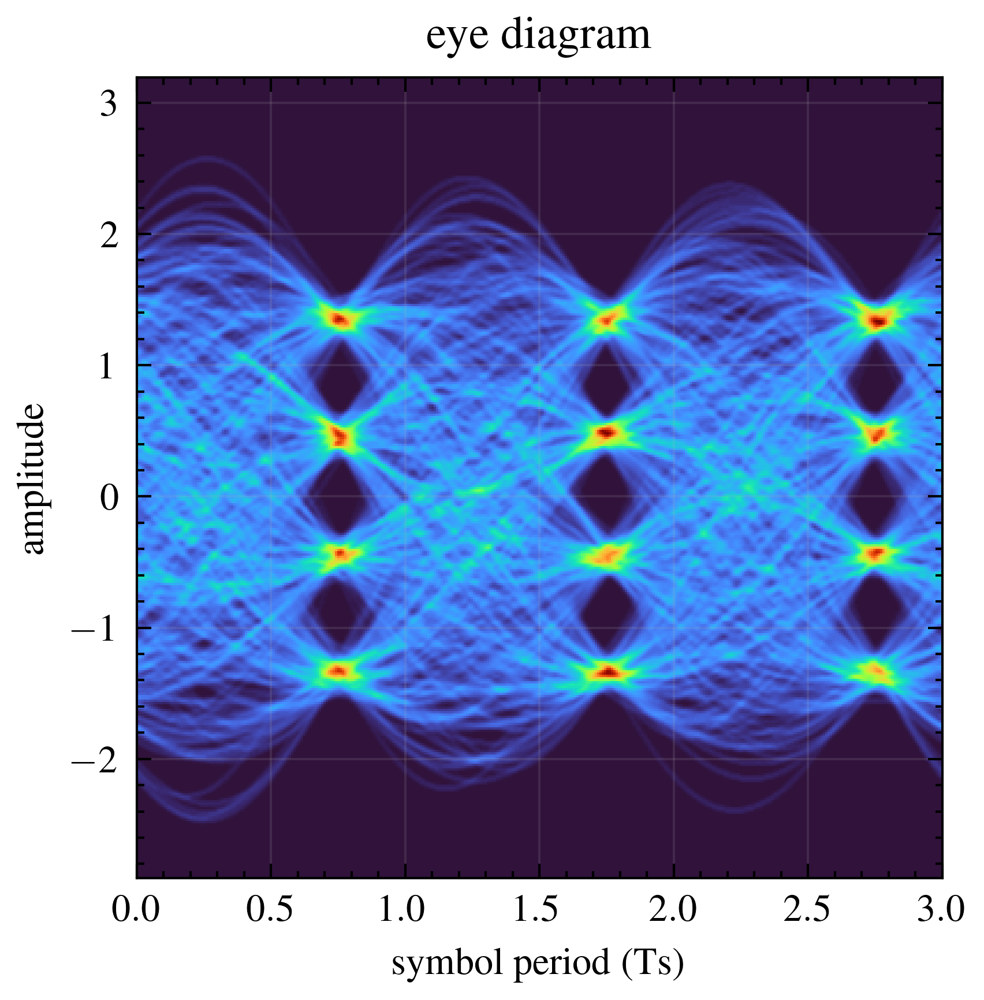

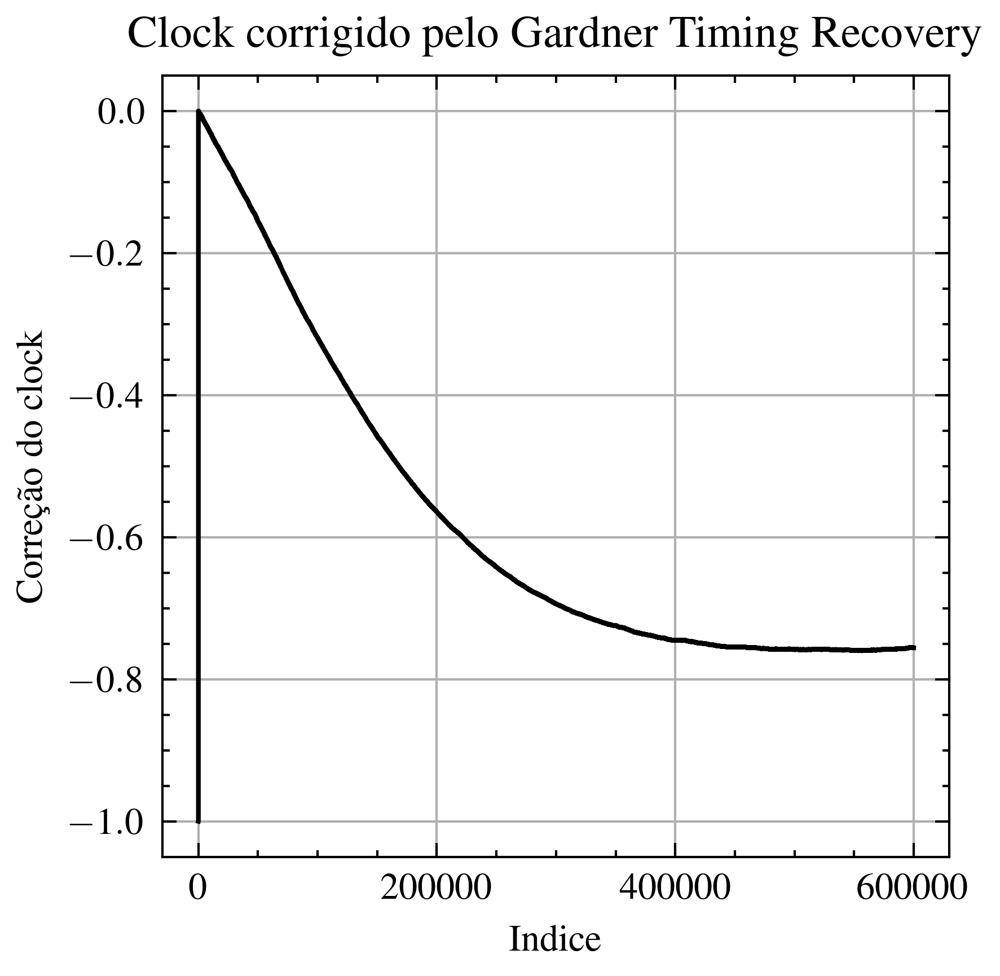

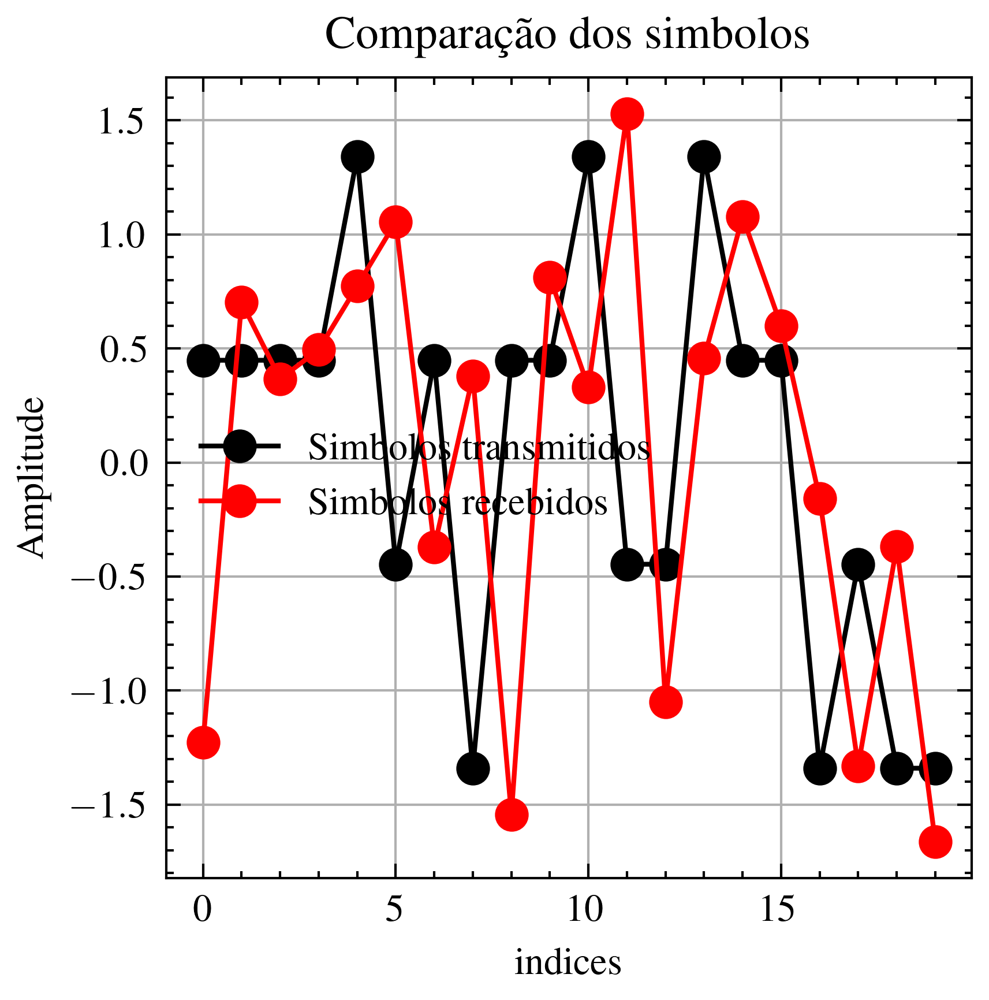

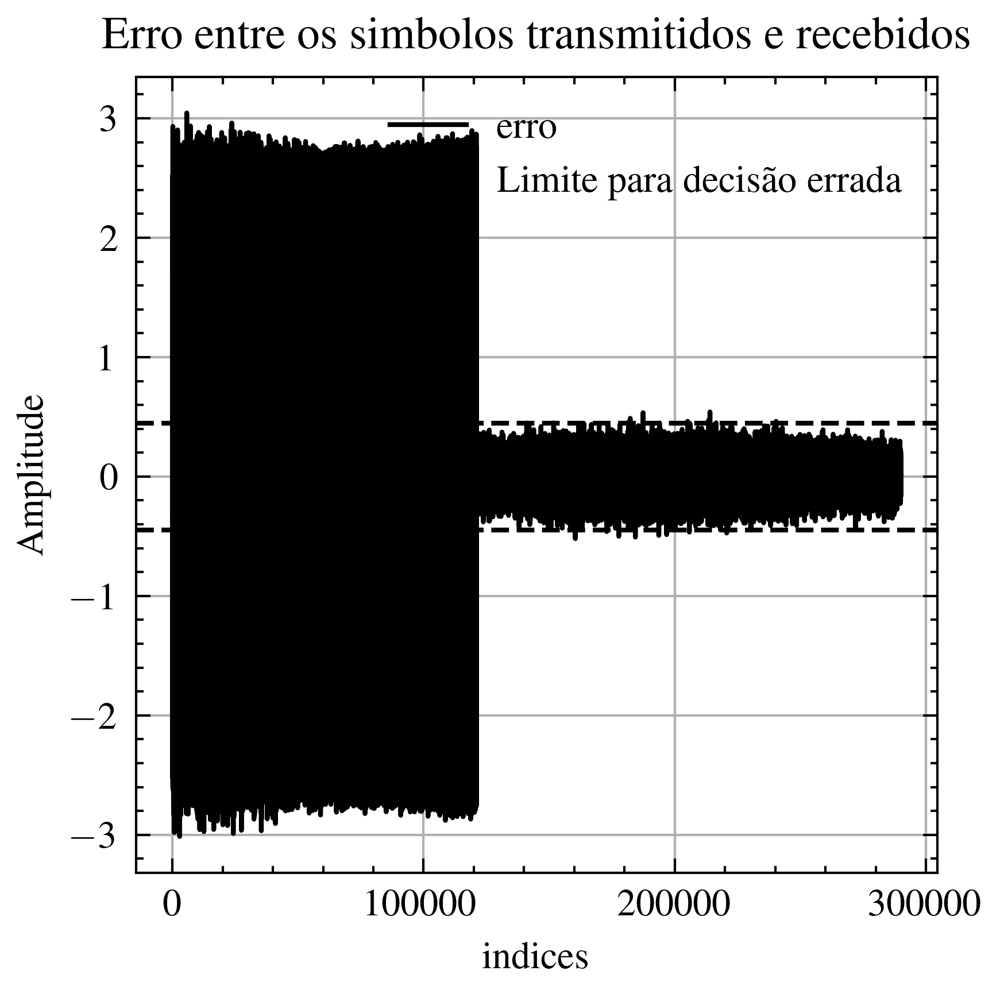

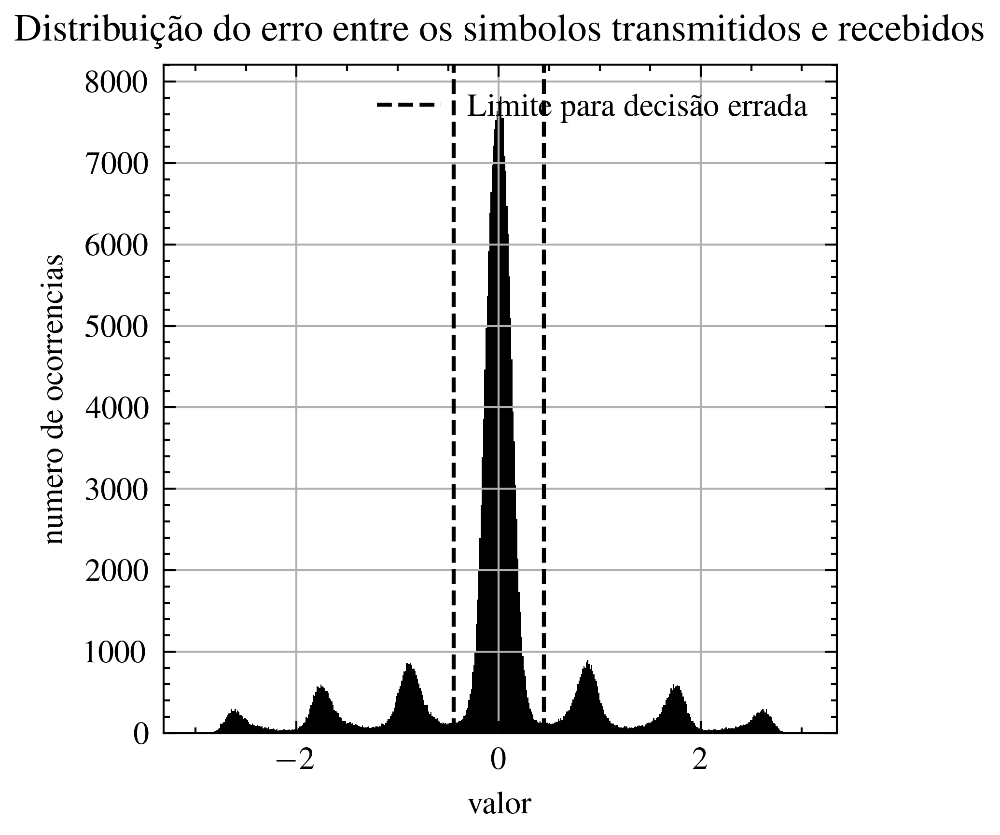

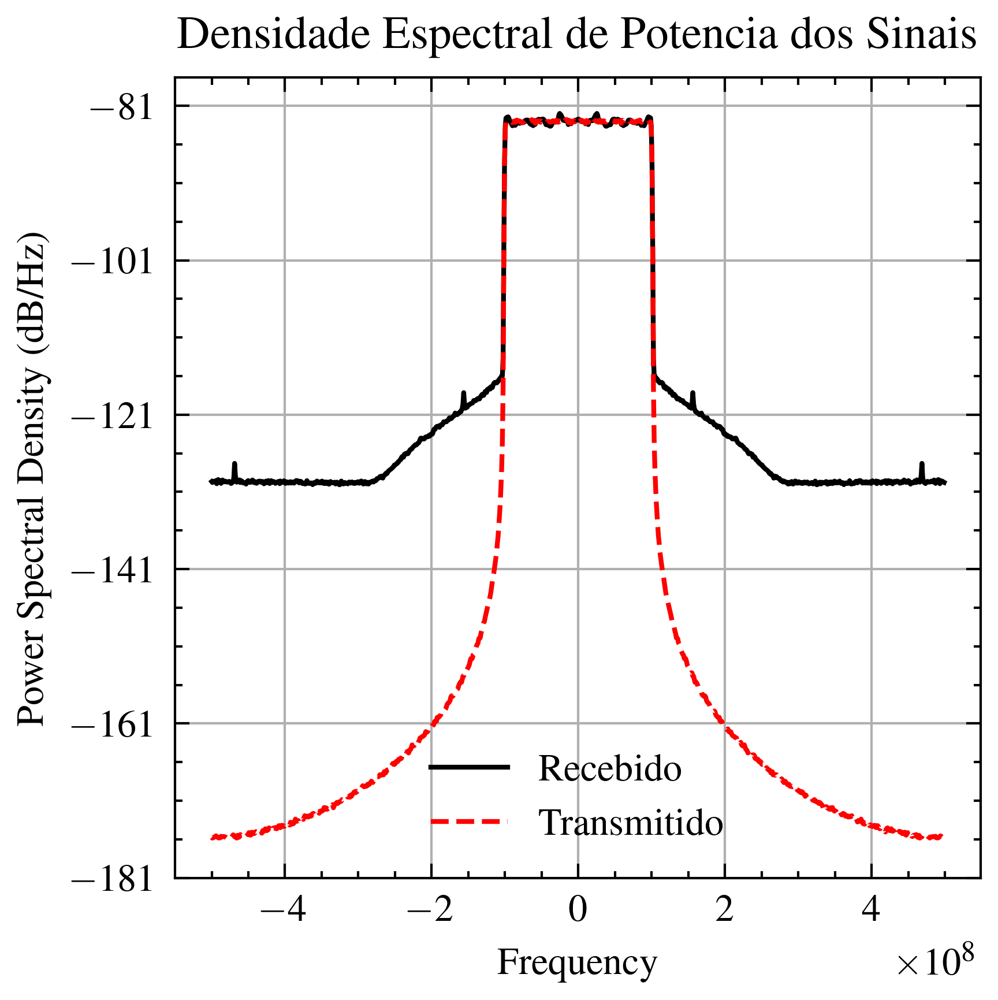

In [69]:
Modulador = {
    'M': 4,
    'nsimbolos': 3e5,
    'SPS': 5,
    'formatoPulso': 'rrc', #'rect','nrz','rrc'
    'nTaps': 1024,
    'alpha': 0.01,
    'W': np.load('Taps-pre-equalizacao-200Mbs-Optico.npy')
}

Dac = {
    'dispositivo': DAC,
    'Porta': 1,
    'fs': 200e6,
    'off_amp': True,
    'Amplitude': 5,
    'Off-set':-1.26,
    'V_High': -1.06,
    'V_Low': -3.06,
    'filtro': 'NORMal'
}

Osciloscopio = {
    'dispositivo': scope,
    'canais': np.array([1]),
    'tempo': 1*Modulador['nsimbolos']/(Dac['fs']),
    'vDivisao': np.array([15e-3]),
    'impedancia': np.array(['FIFTy']),
    'triggerChannel': np.array([0]),
    'triggerAmp': np.array([0]),
    'offset': np.array([52e-3]),
}

ClockRecovery = {
    'Ki': 1e-10,
    'Kp': 1e-5,
    'Descarte': 10000
}

#Gerando os sinais transmitidos
bits,pulso,transmitido, transmitidoequalizados = Gerar_Simbolos(Modulador)
#Gerando uma onda arbitraria no DAC
#Onda_Dac_Keysight(Dac,Modulador,transmitido,'teste')
Onda_Dac_Keysight(Dac,Modulador,-transmitidoequalizados,'teste')
DAC.query('*OPC?')   
#Configurando o osciloscopio
ConfigurarScope(Osciloscopio)
# Fixar o sinal no osciloscopio
Osciloscopio['dispositivo'].write('digitize')
Osciloscopio['dispositivo'].query('*OPC?')   

t,recebido = AdquirirOnda(Osciloscopio['dispositivo'],1)
fsScope = float(Osciloscopio['dispositivo'].query(':ACQuire:SRATe?'))

print(f'Numero de pontos do osciloscopio: {len(recebido)}')
print(f'Frequencia de amostragem do osciloscopio: {round(fsScope*1e-6,3)} MHz')
plt.rcParams["figure.figsize"] = (3,3)

ber,ser,Nerros,SNRdB = recepcao(bits,transmitido,recebido,fsScope,Modulador,Dac,ClockRecovery,plot=True)

In [484]:
recebidos = np.zeros([1,1500001])
atenuacao = np.array([])
snr = np.array([])
ber = np.array([])
Nerros = np.array([])
P1 = np.array([])
# atenuacao = np.append(atenuacao,2)
# atenuacao

In [347]:
atenuacao

array([], dtype=float64)

In [527]:
att = 17
P = -37.14
while(len(np.argwhere(atenuacao==att))<10):
    t,recebido = AdquirirOnda(Osciloscopio['dispositivo'],1)
    fsScope = float(Osciloscopio['dispositivo'].query(':ACQuire:SRATe?'))

    # print(f'Numero de pontos do osciloscopio: {len(recebido)}')
    # print(f'Frequencia de amostragem do osciloscopio: {round(fsScope*1e-6,3)} MHz')
    try:
        ber1,ser1,Nerros1,SNRdB1 = recepcao(bits,transmitido,recebido,fsScope,Modulador,Dac,ClockRecovery,plot=False)
    except:
        ber1,ser1,Nerros1,SNRdB1 = recepcao(bits,transmitido,recebido,fsScope,Modulador,Dac,ClockRecovery,plot=False)
    if SNRdB1 > 9:
        atenuacao = np.append(atenuacao,att)
        P1 = np.append(P1,P)
        snr = np.append(snr,SNRdB1)
        ber = np.append(ber,ber1)
        Nerros = np.append(Nerros,Nerros1)
        recebidos=np.append(recebidos,recebido.reshape((1,1500001)),axis=0)
        print(len(np.argwhere(atenuacao==att)))
    else:
        print('Descartado')

    


oi
BER: 0.14984344548814119
SER: 0.4254038306411291
Numero de error totais: 19953
SNR: 10.506903027749123 dB
Numero de erros teoricos para essa SNR: 0.025492406316304526
1
oi
BER: 0.15287111111111112
SER: 0.43116666666666664
Numero de error totais: 21042
SNR: 10.331387057562868 dB
Numero de erros teoricos para essa SNR: 0.028297290487590346
2
oi
BER: 0.14938222222222222
SER: 0.42383333333333334
Numero de error totais: 19996
SNR: 10.513792394333812 dB
Numero de erros teoricos para essa SNR: 0.025386232836698053
3
oi
BER: 0.1525622222222222
SER: 0.43029333333333336
Numero de error totais: 21050
SNR: 10.366749469491834 dB
Numero de erros teoricos para essa SNR: 0.0277166222767389
4
oi
BER: 0.2398872896402913
SER: 0.5428830474463504
Numero de error totais: 44372
SNR: 2.51038994594567 dB
Numero de erros teoricos para essa SNR: 0.2988334086211165
Descartado
oi
BER: 0.1482990113399244
SER: 0.4212505249965
Numero de error totais: 19681
SNR: 10.572883069145592 dB
Numero de erros teoricos para e

In [448]:
recebidos = np.delete(recebidos,-1,0)
atenuacao = np.delete(atenuacao,-1)
snr = np.delete(snr,-1)
ber = np.delete(ber,-1)
Nerros = np.delete(Nerros,-1)
P1 = np.delete(P1,-1)

In [528]:
np.savez('Experimento_200MB_optico-PreEqualizado-8PAM',bits=bits,transmitido=transmitido,recebidos=np.delete(recebidos,0,0),atenuacao=atenuacao,P1=P1,snr=snr,ber=ber,Nerros=Nerros)

In [29]:
resultado = np.load('Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz')
recebidos = resultado['recebidos']
atenuacao = resultado['atenuacao']
snr = resultado['snr']
ber = resultado['ber']
Nerros = resultado['Nerros']
P1 = resultado['P1']
resultado.keys()

KeysView(NpzFile 'Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz' with keys: bits, transmitido, recebidos, atenuacao, P1...)

In [30]:
10*np.log10(signal_power(recebidos[0,:])*1000)

-9.196365497933163

In [27]:
np.sum(recebidos[0,:]**2)/len(recebidos[0,:])*1000

1.582490091298672

In [28]:
10*np.log10(signal_power(recebidos[0,:])*1000)

1.9934099937957783

In [43]:
atenuacao[0]

1.0

In [50]:
np.unique(atenuacao)

array([ 1. ,  1.5,  2. ,  2.5,  3. ,  3.5,  4. ,  4.5,  5. ,  5.5,  6. ,
        6.5,  7. ,  7.5,  8. ,  8.5,  9. ,  9.5, 10. , 10.5, 11. , 11.5,
       12. ])

# Resultados

In [ ]:
arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico.npz','Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz'])
legenda = np.array(['Sem pré-equalização','Com pré-equalização'])

plt.rcParams["figure.figsize"] = (5,3)
for p in range(len(arquivos)):
    resultado = np.load(arquivos[p])
    recebidos = resultado['recebidos']
    atenuacao = resultado['atenuacao']
    snr = resultado['snr']
    ber = resultado['ber']
    Nerros = resultado['Nerros']
    P1 = resultado['P1']
    resultado.keys()


    atenuacao_unica = np.unique(atenuacao)
    if arquivos[p] == 'Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz':
        atenuacao_unica = atenuacao_unica[2:]
    atenuacao_media = np.zeros(len(atenuacao_unica))
    P_media = np.zeros(len(atenuacao_unica))
    snr_media = np.zeros(len(atenuacao_unica))
    ber_media = np.zeros(len(atenuacao_unica))
    Nerros_media = np.zeros(len(atenuacao_unica))

    for i in range(len(atenuacao_unica)):
        np.argwhere(atenuacao==atenuacao_unica[i])
        atenuacao_media[i] = np.mean(atenuacao[np.argwhere(atenuacao==atenuacao_unica[i])])
        P_media[i] = np.mean(P1[np.argwhere(atenuacao==atenuacao_unica[i])])
        snr_media[i] = np.mean(snr[np.argwhere(atenuacao==atenuacao_unica[i])])
        ber_media[i] = np.mean(ber[np.argwhere(atenuacao==atenuacao_unica[i])])
        Nerros_media[i] = np.mean(Nerros[np.argwhere(atenuacao==atenuacao_unica[i])])

    # plt.figure(1)
    # plt.plot(atenuacao_media,P_media + 20.45,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('Potencia na entrada do receptor (dBm)')
    # plt.grid(visible=True)
    # plt.legend()

    # plt.figure(2)
    # plt.plot(atenuacao_media,snr_media,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('SNR (dB)')
    # plt.grid(visible=True)
    # plt.legend()

    plt.figure(3)
    plt.plot(P_media+20.45,snr_media,label=legenda[p])
    # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    plt.xlabel('Potencia na entrada do receptor (dBm)')
    plt.ylabel('SNR (dB)')
    # plt.grid(visible=True)
    plt.legend()

    ##

    # plt.figure(4)
    # plt.semilogy(atenuacao_media,ber_media,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('Bit error rate')
    # plt.grid(visible=True)
    # plt.legend()

    plt.figure(5)
    plt.semilogy(P_media+20.45,ber_media,label=legenda[p])
    # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    plt.xlabel('Potencia na entrada do receptor (dBm)')
    plt.ylabel('Bit error rate')
    # plt.grid(visible=True)
    plt.legend()

    plt.figure(6)
    plt.semilogy(snr_media,ber_media,label=legenda[p])
    # plt.xlim(snr_media[0],snr_media[-1])
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    plt.xlabel('SNR (dB)')
    plt.ylabel('Bit error rate')
    # plt.grid(visible=True)
    plt.legend()

    

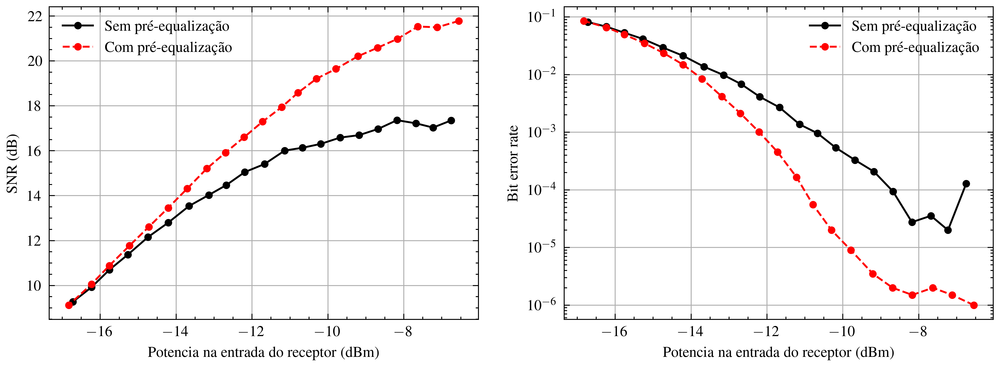

In [10]:
arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_300MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_400MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz'])
legenda = np.array(['200 Mbaud','300 Mbaud','400 Mbaud','500 Mbaud'])

arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico.npz','Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz'])
legenda = np.array(['Sem pré-equalização','Com pré-equalização'])

fig, (ax1, ax2) = plt.subplots(1, 2)
plt.rcParams["figure.figsize"] = (9,3)

for p in range(len(arquivos)):
    resultado = np.load(arquivos[p])
    recebidos = resultado['recebidos']
    atenuacao = resultado['atenuacao']
    snr = resultado['snr']
    ber = resultado['ber']
    Nerros = resultado['Nerros']
    P1 = resultado['P1']
    resultado.keys()


    atenuacao_unica = np.unique(atenuacao)
    if arquivos[p] == 'Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz':
        atenuacao_unica = atenuacao_unica[2:]
    atenuacao_media = np.zeros(len(atenuacao_unica))
    P_media = np.zeros(len(atenuacao_unica))
    snr_media = np.zeros(len(atenuacao_unica))
    ber_media = np.zeros(len(atenuacao_unica))
    Nerros_media = np.zeros(len(atenuacao_unica))

    for i in range(len(atenuacao_unica)):
        np.argwhere(atenuacao==atenuacao_unica[i])
        atenuacao_media[i] = np.mean(atenuacao[np.argwhere(atenuacao==atenuacao_unica[i])])
        P_media[i] = np.mean(P1[np.argwhere(atenuacao==atenuacao_unica[i])])
        snr_media[i] = np.mean(snr[np.argwhere(atenuacao==atenuacao_unica[i])])
        ber_media[i] = np.mean(ber[np.argwhere(atenuacao==atenuacao_unica[i])])
        Nerros_media[i] = np.mean(Nerros[np.argwhere(atenuacao==atenuacao_unica[i])])

    # plt.figure(1)
    # plt.plot(atenuacao_media,P_media + 20.45,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('Potencia na entrada do receptor (dBm)')
    # plt.grid(visible=True)
    # plt.legend()

    # plt.figure(2)
    # plt.plot(atenuacao_media,snr_media,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('SNR (dB)')
    # plt.grid(visible=True)
    # plt.legend()


    ax1.plot(P_media+20.45,snr_media,label=legenda[p], marker="o", markersize=3)
    # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    ax1.set_xlabel('Potencia na entrada do receptor (dBm)')
    ax1.set_ylabel('SNR (dB)')
    ax1.grid(visible=True)
    ax1.legend()

    ax2.semilogy(P_media+20.45,ber_media,label=legenda[p], marker="o", markersize=3)
    # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    ax2.set_xlabel('Potencia na entrada do receptor (dBm)')
    ax2.set_ylabel('Bit error rate')
    ax2.grid(visible=True)
    ax2.legend()

    # plt.figure(6)
    # plt.semilogy(snr_media,ber_media,label=legenda[p])
    # # plt.xlim(snr_media[0],snr_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('SNR (dB)')
    # plt.ylabel('Bit error rate')
    # # plt.grid(visible=True)
    # plt.legend()

In [15]:

resultado = np.load('Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado-8PAM.npz')
recebidos = resultado['recebidos']
atenuacao = resultado['atenuacao']
snr = resultado['snr']
ber = resultado['ber']
Nerros = resultado['Nerros']
P1 = resultado['P1']
resultado.keys()


[0.00596222 0.00267554 0.00565778 0.00416886 0.00187111 0.00385553
 0.00444    0.00519778 0.00404442 0.00500889 0.00457997 0.00538444
 0.00423108 0.00209556 0.00222889 0.00397331 0.00306444 0.00227332
 0.00465108 0.00544667 0.00256667 0.00813111 0.00730667 0.00459333
 0.00456441 0.00409775 0.00484    0.00310667 0.00639556 0.00276443
 0.00608444 0.00660222 0.00572444 0.00476219 0.00666222 0.00476886
 0.01371556 0.00454667 0.00841333 0.00294444 0.00411556 0.00628444
 0.00571552 0.0063644  0.00844222 0.00617333 0.00719329 0.00842444
 0.00689995 0.00861556 0.00866667 0.00462219 0.00863994 0.00975778
 0.03397556 0.00714    0.01020444 0.00837328 0.01472667 0.00715551
 0.01008222 0.00893111 0.01067333 0.00732    0.01048437 0.01710222
 0.01210667 0.01034    0.00716444 0.01117333 0.00958216 0.01055326
 0.01303778 0.01317102 0.01185778 0.01221547 0.00958    0.02918667
 0.01325111 0.01717333 0.01724222 0.01591778 0.0137488  0.01053326
 0.02134    0.01374889 0.02186222 0.01131104 0.01544444 0.0147

In [7]:
snr_var

array([0.08247686, 0.0391296 , 0.07836176, 0.03357538, 0.05666623,
       0.01245205, 0.03120614, 0.02789584, 0.00904729, 0.01433028,
       0.00915922, 0.00983624, 0.00798526, 0.00756774, 0.00557195,
       0.00831276, 0.00265993, 0.00508925, 0.0053932 , 0.00257233,
       0.00145861])

In [16]:
P_media+20.45

array([ -1.71,  -2.19,  -2.65,  -3.12,  -3.68,  -4.18,  -4.68,  -5.19,
        -5.7 ,  -6.23,  -6.77,  -7.29,  -7.68,  -8.13,  -8.62,  -9.14,
        -9.68, -10.21, -10.74, -11.22, -11.78])

In [19]:
for i in range(len(atenuacao_unica)):
    snr_var[i] = np.var(snr[np.argwhere(atenuacao==atenuacao_unica[i])])
snr_var

array([0.08247686, 0.0391296 , 0.07836176, 0.03357538, 0.05666623,
       0.01245205, 0.03120614, 0.02789584, 0.00904729, 0.01433028,
       0.00915922, 0.00983624, 0.00798526, 0.00756774, 0.00557195,
       0.00831276, 0.00265993, 0.00508925, 0.0053932 , 0.00257233,
       0.00145861])

In [25]:
ber_media

array([6.000000e-06, 3.600000e-06, 4.500000e-06, 8.100000e-06,
       1.730000e-05, 5.410000e-05, 9.950000e-05, 2.828000e-04,
       7.054000e-04, 1.494500e-03, 3.345300e-03, 6.215200e-03,
       9.898000e-03, 1.581070e-02, 2.594400e-02, 3.777520e-02,
       5.193390e-02, 7.221550e-02, 9.083650e-02, 1.095425e-01,
       1.316871e-01])

In [31]:
ber_var

array([3.0000e-06, 4.4000e-06, 3.5000e-06, 4.9000e-06, 1.3700e-05,
       1.4100e-05, 5.0500e-05, 1.0280e-04, 1.4260e-04, 2.8450e-04,
       5.1630e-04, 6.9620e-04, 1.2700e-03, 1.2337e-03, 1.5710e-03,
       2.2402e-03, 1.8419e-03, 3.4415e-03, 5.6675e-03, 1.3995e-03,
       1.3869e-03])

In [32]:
ber_media

array([6.000000e-06, 3.600000e-06, 4.500000e-06, 8.100000e-06,
       1.730000e-05, 5.410000e-05, 9.950000e-05, 2.828000e-04,
       7.054000e-04, 1.494500e-03, 3.345300e-03, 6.215200e-03,
       9.898000e-03, 1.581070e-02, 2.594400e-02, 3.777520e-02,
       5.193390e-02, 7.221550e-02, 9.083650e-02, 1.095425e-01,
       1.316871e-01])

In [35]:
ber_var

array([3.0000e-06, 1.8000e-06, 3.5000e-06, 4.9000e-06, 1.3700e-05,
       1.4100e-05, 5.0500e-05, 1.0280e-04, 1.4260e-04, 2.8450e-04,
       5.1630e-04, 6.9620e-04, 1.2700e-03, 1.2337e-03, 1.5710e-03,
       2.2402e-03, 1.8419e-03, 3.4415e-03, 5.6675e-03, 1.3995e-03,
       1.3869e-03])

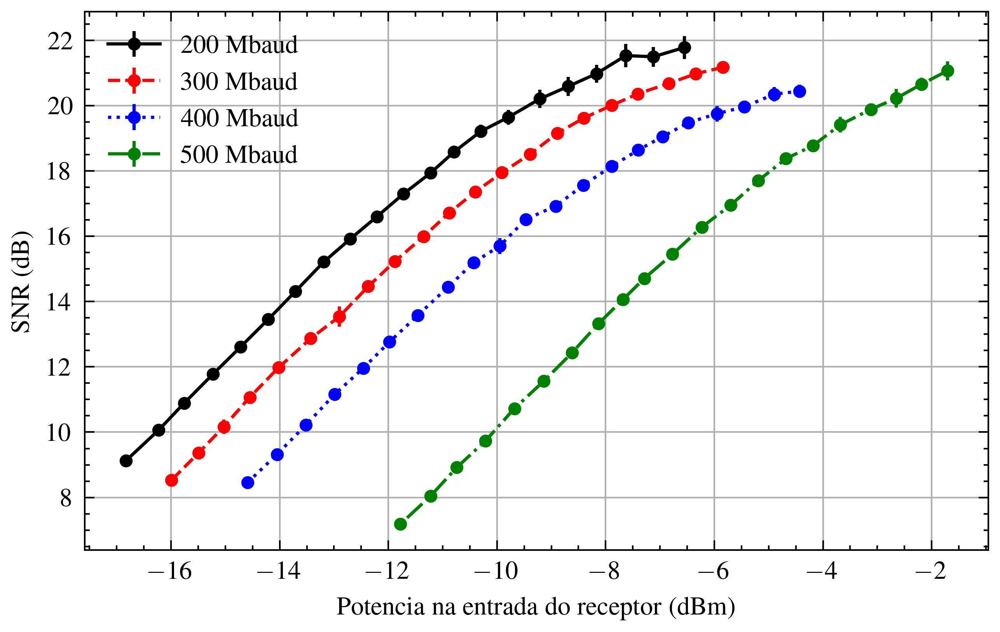

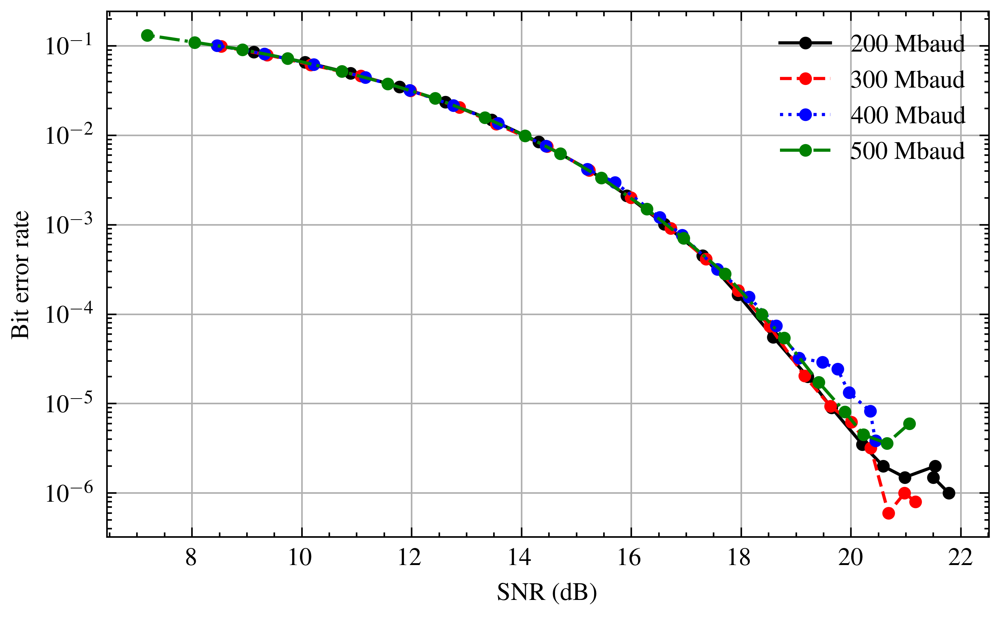

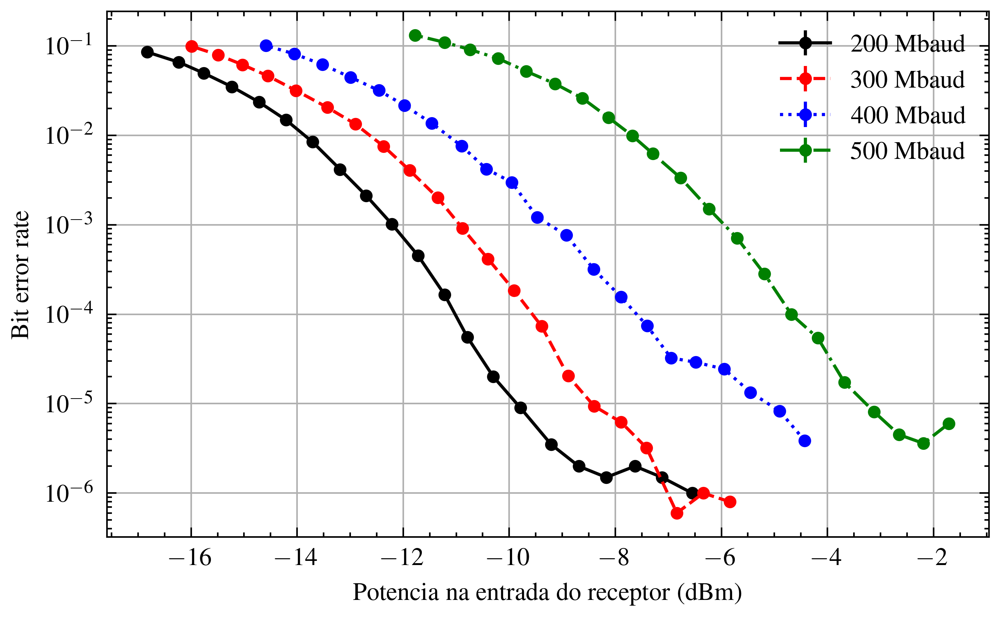

In [40]:
arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_300MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_400MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz'])
legenda = np.array(['200 Mbaud','300 Mbaud','400 Mbaud','500 Mbaud'])

# arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico.npz','Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz'])
# legenda = np.array(['Sem pré-equalização','Com pré-equalização'])

plt.rcParams["figure.figsize"] = (5,3)
for p in range(len(arquivos)):
    resultado = np.load(arquivos[p])
    recebidos = resultado['recebidos']
    atenuacao = resultado['atenuacao']
    snr = resultado['snr']
    ber = resultado['ber']
    Nerros = resultado['Nerros']
    P1 = resultado['P1']
    resultado.keys()


    atenuacao_unica = np.unique(atenuacao)
    if arquivos[p] == 'Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz':
        atenuacao_unica = atenuacao_unica[2:]
    atenuacao_media = np.zeros(len(atenuacao_unica))
    P_media = np.zeros(len(atenuacao_unica))
    snr_media = np.zeros(len(atenuacao_unica))
    ber_media = np.zeros(len(atenuacao_unica))
    snr_var = np.zeros(len(atenuacao_unica))
    ber_var = np.zeros(len(atenuacao_unica))
    Nerros_media = np.zeros(len(atenuacao_unica))

    for i in range(len(atenuacao_unica)):
        np.argwhere(atenuacao==atenuacao_unica[i])
        atenuacao_media[i] = np.mean(atenuacao[np.argwhere(atenuacao==atenuacao_unica[i])])
        P_media[i] = np.mean(P1[np.argwhere(atenuacao==atenuacao_unica[i])])
        snr_media[i] = np.mean(snr[np.argwhere(atenuacao==atenuacao_unica[i])])
        snr_var[i] = np.sqrt(np.var(snr[np.argwhere(atenuacao==atenuacao_unica[i])]))
        #snr_var[i] = np.max(np.abs(snr[np.argwhere(atenuacao==atenuacao_unica[i])]-snr_media[i]))
        ber_media[i] = np.mean(ber[np.argwhere(atenuacao==atenuacao_unica[i])])
        ber_var[i] = np.var(ber[np.argwhere(atenuacao==atenuacao_unica[i])])
        #ber_var[i] = np.max(np.abs(ber[np.argwhere(atenuacao==atenuacao_unica[i])]-ber_media[i]))
        if ber_var[i] >= 1.1*ber_media[i]:
            print('oi')
            ber_var[i] = 1e-8
        Nerros_media[i] = np.mean(Nerros[np.argwhere(atenuacao==atenuacao_unica[i])])

    # plt.figure(1)
    # plt.plot(atenuacao_media,P_media + 20.45,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('Potencia na entrada do receptor (dBm)')
    # plt.grid(visible=True)
    # plt.legend()

    # plt.figure(2)
    # plt.plot(atenuacao_media,snr_media,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('SNR (dB)')
    # plt.grid(visible=True)
    # plt.legend()

    plt.figure(3)
    plt.errorbar(P_media+20.45,snr_media,yerr=snr_var,label=legenda[p], marker="o", markersize=3)
    # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    plt.xlabel('Potencia na entrada do receptor (dBm)')
    plt.ylabel('SNR (dB)')
    plt.grid(visible=True)
    plt.legend()

    ##

    # plt.figure(4)
    # plt.semilogy(atenuacao_media,ber_media,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('Bit error rate')
    # plt.grid(visible=True)
    # plt.legend()

    plt.figure(5)
    plt.errorbar(P_media+20.45,ber_media,yerr=ber_var,label=legenda[p], marker="o", markersize=3)
    # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    plt.xlabel('Potencia na entrada do receptor (dBm)')
    plt.ylabel('Bit error rate')
    plt.grid(visible=True)
    plt.legend()

    plt.figure(6)
    plt.semilogy(snr_media,ber_media,label=legenda[p], marker="o", markersize=3)
    # plt.xlim(snr_media[0],snr_media[-1])
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    plt.xlabel('SNR (dB)')
    plt.ylabel('Bit error rate')
    plt.grid(visible=True)
    plt.legend()

    ##

    # plt.figure(7)
    # plt.semilogy(atenuacao_media,Nerros_media,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('Numero de erros')
    # plt.grid(visible=True)
    # plt.legend()

    # plt.figure(8)
    # plt.semilogy(P_media+20.45,Nerros_media,label=legenda[p])
    # # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Potencia na entrada do receptor (dBm)')
    # plt.ylabel('Numero de erros')
    # plt.grid(visible=True)
    # plt.legend()

    # plt.figure(9)
    # plt.semilogy(snr_media,Nerros_media,label=legenda[p])
    # # plt.xlim(snr_media[0],snr_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('SNR (dBm)')
    # plt.ylabel('Numero de erros')
    # plt.grid(visible=True)
    # plt.legend()
plt.figure(5)
plt.yscale('log')

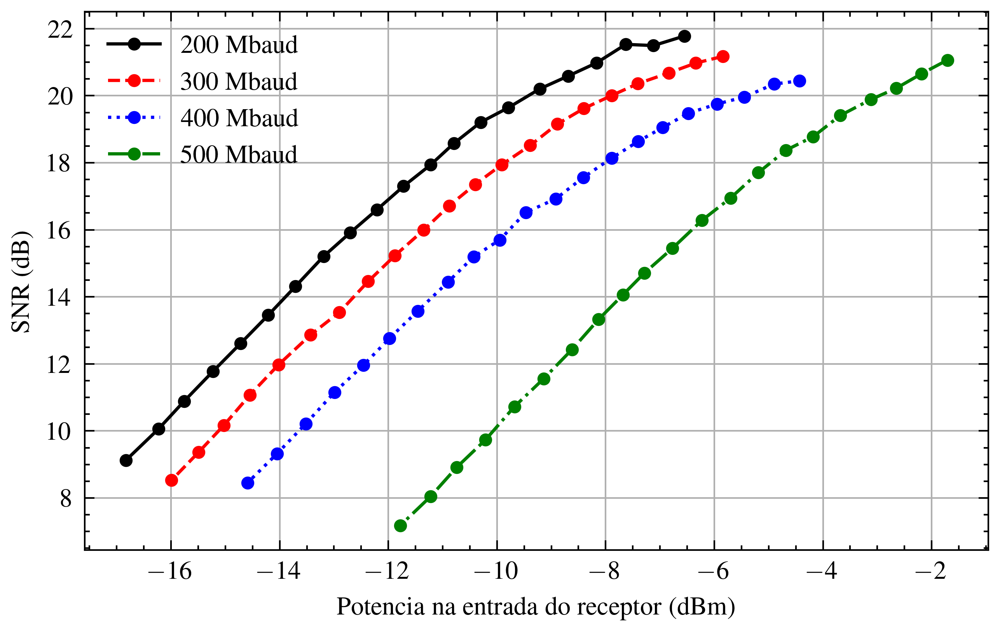

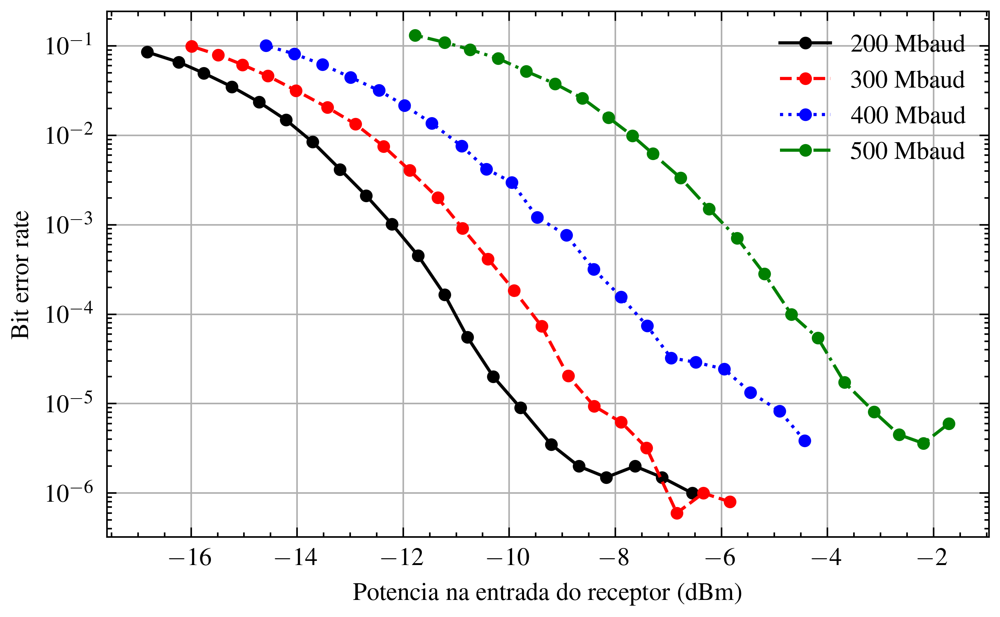

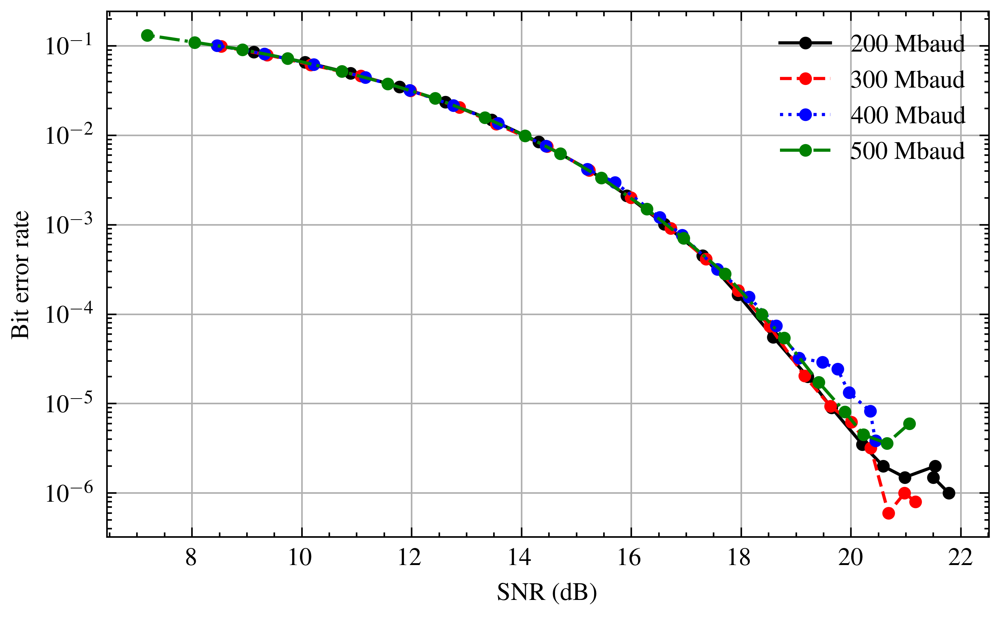

In [4]:
arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_300MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_400MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz'])
legenda = np.array(['200 Mbaud','300 Mbaud','400 Mbaud','500 Mbaud'])

# arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico.npz','Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz'])
# legenda = np.array(['Sem pré-equalização','Com pré-equalização'])

plt.rcParams["figure.figsize"] = (5,3)
for p in range(len(arquivos)):
    resultado = np.load(arquivos[p])
    recebidos = resultado['recebidos']
    atenuacao = resultado['atenuacao']
    snr = resultado['snr']
    ber = resultado['ber']
    Nerros = resultado['Nerros']
    P1 = resultado['P1']
    resultado.keys()


    atenuacao_unica = np.unique(atenuacao)
    if arquivos[p] == 'Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz':
        atenuacao_unica = atenuacao_unica[2:]
    atenuacao_media = np.zeros(len(atenuacao_unica))
    P_media = np.zeros(len(atenuacao_unica))
    snr_media = np.zeros(len(atenuacao_unica))
    ber_media = np.zeros(len(atenuacao_unica))
    Nerros_media = np.zeros(len(atenuacao_unica))

    for i in range(len(atenuacao_unica)):
        np.argwhere(atenuacao==atenuacao_unica[i])
        atenuacao_media[i] = np.mean(atenuacao[np.argwhere(atenuacao==atenuacao_unica[i])])
        P_media[i] = np.mean(P1[np.argwhere(atenuacao==atenuacao_unica[i])])
        snr_media[i] = np.mean(snr[np.argwhere(atenuacao==atenuacao_unica[i])])
        ber_media[i] = np.mean(ber[np.argwhere(atenuacao==atenuacao_unica[i])])
        Nerros_media[i] = np.mean(Nerros[np.argwhere(atenuacao==atenuacao_unica[i])])

    # plt.figure(1)
    # plt.plot(atenuacao_media,P_media + 20.45,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('Potencia na entrada do receptor (dBm)')
    # plt.grid(visible=True)
    # plt.legend()

    # plt.figure(2)
    # plt.plot(atenuacao_media,snr_media,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('SNR (dB)')
    # plt.grid(visible=True)
    # plt.legend()

    plt.figure(3)
    plt.plot(P_media+20.45,snr_media,label=legenda[p], marker="o", markersize=3)
    # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    plt.xlabel('Potencia na entrada do receptor (dBm)')
    plt.ylabel('SNR (dB)')
    plt.grid(visible=True)
    plt.legend()

    ##

    # plt.figure(4)
    # plt.semilogy(atenuacao_media,ber_media,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('Bit error rate')
    # plt.grid(visible=True)
    # plt.legend()

    plt.figure(5)
    plt.semilogy(P_media+20.45,ber_media,label=legenda[p], marker="o", markersize=3)
    # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    plt.xlabel('Potencia na entrada do receptor (dBm)')
    plt.ylabel('Bit error rate')
    plt.grid(visible=True)
    plt.legend()

    plt.figure(6)
    plt.semilogy(snr_media,ber_media,label=legenda[p], marker="o", markersize=3)
    # plt.xlim(snr_media[0],snr_media[-1])
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    plt.xlabel('SNR (dB)')
    plt.ylabel('Bit error rate')
    plt.grid(visible=True)
    plt.legend()

    ##

    # plt.figure(7)
    # plt.semilogy(atenuacao_media,Nerros_media,label=legenda[p])
    # # plt.xlim(atenuacao_media[0],atenuacao_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Atenuação (dB)')
    # plt.ylabel('Numero de erros')
    # plt.grid(visible=True)
    # plt.legend()

    # plt.figure(8)
    # plt.semilogy(P_media+20.45,Nerros_media,label=legenda[p])
    # # plt.xlim(P_media[0]+20.45,P_media[-1]+20.45)
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('Potencia na entrada do receptor (dBm)')
    # plt.ylabel('Numero de erros')
    # plt.grid(visible=True)
    # plt.legend()

    # plt.figure(9)
    # plt.semilogy(snr_media,Nerros_media,label=legenda[p])
    # # plt.xlim(snr_media[0],snr_media[-1])
    # # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    # plt.xlabel('SNR (dBm)')
    # plt.ylabel('Numero de erros')
    # plt.grid(visible=True)
    # plt.legend()

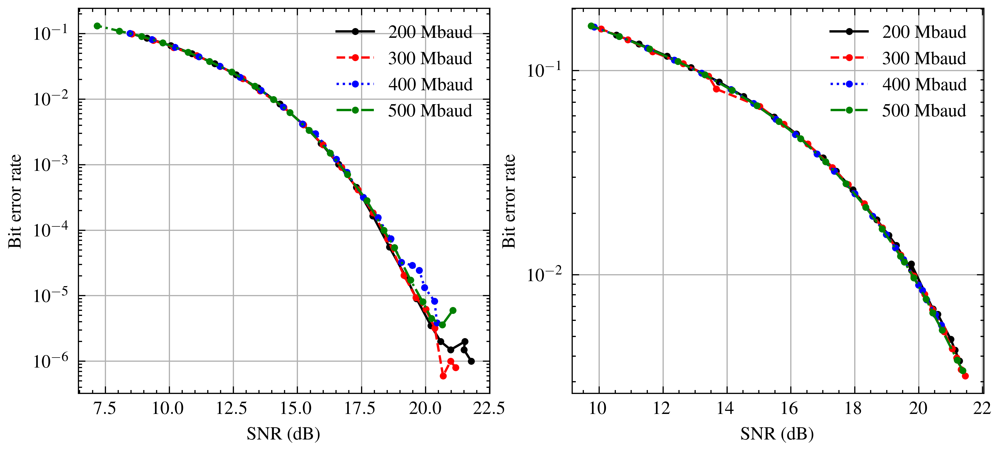

In [11]:
plt.rcParams["figure.figsize"] = (7,3)
fig, (ax1, ax2) = plt.subplots(1, 2)

arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_300MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_400MB_optico-PreEqualizado.npz','Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz'])
legenda = np.array(['200 Mbaud','300 Mbaud','400 Mbaud','500 Mbaud'])

# arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico-8PAM.npz','Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado-8PAM.npz'])
# legenda = np.array(['Sem pré-equalização','Com pré-equalização'])



for p in range(len(arquivos)):
    resultado = np.load(arquivos[p])
    recebidos = resultado['recebidos']
    atenuacao = resultado['atenuacao']
    snr = resultado['snr']
    ber = resultado['ber']
    Nerros = resultado['Nerros']
    P1 = resultado['P1']
    resultado.keys()


    atenuacao_unica = np.unique(atenuacao)
    if arquivos[p] == 'Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz':
        atenuacao_unica = atenuacao_unica[2:]
    atenuacao_media = np.zeros(len(atenuacao_unica))
    P_media = np.zeros(len(atenuacao_unica))
    snr_media = np.zeros(len(atenuacao_unica))
    ber_media = np.zeros(len(atenuacao_unica))
    Nerros_media = np.zeros(len(atenuacao_unica))

    for i in range(len(atenuacao_unica)):
        np.argwhere(atenuacao==atenuacao_unica[i])
        atenuacao_media[i] = np.mean(atenuacao[np.argwhere(atenuacao==atenuacao_unica[i])])
        P_media[i] = np.mean(P1[np.argwhere(atenuacao==atenuacao_unica[i])])
        snr_media[i] = np.mean(snr[np.argwhere(atenuacao==atenuacao_unica[i])])
        ber_media[i] = np.mean(ber[np.argwhere(atenuacao==atenuacao_unica[i])])
        Nerros_media[i] = np.mean(Nerros[np.argwhere(atenuacao==atenuacao_unica[i])])


    ax1.semilogy(snr_media,ber_media,label=legenda[p], marker="o", markersize=2)
    # plt.xlim(snr_media[0],snr_media[-1])
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    ax1.set_xlabel('SNR (dB)')
    ax1.set_ylabel('Bit error rate')
    ax1.grid(visible=True)
    ax1.legend()

arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado-8PAM.npz','Resultados_Experimentos/Experimento_300MB_optico-PreEqualizado-8PAM.npz','Resultados_Experimentos/Experimento_400MB_optico-PreEqualizado-8PAM.npz','Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado-8PAM.npz'])
legenda = np.array(['200 Mbaud','300 Mbaud','400 Mbaud','500 Mbaud'])

# arquivos = np.array(['Resultados_Experimentos/Experimento_200MB_optico-8PAM.npz','Resultados_Experimentos/Experimento_200MB_optico-PreEqualizado-8PAM.npz'])
# legenda = np.array(['Sem pré-equalização','Com pré-equalização'])



for p in range(len(arquivos)):
    resultado = np.load(arquivos[p])
    recebidos = resultado['recebidos']
    atenuacao = resultado['atenuacao']
    snr = resultado['snr']
    ber = resultado['ber']
    Nerros = resultado['Nerros']
    P1 = resultado['P1']
    resultado.keys()


    atenuacao_unica = np.unique(atenuacao)
    if arquivos[p] == 'Resultados_Experimentos/Experimento_500MB_optico-PreEqualizado.npz':
        atenuacao_unica = atenuacao_unica[2:]
    atenuacao_media = np.zeros(len(atenuacao_unica))
    P_media = np.zeros(len(atenuacao_unica))
    snr_media = np.zeros(len(atenuacao_unica))
    ber_media = np.zeros(len(atenuacao_unica))
    Nerros_media = np.zeros(len(atenuacao_unica))

    for i in range(len(atenuacao_unica)):
        np.argwhere(atenuacao==atenuacao_unica[i])
        atenuacao_media[i] = np.mean(atenuacao[np.argwhere(atenuacao==atenuacao_unica[i])])
        P_media[i] = np.mean(P1[np.argwhere(atenuacao==atenuacao_unica[i])])
        snr_media[i] = np.mean(snr[np.argwhere(atenuacao==atenuacao_unica[i])])
        ber_media[i] = np.mean(ber[np.argwhere(atenuacao==atenuacao_unica[i])])
        Nerros_media[i] = np.mean(Nerros[np.argwhere(atenuacao==atenuacao_unica[i])])


    ax2.semilogy(snr_media,ber_media,label=legenda[p], marker="o", markersize=2)
    # plt.xlim(snr_media[0],snr_media[-1])
    # plt.title('Experimento com dispositivos opticos, 4 PAM, 1 Gbit/s, Pré-equalizado')
    ax2.set_xlabel('SNR (dB)')
    ax2.set_ylabel('Bit error rate')
    ax2.grid(visible=True)
    ax2.legend()


